In [1]:
import numpy as np
import pandas as pd
import multiprocessing as mp
import re
import datetime
from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns

import spacy
import nltk
import gensim
from gensim.models import word2vec
from gensim.corpora import Dictionary
from gensim.test.utils import common_texts

from collections import Counter

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import f1_score, classification_report
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.decomposition import LatentDirichletAllocation, PCA, TruncatedSVD
from sklearn.preprocessing import normalize, Normalizer

from sklearn.pipeline import make_pipeline

from sklearn import ensemble
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.cluster import KMeans, SpectralClustering, MeanShift, estimate_bandwidth, DBSCAN
from sklearn.manifold import TSNE

from sklearn.pipeline import Pipeline
from sklearn.neural_network import BernoulliRBM, MLPClassifier

from scipy.cluster.hierarchy import fcluster, dendrogram, linkage


import warnings
plt.rcParams['figure.figsize'] = 10, 8
sns.set(style='whitegrid')

In [2]:
warnings.filterwarnings('ignore')

# 1.) Yelp Reviews

Yelp reviews can cover a wide range of topics, depending on the types of businesses reviewed by users. It may be possible to identify users based on which types of businesses they typically review, the descriptive words they use, or by other features of the reviews themselves. Here we will choose ten prolific Yelp users, who have each written about 200 review or more, and attempt to build a classifier that can determine their identity using different sets of text features.

Such a model could help prevent abuse of online ratings systems. In the case of Yelp, either irate customers or struggling businesses might sign up for multiple fake accounts to artificially weight the star rating to be lower or higher than it ought to be, respectively.

## Contents:

1. Yelp Reviews
2. SpaCy Preprocessing
3. NLTK Preprocessing
4. Distributions/Variable Relationships/Visualizations
5. Clustering of non-word variables
6. Bag of Words Function
7. BoW Classification
8. TF-IDF
9. TF-IDF Classification
10. TF-IDF Classification on LSA-reduced features
11. TF-IDF Visualization
12. Text-Based Clustering
13. GloVe
14. GloVe Visualization
15. GloVe Classifiation
16. Word2Vec
17. Word2Vec Visualization
18. Word2Vec Classifiation
19. Tuning Logit Model
20. Conclusions
21. Sources


## EDA

In [3]:
filename = 'yelp-dataset/reviews_500000.json'

In [4]:
df = pd.read_json(filename)

In [5]:
df.head()

,business_id,cool,date,funny,review_id,stars,text,useful,user_id
0,pomGBqfbxcqPv14c3XH-ZQ,0,2012-11-13,0,dDl8zu1vWPdKGihJrwQbpw,5,I love this place! My fiance And I go here atl...,0,msQe1u7Z_XuqjGoqhB0J5g
1,jtQARsP6P-LbkyjbO1qNGg,1,2014-10-23,1,LZp4UX5zK3e-c5ZGSeo3kA,1,Terrible. Dry corn bread. Rib tips were all fa...,3,msQe1u7Z_XuqjGoqhB0J5g
2,elqbBhBfElMNSrjFqW3now,0,2011-02-25,0,Er4NBWCmCD4nM8_p1GRdow,2,Back in 2005-2007 this place was my FAVORITE t...,2,msQe1u7Z_XuqjGoqhB0J5g
3,Ums3gaP2qM3W1XcA5r6SsQ,0,2014-09-05,0,jsDu6QEJHbwP2Blom1PLCA,5,Delicious healthy food. The steak is amazing. ...,0,msQe1u7Z_XuqjGoqhB0J5g
4,vgfcTvK81oD4r50NMjU2Ag,0,2011-02-25,0,pfavA0hr3nyqO61oupj-lA,1,This place sucks. The customer service is horr...,2,msQe1u7Z_XuqjGoqhB0J5g


In [6]:
df.user_id.value_counts().head(15)

71XStF5U0kmJw2Iym9fclQ    311
HikPdCQGk1mk5JsPjur7Nw    271
2Kgd8_CKyYMvauEA6Z0mAA    239
zT9WFNJXeQZBA-WJMsV4Zw    234
1HFkcIGKY7-e9vCsc8PX5g    227
j5xtbqfOYZbLFd2p8EGi5A    224
ELfzWgdf64VBLi5z1ECItw    214
U3Su5FLssAUKNYonpzIgRw    198
9BuTUHt6Zlm-UCjaGD6aJQ    197
vLixm38Zd-xgAvN1LQJfKQ    197
eeBt7Uo5FOXwvaLIeW3fGA    176
jEBySjq6tgL-_R3P7LHq0w    163
miYadhpWV81SXUEae3LX_A    162
460PoNGmuFFKF4cJ2XQj9A    155
on4PBkuSAUi8gqlJHSyefA    152
Name: user_id, dtype: int64

We'll just use the ten most prolific users' reviews here.

In [7]:
top_ten_users = df.user_id.value_counts().head(10).index

In [8]:
text_lengths = []

for entry in df[df['user_id'].isin(top_ten_users)]['text']:
    text_lengths.append(len(entry))

In [9]:
# Mean length of reviews in characters:

np.mean(text_lengths)

816.7097750865051

In [10]:
# Total character length of all reviews:

sum(text_lengths)

1888233

In [11]:
df1 = pd.DataFrame(df[df['user_id'].isin(top_ten_users)])

In [12]:
type(df1)

pandas.core.frame.DataFrame

In [13]:
df1.index=np.arange(len(df1))

In [14]:
df1.head()

,business_id,cool,date,funny,review_id,stars,text,useful,user_id
0,FAWfhHcwPB5O4xfz70EOug,0,2010-04-23,0,TO-ZK5BHDBCcH7--whiwPg,4,"If you watch the food network long enough, you...",6,U3Su5FLssAUKNYonpzIgRw
1,UofBwHXQ8XR-tI4MwkrJ0A,2,2010-05-19,0,fwtbZXrg2MH1Zty2dHUReA,4,Jan's Meat & Deli is a pleasant Polish market ...,4,U3Su5FLssAUKNYonpzIgRw
2,DG5j9ZSBlgKMVgPjLuZCdw,0,2010-04-22,0,RM6XfIrsh-JWWATqaOpBag,4,If you find yourself in downtown Calgary with ...,2,U3Su5FLssAUKNYonpzIgRw
3,KVdpzUSDbFfFif5QUx7Kyg,5,2010-05-21,2,f8manAU8A8t5Xy6SuW5PqQ,4,"Rice-a-Roni may call themselves the ""San Franc...",7,U3Su5FLssAUKNYonpzIgRw
4,DvdL82xg-Vpz8GsPruwhag,0,2010-04-17,0,RpCtY8slrdFVWwQ6iXSQQw,4,This cute little bakery in Glenmore Landing ha...,1,U3Su5FLssAUKNYonpzIgRw


In [15]:
df1['user_num'] = df1['user_id'].map({'71XStF5U0kmJw2Iym9fclQ':0,
                                      'HikPdCQGk1mk5JsPjur7Nw':1,
                                      '2Kgd8_CKyYMvauEA6Z0mAA':2,
                                      'zT9WFNJXeQZBA-WJMsV4Zw':3,
                                      '1HFkcIGKY7-e9vCsc8PX5g':4,
                                      'j5xtbqfOYZbLFd2p8EGi5A':5,
                                      'ELfzWgdf64VBLi5z1ECItw':6,
                                      'U3Su5FLssAUKNYonpzIgRw':7,
                                      'vLixm38Zd-xgAvN1LQJfKQ':8,
                                      '9BuTUHt6Zlm-UCjaGD6aJQ':9})

In [16]:
# The two least-prolific users have switched in order. 
# This shouldn't create any problems, but we'll keep an eye on it.

df1.user_num.value_counts().head(10)

0    311
1    271
2    239
3    234
4    227
5    224
6    214
7    198
9    197
8    197
Name: user_num, dtype: int64

In [17]:
df1['user_num'].unique()

array([7, 9, 6, 8, 1, 3, 2, 5, 4, 0])

### Date-Related Features

In [18]:
df1['datetime'] = df1['date'].apply(lambda x: datetime.date(x.year,x.month,x.day))

In [19]:
# Age in Days of Review

datemax = df1['datetime'].max()

df1['age_days'] = df1['datetime'].apply(lambda x: (datemax - x).days)

In [20]:
# Month of the Year

df1['month'] = df1['datetime'].apply(lambda x: x.month)

### Length of Review (in characters, words)

In [21]:
# Create features for character, word length of each review:

df1['review_length'] = df1['text'].apply(lambda x: len(x))
df1['words_in_review'] = [len(x) for x in df1['text'].str.split()]

In [22]:
userlist = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

### Rating Distributions of Each User

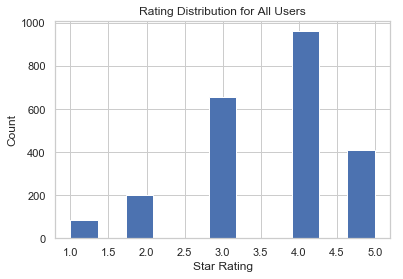

In [23]:
plt.hist(df1['stars'], bins=11)
plt.title('Rating Distribution for All Users')
plt.xlabel('Star Rating')
plt.ylabel('Count')
plt.show()


User: 0 
 count    311.000000
mean       3.723473
std        0.902003
min        1.000000
25%        3.000000
50%        4.000000
75%        4.000000
max        5.000000
Name: stars, dtype: float64 



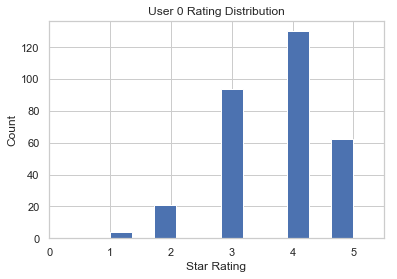


User: 1 
 count    271.000000
mean       3.896679
std        0.832460
min        1.000000
25%        3.000000
50%        4.000000
75%        4.000000
max        5.000000
Name: stars, dtype: float64 



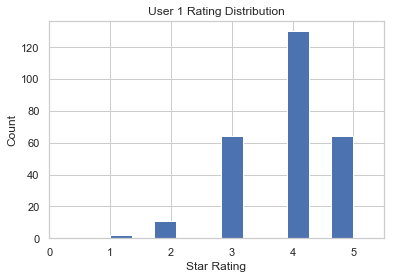


User: 2 
 count    239.000000
mean       3.949791
std        0.823493
min        2.000000
25%        4.000000
50%        4.000000
75%        4.500000
max        5.000000
Name: stars, dtype: float64 



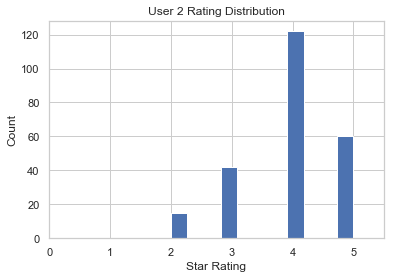


User: 3 
 count    234.000000
mean       3.649573
std        0.744839
min        1.000000
25%        3.000000
50%        4.000000
75%        4.000000
max        5.000000
Name: stars, dtype: float64 



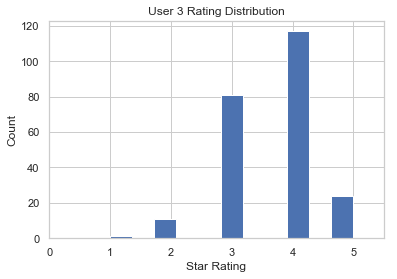


User: 4 
 count    227.000000
mean       3.528634
std        0.903689
min        1.000000
25%        3.000000
50%        4.000000
75%        4.000000
max        5.000000
Name: stars, dtype: float64 



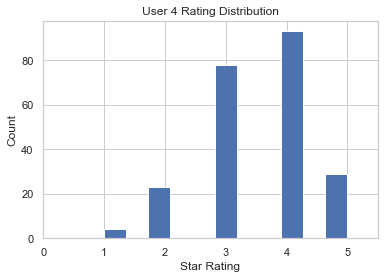


User: 5 
 count    224.000000
mean       3.080357
std        0.827101
min        1.000000
25%        3.000000
50%        3.000000
75%        4.000000
max        5.000000
Name: stars, dtype: float64 



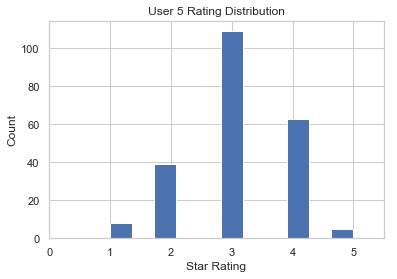


User: 6 
 count    214.000000
mean       3.457944
std        1.090121
min        1.000000
25%        3.000000
50%        4.000000
75%        4.000000
max        5.000000
Name: stars, dtype: float64 



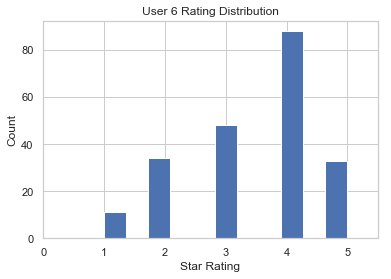


User: 7 
 count    198.000000
mean       3.848485
std        0.717633
min        1.000000
25%        3.000000
50%        4.000000
75%        4.000000
max        5.000000
Name: stars, dtype: float64 



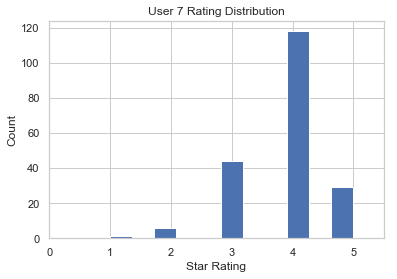


User: 8 
 count    197.000000
mean       3.746193
std        0.993113
min        1.000000
25%        3.000000
50%        4.000000
75%        4.000000
max        5.000000
Name: stars, dtype: float64 



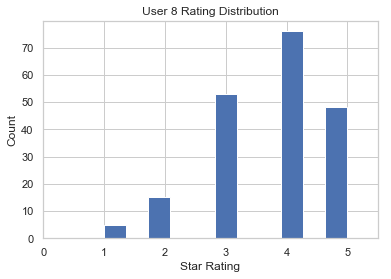


User: 9 
 count    197.000000
mean       3.045685
std        1.532952
min        1.000000
25%        2.000000
50%        3.000000
75%        5.000000
max        5.000000
Name: stars, dtype: float64 



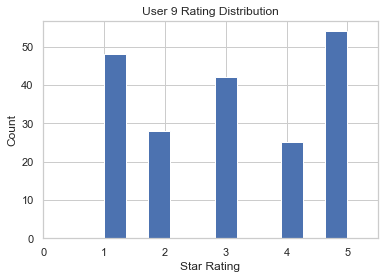

In [24]:
show_vis = True

if show_vis == True:
    for user in userlist:
        print('\nUser:', user, '\n', df1[df1['user_num'] == user]['stars'].describe(), '\n')
        
        plt.hist(df1[df1['user_num'] == user]['stars'], bins=11)
        
        plt.title('User {} Rating Distribution'.format(user))
        plt.xlim(0, 5.5)
        plt.ylabel('Count')
        plt.xlabel('Star Rating')
        plt.show()

The rating distributions for most of the users are unimodal, some with more left-skewness than others. However, User 9's reviews are much more polarized, showing a higher proportion of ratings than other users at the extreme ends of the rating scale.

In [25]:
df1.dtypes

business_id                object
cool                        int64
date               datetime64[ns]
funny                       int64
review_id                  object
stars                       int64
text                       object
useful                      int64
user_id                    object
user_num                    int64
datetime                   object
age_days                    int64
month                       int64
review_length               int64
words_in_review             int64
dtype: object

In [26]:
df1.describe()

,cool,funny,stars,useful,user_num,age_days,month,review_length,words_in_review
count,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000
mean,1.036332,1.017301,3.608564,2.578287,4.108131,2293.922145,7.228806,816.709775,148.975779
std,1.765204,2.182035,0.992562,3.424012,2.906071,922.842995,3.276258,551.305089,101.620327
min,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,58.000000,10.000000
25%,0.000000,0.000000,3.000000,1.000000,1.000000,1594.000000,4.000000,474.750000,87.000000
50%,0.000000,0.000000,4.000000,2.000000,4.000000,2300.000000,8.000000,677.000000,123.000000
75%,1.000000,1.000000,4.000000,3.000000,7.000000,3340.000000,10.000000,974.000000,176.250000
max,29.000000,28.000000,5.000000,49.000000,9.000000,3426.000000,12.000000,4878.000000,932.000000


## Text Cleaning

In [27]:
def text_cleaner1(text):
    
    # Remove '--' if there are any instances of it so SpaCy can process the text
    text = re.sub(r'--',' ',text)
    
    # Get rid of headings in square brackets.
    text = re.sub("[\[].*?[\]]", "", text)
    
    # Get rid of chapter titles.
    text = re.sub(r'Chapter \d+','',text)
    
    # Get rid of extra whitespace.
    text = ' '.join(text.split())
    
    return text

In [28]:
df1['cleaned_text1'] = df1['text'].apply(lambda x: text_cleaner1(x))

In [29]:
df1['cleaned_text1'].head()

0    If you watch the food network long enough, you...
1    Jan's Meat & Deli is a pleasant Polish market ...
2    If you find yourself in downtown Calgary with ...
3    Rice-a-Roni may call themselves the "San Franc...
4    This cute little bakery in Glenmore Landing ha...
Name: cleaned_text1, dtype: object

# 2.) SpaCy Preprocessing

In [30]:
nlp = spacy.load('en')

In [31]:
df1['nlp_text'] = df1['cleaned_text1'].apply(lambda x: nlp(x))

In [32]:
# Functions to compute number of sentences, average sentence length in words

def mean_sentence_length(x):
    """Input: x = SpaCy.load document object"""
    entrysents = [sent for sent in x.sents]
    sentlengths = []
    for entry in entrysents:
        sentlengths.append(len(entry))
    
    return np.mean(sentlengths)


def max_sentence_length(x):
    """Input: x = SpaCy.load document object"""
    entrysents = [sent for sent in x.sents]
    sentlengths = []
    for entry in entrysents:
        sentlengths.append(len(entry))
    
    return np.max(sentlengths)
    
    
def num_sentences(x):
    """Input: x = SpaCy.load document object"""
    entrysents = [sent for sent in x.sents]
    
    return len(entrysents)

In [33]:
df1['num_sents'] = df1['nlp_text'].apply(lambda x: num_sentences(x))

In [34]:
df1['mean_sent_length'] = df1['nlp_text'].apply(lambda x: mean_sentence_length(x))

In [35]:
df1['max_sent_length'] = df1['nlp_text'].apply(lambda x: max_sentence_length(x))

In [36]:
df1.columns

Index(['business_id', 'cool', 'date', 'funny', 'review_id', 'stars', 'text',
       'useful', 'user_id', 'user_num', 'datetime', 'age_days', 'month',
       'review_length', 'words_in_review', 'cleaned_text1', 'nlp_text',
       'num_sents', 'mean_sent_length', 'max_sent_length'],
      dtype='object')

# 3.) NLTK Preprocessing

In [37]:
wpt = nltk.WordPunctTokenizer()
stop_words = nltk.corpus.stopwords.words('english')

We are removing stop words here rather than in the vectorizer itself, becuase this lets us choose the stop words list instead of relying on SKLearn's list (which is based on the Glasgow IR list). We have selected NLTK's list, which is based in part on the Snowball stop words list.

In [38]:
def normalize_document(doc):
    """Input: text string. Output: cleaned, NLTK-tokenized words with stop words removed"""
    # lower case and remove special characters/whitespaces
    doc = re.sub(r'[^a-zA-Z\s]', '', doc, re.I|re.A)
    doc = doc.lower()
    doc = doc.strip()
    # tokenize document
    tokens = wpt.tokenize(doc)
    # filter stopwords out of document
    filtered_tokens = [token for token in tokens if token not in stop_words]
    # re-create document from filtered tokens
    doc = ' '.join(filtered_tokens)
    return doc

normalize_corpus = np.vectorize(normalize_document)

In [39]:
df1['cleaned_text2'] = df1['text'].apply(lambda x: normalize_corpus(x))

## NLTK POS Counts

In [40]:
def adj_adv_count(x, adj_adv_list=['JJ','JJR','JJS','RB','RBR','RBS']):
    """Input: text cleaned for NLTK, with stop words removed"""
    tokens = nltk.word_tokenize(x)
    pos_tags = nltk.pos_tag(tokens)
    
    adjectives = []
    
    for tag in pos_tags:
        if tag[1] in adj_adv_list:
            adjectives.append(tag[0])
        
    return (len(adjectives))

def unique_word_count(x):
    """Input: text"""
    x = re.sub(r'[^a-zA-Z\s]', '', x, re.I|re.A)
    x = x.lower()
    x = x.strip()
    
    tokens = nltk.word_tokenize(x)
    
    unique_words = []
    for token in tokens:
        if token not in unique_words:
            unique_words.append(token)

    return len(unique_words)
    

In [41]:
df1['adj_adv_count'] = df1['cleaned_text2'].apply(lambda x: adj_adv_count(x))

In [42]:
df1['unique_word_count'] = df1['cleaned_text1'].apply(lambda x: unique_word_count(x))

# 4.) Distributions/Variable Relationships

## Most Common Words by User

In [43]:
# Print top 40 words per user:

for user in userlist:
    descriptors = df1[df1['user_num'] == user]['cleaned_text2'].str.cat(sep=' ').split()
    userwords = pd.DataFrame(descriptors)[0].value_counts()
    print("User {}'s most common words:".format(user), '\n')
    print(userwords.head(40), '\n')

User 0's most common words: 

good          213
like          181
food          154
menu          131
place         114
get           106
one           103
great          97
nice           96
also           96
go             94
service        94
chicken        93
well           90
sauce          89
stars          89
really         80
would          80
meat           78
youre          78
restaurant     73
two            67
pretty         66
selection      66
tasty          64
dont           64
bit            64
dishes         62
quite          62
cheese         59
better         59
small          59
quality        59
hot            55
many           54
back           52
price          51
time           51
fresh          50
items          50
Name: 0, dtype: int64 

User 1's most common words: 

like       247
great      150
get        140
one        133
go         126
good       113
youre      105
bar         93
place       90
best        87
really      84
spot        84
also        83
p

Users 1, 3, 6, and 7 include place names in their reviews (Toronto, Bloor, Vegas, and Calgary, respectively). This could potentially be a source of overfitting

## Variable Distributions

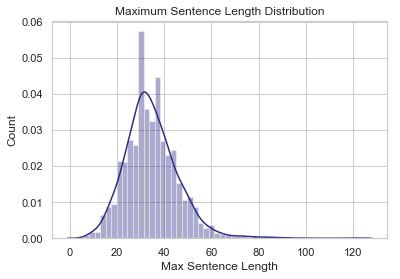

In [44]:
sns.distplot(df1['max_sent_length'], color='#2d2d86')

plt.xlabel('Max Sentence Length')
plt.ylabel('Count')
plt.title('Maximum Sentence Length Distribution')
plt.show()

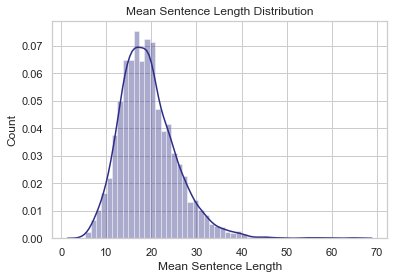

In [45]:
sns.distplot(df1['mean_sent_length'], color='#2d2d86')

plt.xlabel('Mean Sentence Length')
plt.ylabel('Count')
plt.title('Mean Sentence Length Distribution')
plt.show()

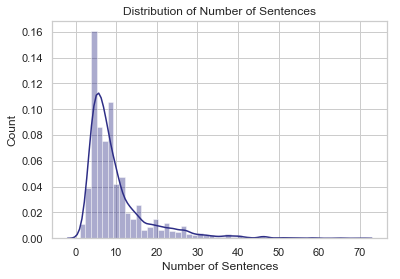

In [46]:
sns.distplot(df1['num_sents'], color='#2d2d86')

plt.xlabel('Number of Sentences')
plt.ylabel('Count')
plt.title('Distribution of Number of Sentences')
plt.show()

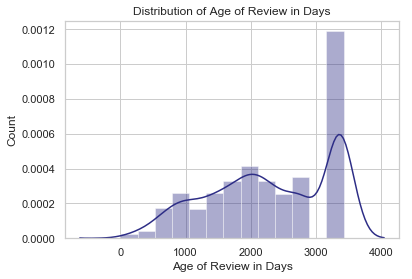

In [47]:
sns.distplot(df1['age_days'], color='#2d2d86')

plt.xlabel('Age of Review in Days')
plt.ylabel('Count')
plt.title('Distribution of Age of Review in Days')
plt.show()

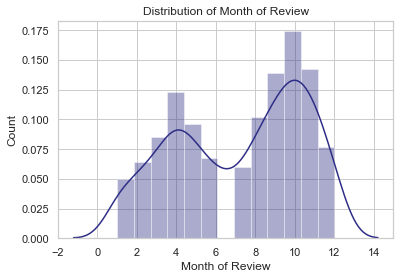

In [48]:
sns.distplot(df1['month'], color='#2d2d86')

plt.xlabel('Month of Review')
plt.ylabel('Count')
plt.title('Distribution of Month of Review')
plt.show()

## Visualization by User

In [49]:
users_w_count = [str(user) + ': (' + str(len(df1[df1['user_num'] == user])) + ')' for user in userlist]

### Funny

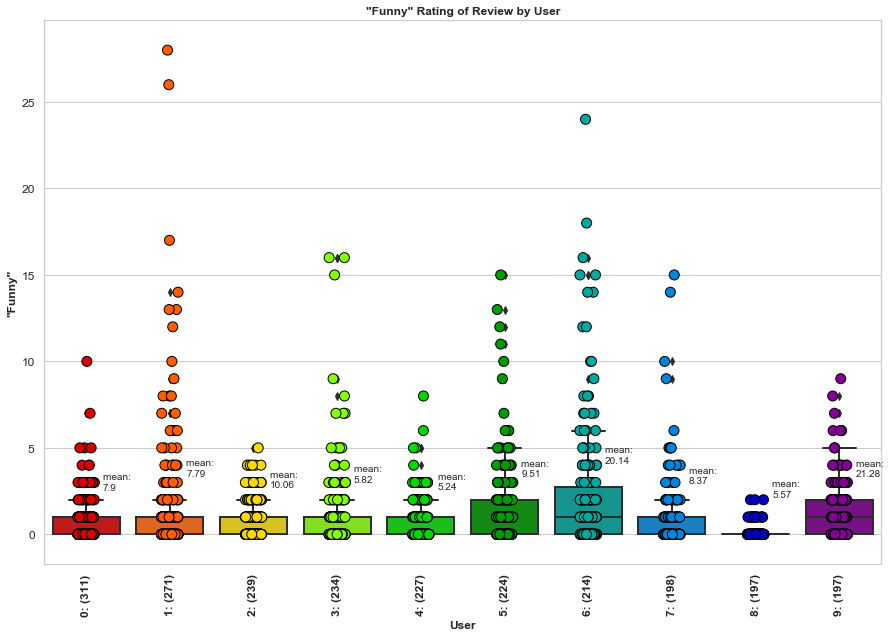

In [50]:
plt.rcParams['figure.figsize'] = (15, 10)

ax = sns.boxplot(x='user_num', y='funny', data=df1, palette='nipy_spectral_r', linewidth=2)
ax = sns.stripplot(x='user_num', y='funny', data=df1, palette='nipy_spectral_r', linewidth=1,
                   size=10, edgecolor='black')

yposlist = np.round(df1.groupby(['user_num'])['funny'].mean().tolist(), 2)
yposlist = [pos + 2 for pos in yposlist]
xposlist = range(len(yposlist))
xposlist = [pos + 0.2 for pos in xposlist]
stringlist = ['mean: \n' + str(np.round(df1[df1['user_num'] == user].num_sents.mean(), 2)) for user in userlist]

for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])


ax.set_xticklabels(users_w_count, rotation=90, fontsize=12, weight='bold')
ax.axes.set_title('"Funny" Rating of Review by User', weight='bold')
ax.set_xlabel('User', fontsize=12, weight='bold')
ax.set_ylabel('"Funny"', fontsize=12, weight='bold')
ax.tick_params(labelsize=12)

plt.show()

### Cool

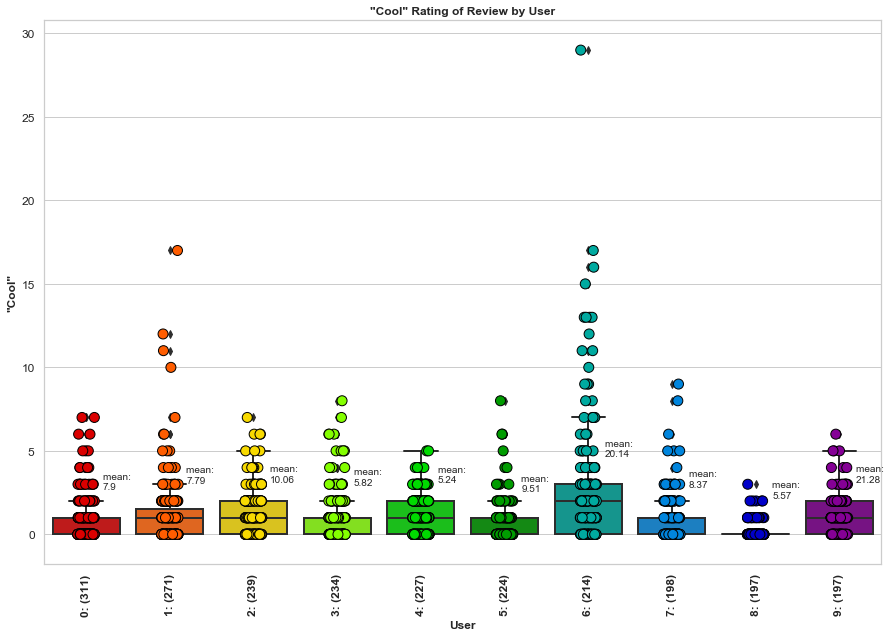

In [51]:
plt.rcParams['figure.figsize'] = (15, 10)

ax = sns.boxplot(x='user_num', y='cool', data=df1, palette='nipy_spectral_r', linewidth=2)
ax = sns.stripplot(x='user_num', y='cool', data=df1, palette='nipy_spectral_r', linewidth=1,
                   size=10, edgecolor='black')

yposlist = np.round(df1.groupby(['user_num'])['cool'].mean().tolist(), 2)
yposlist = [pos + 2 for pos in yposlist]
xposlist = range(len(yposlist))
xposlist = [pos + 0.2 for pos in xposlist]
stringlist = ['mean: \n' + str(np.round(df1[df1['user_num'] == user].num_sents.mean(), 2)) for user in userlist]

for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])

ax.set_xticklabels(users_w_count, rotation=90, fontsize=12, weight='bold')
ax.axes.set_title('"Cool" Rating of Review by User', weight='bold')
ax.set_xlabel('User', fontsize=12, weight='bold')
ax.set_ylabel('"Cool"', fontsize=12, weight='bold')
ax.tick_params(labelsize=12)

plt.show()

### Useful

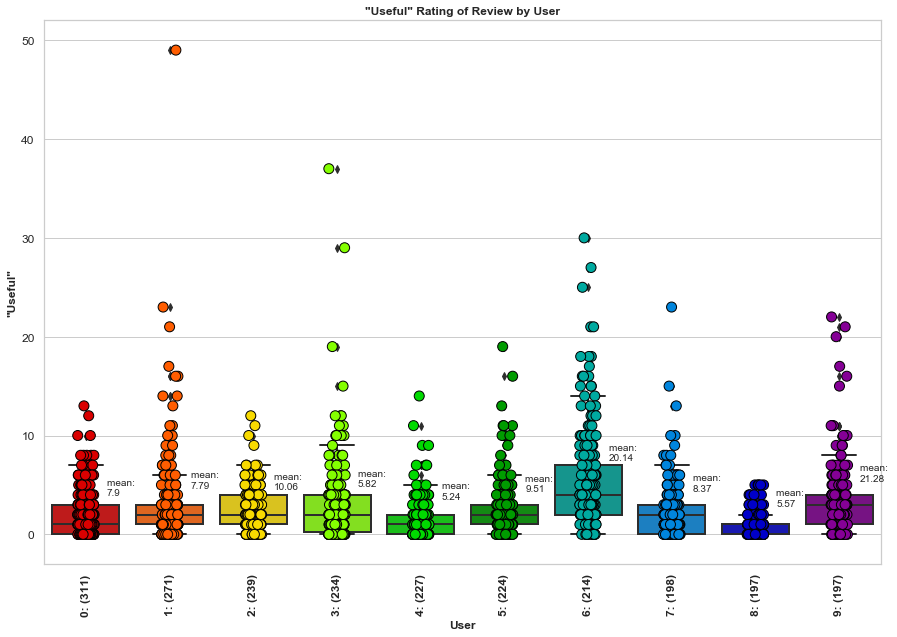

In [52]:
plt.rcParams['figure.figsize'] = (15, 10)

ax = sns.boxplot(x='user_num', y='useful', data=df1, palette='nipy_spectral_r', linewidth=2)
ax = sns.stripplot(x='user_num', y='useful', data=df1, palette='nipy_spectral_r', linewidth=1,
                   size=10, edgecolor='black')

yposlist = np.round(df1.groupby(['user_num'])['useful'].mean().tolist(), 2)
yposlist = [pos + 2 for pos in yposlist]
xposlist = range(len(yposlist))
xposlist = [pos + 0.25 for pos in xposlist]
stringlist = ['mean: \n' + str(np.round(df1[df1['user_num'] == user].num_sents.mean(), 2)) for user in userlist]

for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])


ax.set_xticklabels(users_w_count, rotation=90, fontsize=12, weight='bold')
ax.axes.set_title('"Useful" Rating of Review by User', weight='bold')
ax.set_xlabel('User', fontsize=12, weight='bold')
ax.set_ylabel('"Useful"', fontsize=12, weight='bold')
ax.tick_params(labelsize=12)

plt.show()

### Number of Sentences

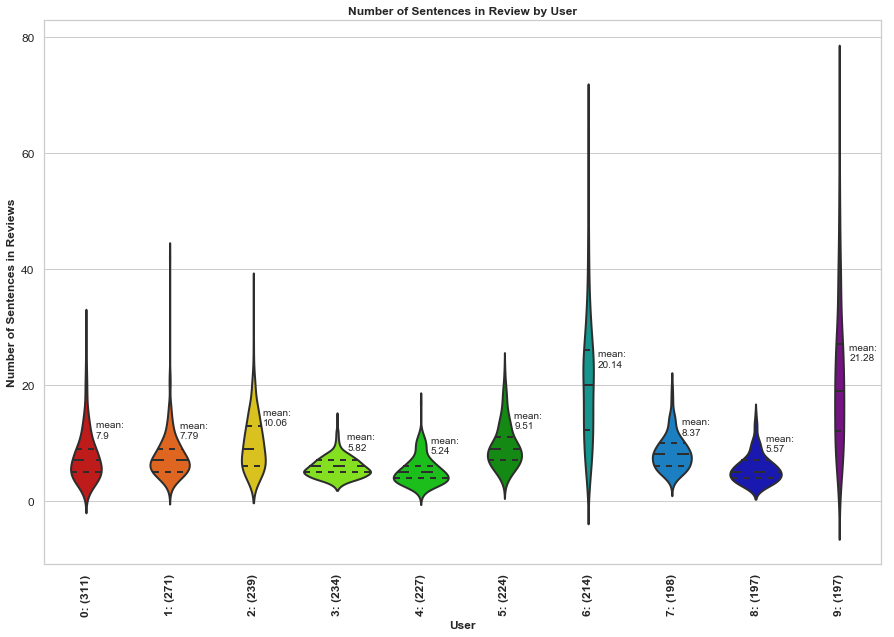

In [53]:
plt.rcParams['figure.figsize'] = (15, 10)

ax = sns.violinplot(x='user_num', y='num_sents', data=df1, palette='nipy_spectral_r', linewidth=2,
                   inner='quartile')

yposlist = np.round(df1.groupby(['user_num'])['num_sents'].mean().tolist(), 2)
yposlist = [pos + 3 for pos in yposlist]
xposlist = range(len(yposlist))
xposlist = [pos + 0.12 for pos in xposlist]
stringlist = ['mean: \n' + str(np.round(df1[df1['user_num'] == user].num_sents.mean(), 2)) for user in userlist]

for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])

ax.set_xticklabels(users_w_count, rotation=90, fontsize=12, weight='bold')
ax.axes.set_title('Number of Sentences in Review by User', weight='bold')
ax.set_xlabel('User', fontsize=12, weight='bold')
ax.set_ylabel('Number of Sentences in Reviews', fontsize=12, weight='bold')
ax.tick_params(labelsize=12)

plt.show()

### Mean Sentence Length

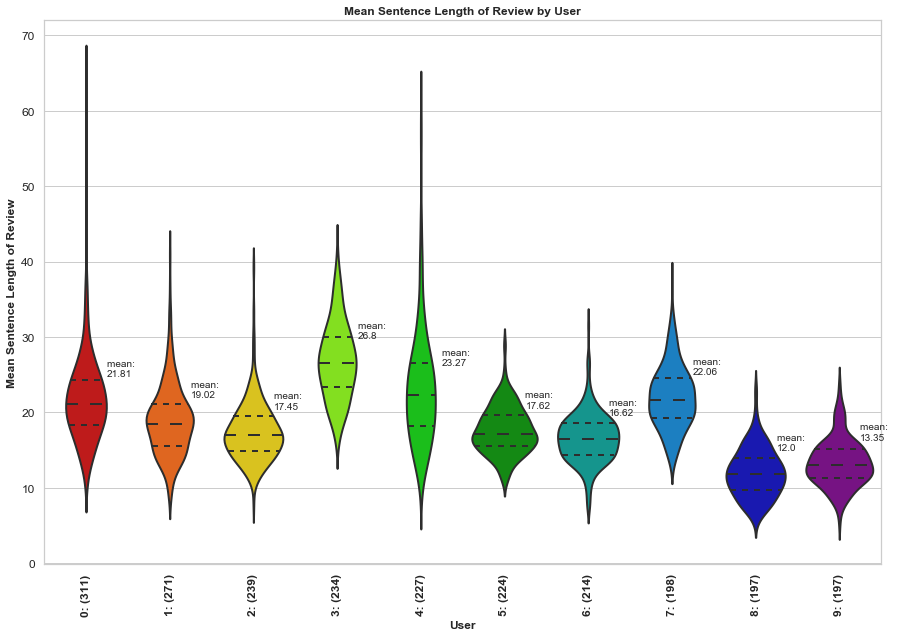

In [54]:
plt.rcParams['figure.figsize'] = (15, 10)

ax = sns.violinplot(x='user_num', y='mean_sent_length', data=df1, palette='nipy_spectral_r', linewidth=2,
                   inner='quartile')

yposlist = np.round(df1.groupby(['user_num'])['mean_sent_length'].mean().tolist(), 2)
yposlist = [pos + 3 for pos in yposlist]
xposlist = range(len(yposlist))
xposlist = [pos + 0.25 for pos in xposlist]
stringlist = ['mean: \n' + str(np.round(df1[df1['user_num'] == user].mean_sent_length.mean(), 2)) for user in userlist]

for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])


ax.set_xticklabels(users_w_count, rotation=90, fontsize=12, weight='bold')
ax.axes.set_title('Mean Sentence Length of Review by User', weight='bold')
ax.set_xlabel('User', fontsize=12, weight='bold')
ax.set_ylabel('Mean Sentence Length of Review', fontsize=12, weight='bold')
ax.tick_params(labelsize=12)

plt.show()

### Max Sentence Length

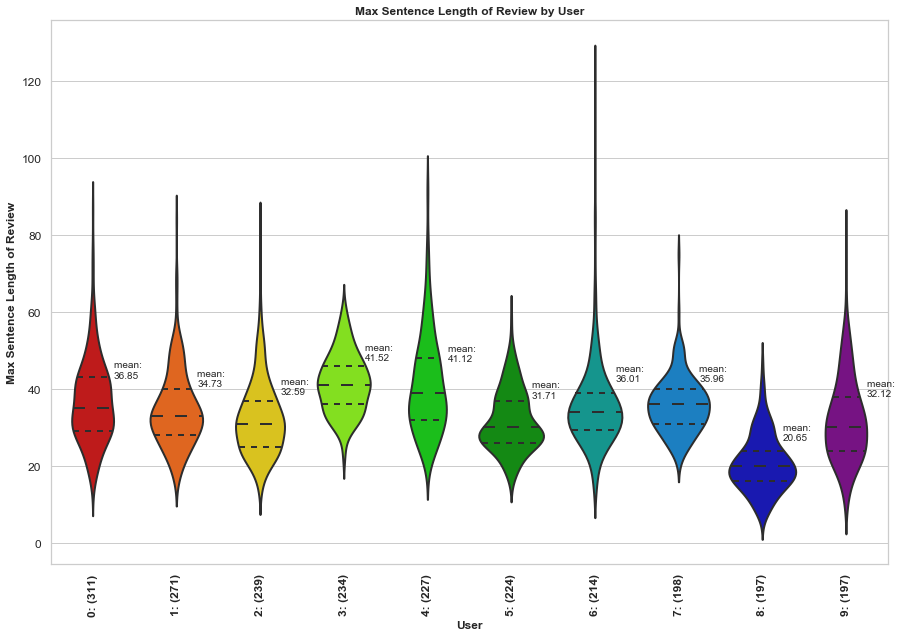

In [55]:
plt.rcParams['figure.figsize'] = (15, 10)

ax = sns.violinplot(x='user_num', y='max_sent_length', data=df1, palette='nipy_spectral_r', linewidth=2,
                   inner='quartile')

yposlist = np.round(df1.groupby(['user_num'])['max_sent_length'].mean().tolist(), 2)
yposlist = [pos + 6 for pos in yposlist]
xposlist = range(len(yposlist))
xposlist = [pos + 0.25 for pos in xposlist]
stringlist = ['mean: \n' + str(np.round(df1[df1['user_num'] == user].max_sent_length.mean(), 2)) for user in userlist]

for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])


ax.set_xticklabels(users_w_count, rotation=90, fontsize=12, weight='bold')
ax.axes.set_title('Max Sentence Length of Review by User', weight='bold')
ax.set_xlabel('User', fontsize=12, weight='bold')
ax.set_ylabel('Max Sentence Length of Review', fontsize=12, weight='bold')
ax.tick_params(labelsize=12)

plt.show()

### Adjective/Adverb Count

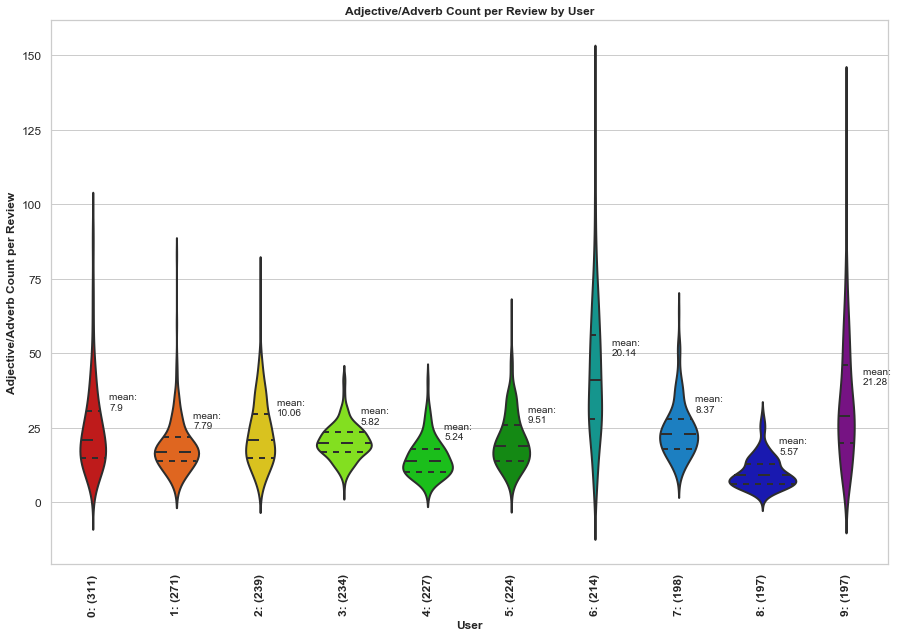

In [56]:
plt.rcParams['figure.figsize'] = (15, 10)

ax = sns.violinplot(x='user_num', y='adj_adv_count', data=df1, palette='nipy_spectral_r', linewidth=2,
                   inner='quartile')

yposlist = np.round(df1.groupby(['user_num'])['adj_adv_count'].mean().tolist(), 2)
yposlist = [pos + 6 for pos in yposlist]
xposlist = range(len(yposlist))
xposlist = [pos + 0.2 for pos in xposlist]
stringlist = ['mean: \n' + str(np.round(df1[df1['user_num'] == user].num_sents.mean(), 2)) for user in userlist]

for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])


ax.set_xticklabels(users_w_count, rotation=90, fontsize=12, weight='bold')
ax.axes.set_title('Adjective/Adverb Count per Review by User', weight='bold')
ax.set_xlabel('User', fontsize=12, weight='bold')
ax.set_ylabel('Adjective/Adverb Count per Review', fontsize=12, weight='bold')
ax.tick_params(labelsize=12)

plt.show()

### Adjective-Adverb Count / Word Count

In [57]:
df1['adj/words'] = df1['adj_adv_count']/df1['words_in_review']

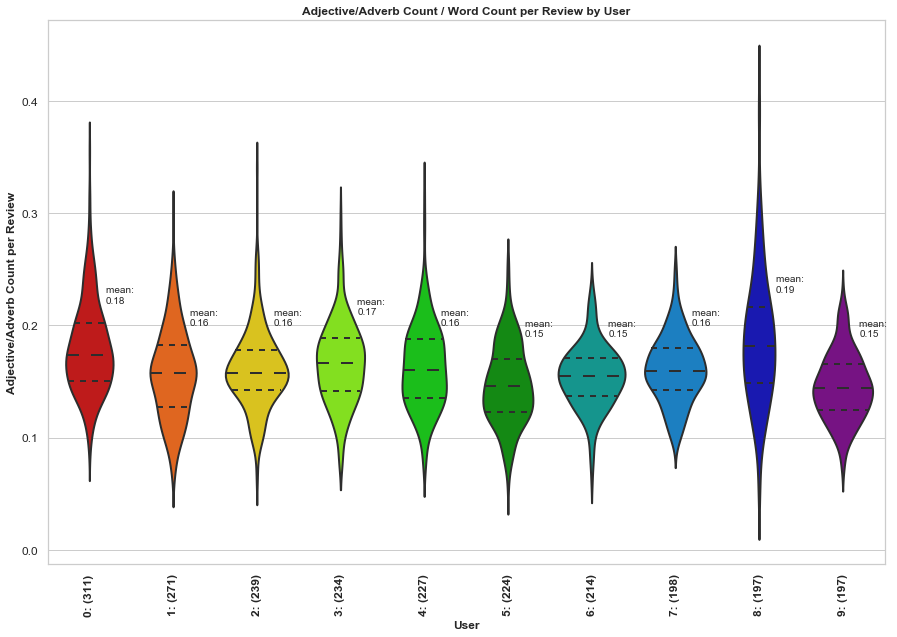

In [58]:
plt.rcParams['figure.figsize'] = (15, 10)

ax = sns.violinplot(x='user_num', y='adj/words', data=df1, palette='nipy_spectral_r', linewidth=2,
                   inner='quartile')

yposlist = np.round(df1.groupby(['user_num'])['adj/words'].mean().tolist(), 2)
yposlist = [pos + 0.04 for pos in yposlist]
xposlist = range(len(yposlist))
xposlist = [pos + 0.2 for pos in xposlist]
stringlist = ['mean: \n' + str(np.round(df1[df1['user_num'] == user]['adj/words'].mean(), 2)) for user in userlist]

for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])


ax.set_xticklabels(users_w_count, rotation=90, fontsize=12, weight='bold')
ax.axes.set_title('Adjective/Adverb Count / Word Count per Review by User', weight='bold')
ax.set_xlabel('User', fontsize=12, weight='bold')
ax.set_ylabel('Adjective/Adverb Count per Review', fontsize=12, weight='bold')
ax.tick_params(labelsize=12)

plt.show()

In [59]:
df1[df1['user_num'] == 8]['text'].head()

434    Very enjoyable and personal trail ride! We lea...
435    Really like how the food is fresher and health...
436    Great prices, good food as well. It's a fun pl...
437    Very friendly service and so inexpensive for p...
438    Very good food and service! We got a delicious...
Name: text, dtype: object

### Unique Word Count

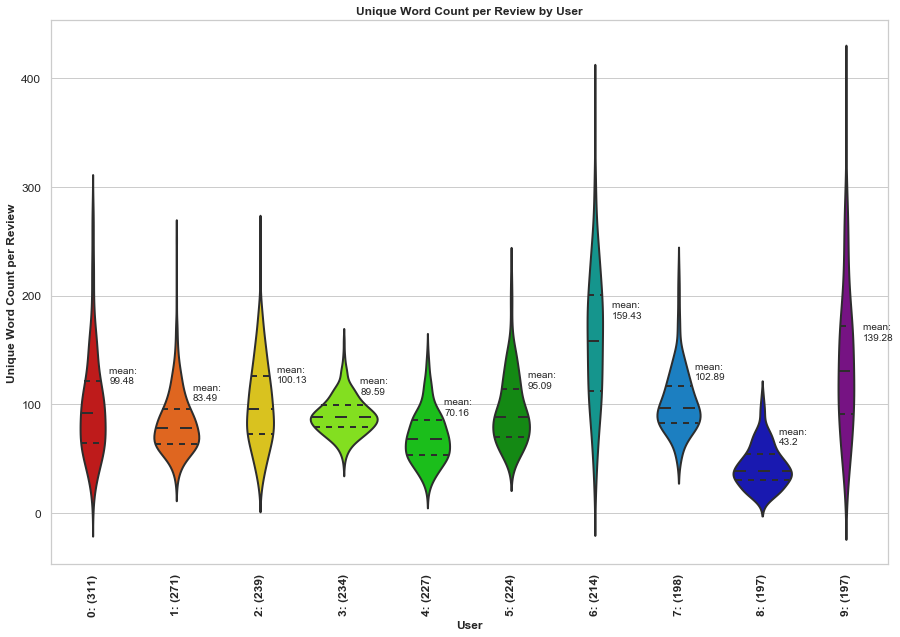

In [60]:
plt.rcParams['figure.figsize'] = (15, 10)

ax = sns.violinplot(x='user_num', y='unique_word_count', data=df1, palette='nipy_spectral_r', linewidth=2,
                   inner='quartile')

yposlist = np.round(df1.groupby(['user_num'])['unique_word_count'].mean().tolist(), 2)
yposlist = [pos + 20 for pos in yposlist]
xposlist = range(len(yposlist))
xposlist = [pos + 0.2 for pos in xposlist]
stringlist = ['mean: \n' + str(np.round(df1[df1['user_num'] == user]['unique_word_count'].mean(), 2)) for user in userlist]

for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])


ax.set_xticklabels(users_w_count, rotation=90, fontsize=12, weight='bold')
ax.axes.set_title('Unique Word Count per Review by User', weight='bold')
ax.set_xlabel('User', fontsize=12, weight='bold')
ax.set_ylabel('Unique Word Count per Review', fontsize=12, weight='bold')
ax.tick_params(labelsize=12)

plt.show()

### Unique Word Count / Word Count

In [61]:
df1['unique_words/words'] = df1['unique_word_count']/df1['words_in_review']

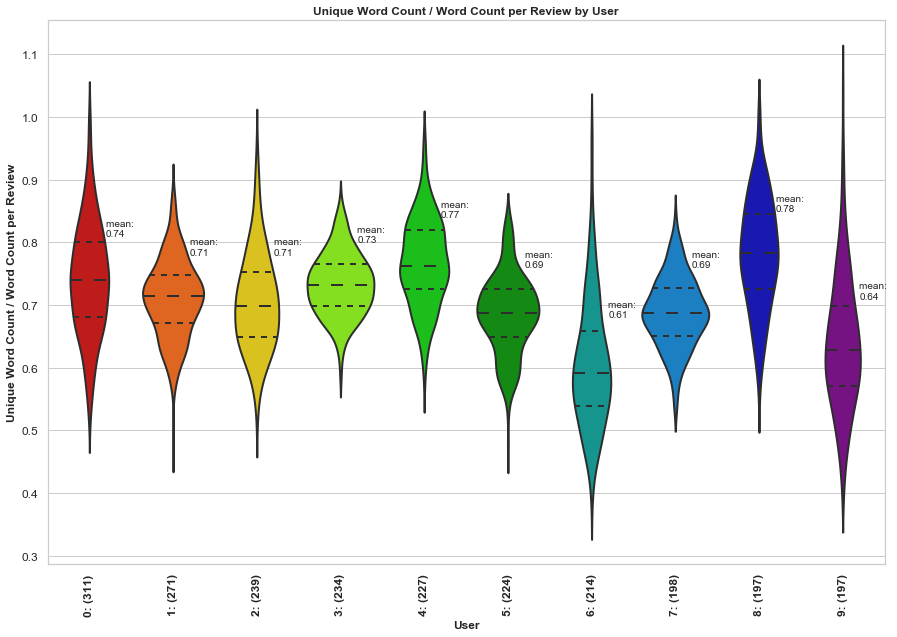

In [62]:
plt.rcParams['figure.figsize'] = (15, 10)

ax = sns.violinplot(x='user_num', y='unique_words/words', data=df1, palette='nipy_spectral_r', linewidth=2,
                   inner='quartile')

yposlist = np.round(df1.groupby(['user_num'])['unique_words/words'].mean().tolist(), 2)
yposlist = [pos + 0.07 for pos in yposlist]
xposlist = range(len(yposlist))
xposlist = [pos + 0.2 for pos in xposlist]
stringlist = ['mean: \n' + str(np.round(df1[df1['user_num'] == user]['unique_words/words'].mean(), 2)) for user in userlist]

for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])


ax.set_xticklabels(users_w_count, rotation=90, fontsize=12, weight='bold')
ax.axes.set_title('Unique Word Count / Word Count per Review by User', weight='bold')
ax.set_xlabel('User', fontsize=12, weight='bold')
ax.set_ylabel('Unique Word Count / Word Count per Review', fontsize=12, weight='bold')
ax.tick_params(labelsize=12)

plt.show()

### Age of Review by User

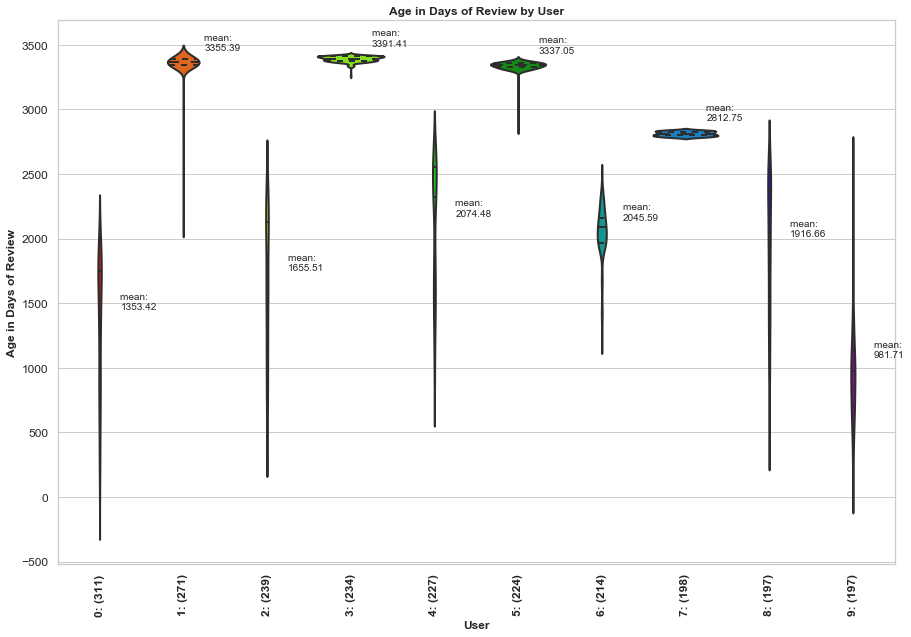

In [306]:
plt.rcParams['figure.figsize'] = (15, 10)

ax = sns.violinplot(x='user_num', y='age_days', data=df1, palette='nipy_spectral_r', linewidth=2,
                   inner='quartile')

yposlist = np.round(df1.groupby(['user_num'])['age_days'].mean().tolist(), 2)
yposlist = [pos + 100 for pos in yposlist]
xposlist = range(len(yposlist))
xposlist = [pos + 0.25 for pos in xposlist]
stringlist = ['mean: \n' + str(np.round(df1[df1['user_num'] == user].age_days.mean(), 2)) for user in userlist]

for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])

ax.set_xticklabels(users_w_count, rotation=90, fontsize=12, weight='bold')
ax.axes.set_title('Age in Days of Review by User', weight='bold')
ax.set_xlabel('User', fontsize=12, weight='bold')
ax.set_ylabel('Age in Days of Review', fontsize=12, weight='bold')
ax.tick_params(labelsize=12)

plt.show()

### Month of Review by User

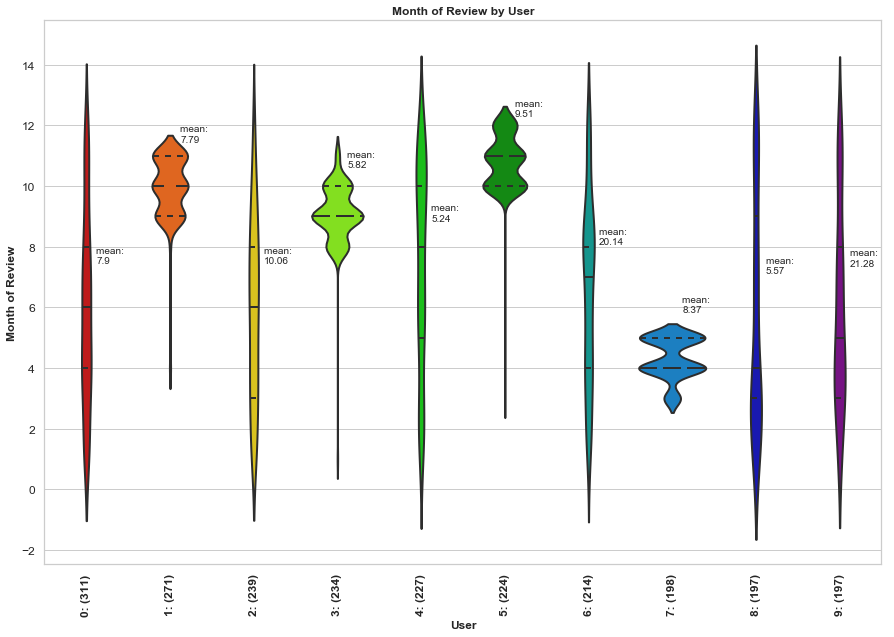

In [64]:
plt.rcParams['figure.figsize'] = (15, 10)

ax = sns.violinplot(x='user_num', y='month', data=df1, palette='nipy_spectral_r', linewidth=2,
                   inner='quartile')

yposlist = np.round(df1.groupby(['user_num'])['month'].mean().tolist(), 2)
yposlist = [pos + 1.5 for pos in yposlist]
xposlist = range(len(yposlist))
xposlist = [pos + 0.12 for pos in xposlist]
stringlist = ['mean: \n' + str(np.round(df1[df1['user_num'] == user].num_sents.mean(), 2)) for user in userlist]

for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])


ax.set_xticklabels(users_w_count, rotation=90, fontsize=12, weight='bold')
ax.axes.set_title('Month of Review by User', weight='bold')
ax.set_xlabel('User', fontsize=12, weight='bold')
ax.set_ylabel('Month of Review', fontsize=12, weight='bold')
ax.tick_params(labelsize=12)

plt.show()

We can see from the age in days of review alongside the month of review, that users 1, 3, 5, and 7 (and, to some extent, 6) were very active for a brief period of time (approximately three months of heavy activity for each user) while the other users were active at a more steady rate over a longer period.

In [65]:
plt.rcParams['figure.figsize'] = (10, 10)

## Variable Relationships

In [66]:
def R_coeff(x, y):
    """Pearson R coefficient for two variables."""
    return stats.pearsonr(x, y)[0]

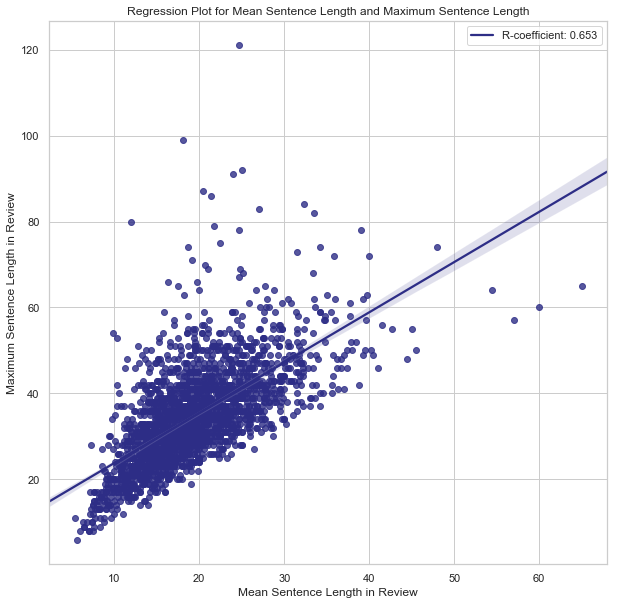

In [67]:
sns.regplot(df1['mean_sent_length'], df1['max_sent_length'], color='#2d2d86')

plt.ylabel('Maximum Sentence Length in Review')
plt.xlabel('Mean Sentence Length in Review')
plt.title('Regression Plot for Mean Sentence Length and Maximum Sentence Length')
plt.legend(['R-coefficient: '+str(R_coeff(df1['mean_sent_length'], df1['max_sent_length']))[:5]])
plt.show()

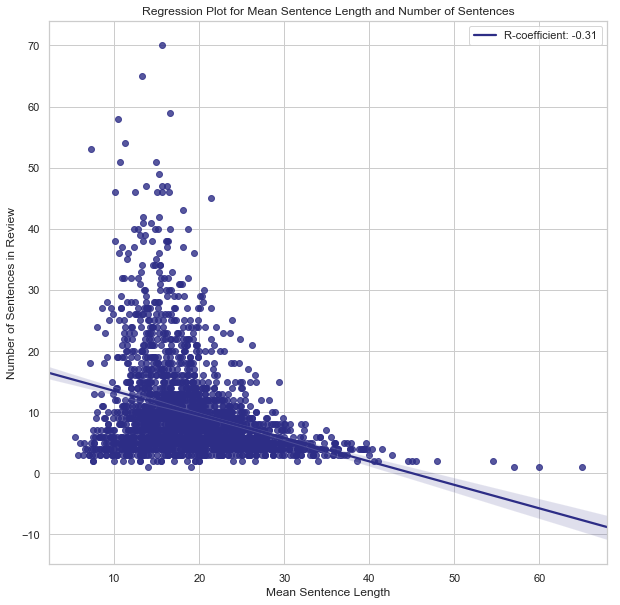

In [68]:
sns.regplot(df1['mean_sent_length'], df1['num_sents'], color='#2d2d86')

plt.ylabel('Number of Sentences in Review')
plt.xlabel('Mean Sentence Length')
plt.title('Regression Plot for Mean Sentence Length and Number of Sentences')
plt.legend(['R-coefficient: '+str(R_coeff(df1['mean_sent_length'], df1['num_sents']))[:5]])
plt.show()

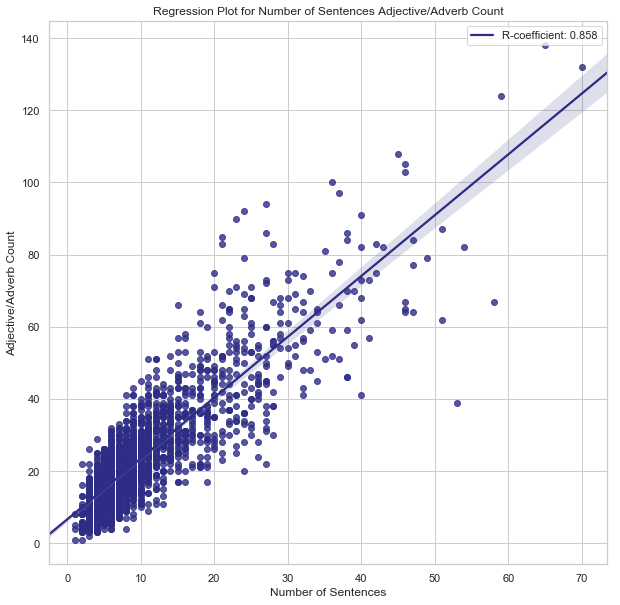

In [69]:
sns.regplot(df1['num_sents'], df1['adj_adv_count'], color='#2d2d86')
plt.ylabel('Adjective/Adverb Count')
plt.xlabel('Number of Sentences')
plt.title('Regression Plot for Number of Sentences Adjective/Adverb Count')
plt.legend(['R-coefficient: '+str(R_coeff(df1['num_sents'], df1['adj_adv_count']))[:5]])
plt.show()

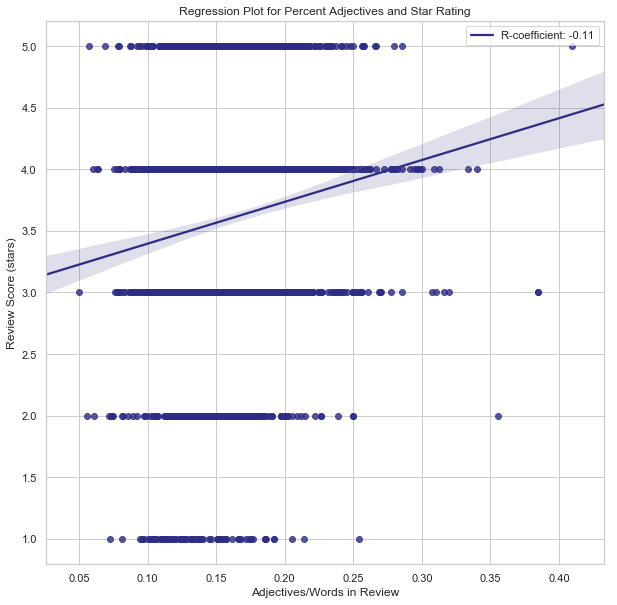

In [70]:
sns.regplot((df1['adj_adv_count']/df1['words_in_review']), df1['stars'], color='#2d2d86')
plt.ylabel('Review Score (stars)')
plt.xlabel('Adjectives/Words in Review')
plt.title('Regression Plot for Percent Adjectives and Star Rating')
plt.legend(['R-coefficient: '+str(R_coeff(df1['words_in_review'], df1['stars']))[:5]])
plt.show()

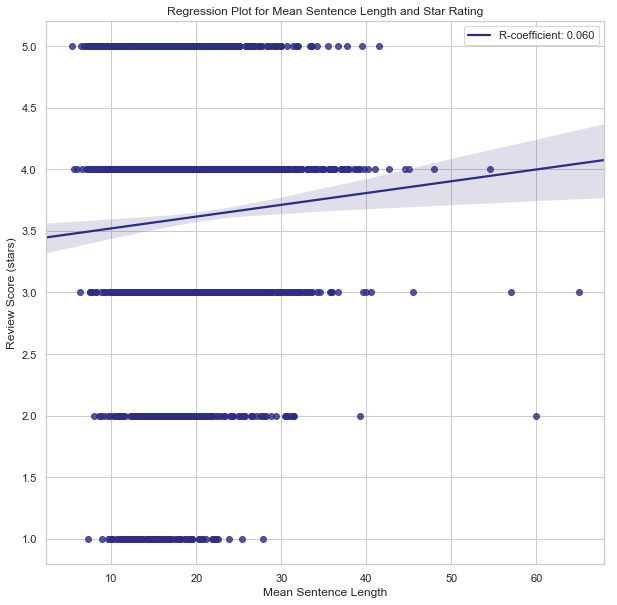

In [71]:
sns.regplot(df1['mean_sent_length'], df1['stars'], color='#2d2d86')
plt.ylabel('Review Score (stars)')
plt.xlabel('Mean Sentence Length')
plt.title('Regression Plot for Mean Sentence Length and Star Rating')
plt.legend(['R-coefficient: '+str(R_coeff(df1['mean_sent_length'], df1['stars']))[:5]])
plt.show()

# 5.) Initial Clustering (non-word features)

Before creating a feature set from the text corpus, we will try clustering to see if the authors are differentiable by other means.

In [72]:
df1.columns

Index(['business_id', 'cool', 'date', 'funny', 'review_id', 'stars', 'text',
       'useful', 'user_id', 'user_num', 'datetime', 'age_days', 'month',
       'review_length', 'words_in_review', 'cleaned_text1', 'nlp_text',
       'num_sents', 'mean_sent_length', 'max_sent_length', 'cleaned_text2',
       'adj_adv_count', 'unique_word_count', 'adj/words',
       'unique_words/words'],
      dtype='object')

In [73]:
nonword_features = ['cool', 'funny', 'stars', 'num_sents',
                    'mean_sent_length', 'max_sent_length',
                    'adj_adv_count', 'age_days', 'month',
                    'unique_word_count']


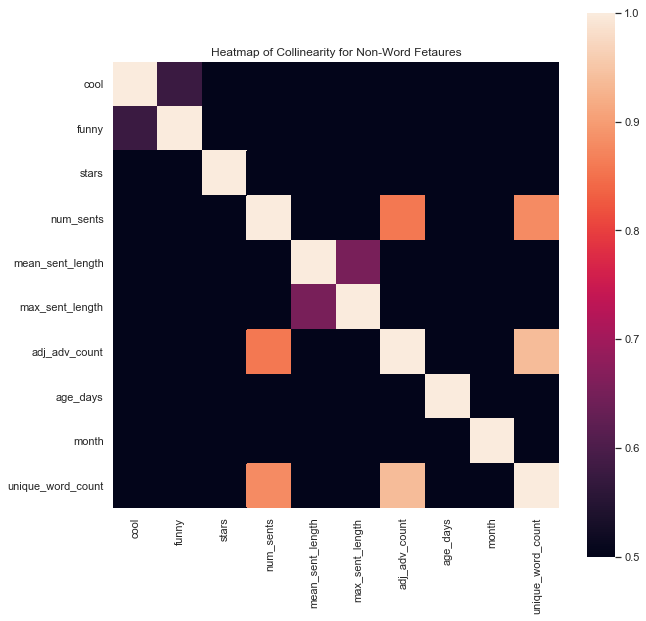

In [74]:
sns.heatmap(df1[nonword_features].corr(), square=True, vmin=0.5)
plt.title('Heatmap of Collinearity for Non-Word Fetaures')
plt.show()

Because of the high collinearity between num_sents and adj_adv_count and unique_word_count, we will drop the latter two. We will also drop max_sent_length as it is more prone to showing outliers than mean_sent_length

In [75]:
nonword_features = ['cool', 'funny', 'stars', 'num_sents',
                    'mean_sent_length', 'age_days', 'month']

In [76]:
X = df1[nonword_features]
y = df1['user_num']

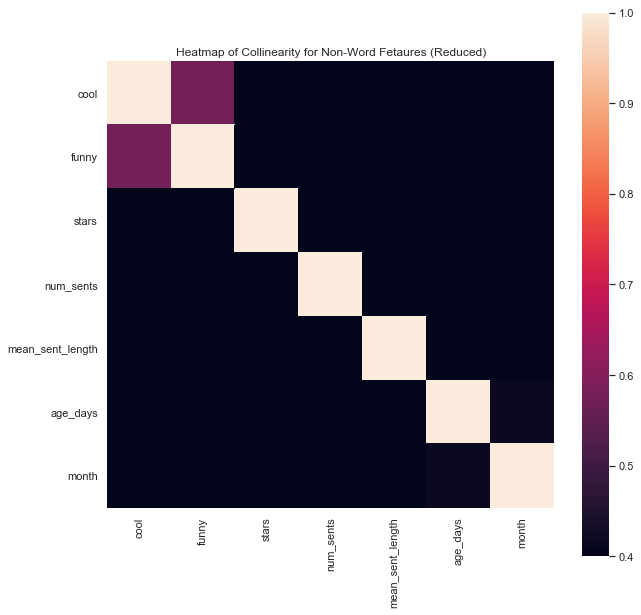

In [77]:
sns.heatmap(df1[nonword_features].corr(), square=True, vmin=0.4)
plt.title('Heatmap of Collinearity for Non-Word Fetaures (Reduced)')
plt.show()

## SKLearn Clustering Models

### K-Means Clustering Model

col_0      0     1  2  3   4  5    6    7  8   9   All
user_num                                              
0          1    54  1  1  50  0   20  166  1  17   311
1          0   269  0  0   0  0    1    1  0   0   271
2          1   118  0  0  11  0   25   84  0   0   239
3          0   233  0  0   0  0    0    1  0   0   234
4          0   126  0  0   7  0    1   93  0   0   227
5          0   224  0  0   0  0    0    0  0   0   224
6          1   118  0  0   0  0   86    9  0   0   214
7          0   197  0  0   0  0    0    1  0   0   198
8          0   184  0  0   0  0    0   13  0   0   197
9         49    20  0  0  13  5   89   18  0   3   197
All       52  1543  1  1  81  5  222  386  1  20  2312


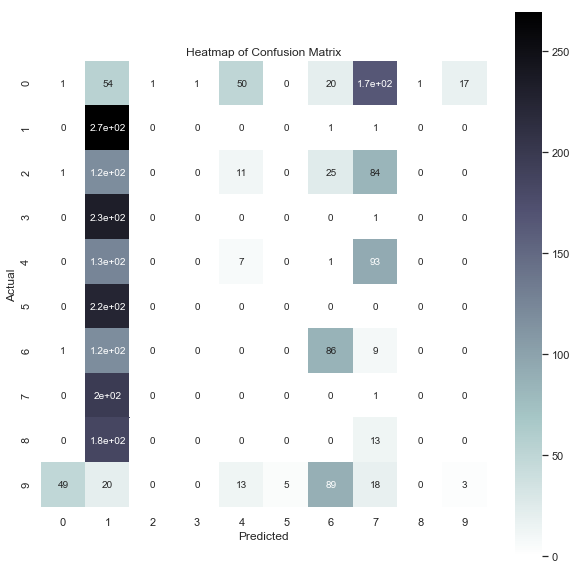

In [78]:
# Normalize the data.
X_norm = normalize(X)

# Calculate predicted values.
y_pred = KMeans(n_clusters=10, random_state=42).fit_predict(X_norm)

print(pd.crosstab(y, y_pred, margins=True))
sns.heatmap(pd.crosstab(y, y_pred), annot=True, square=True, cmap='bone_r')
plt.title('Heatmap of Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [79]:
print("Adjusted Rand Score: ", adjusted_rand_score(y, y_pred))

Adjusted Rand Score:  0.07419915277439043


This model looks to be pretty poor. Most of the entries were grouped into the cluster corresponding to User 1, with a few being grouped into User 6 and User 7 as well.

### Mean-Shift Clustering

In [80]:
bandwidth = estimate_bandwidth(X_norm, quantile=0.90, n_samples=500)

ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(X_norm)

labels = ms.labels_

cluster_centers = ms.cluster_centers_

n_clusters_ = len(np.unique(labels))

print(n_clusters_)

12


col_0        0   1  2  3  4  5  6  7  8  9  10  11   All
user_num                                                
0          278  29  0  0  0  0  0  0  1  1   1   1   311
1          271   0  0  0  0  0  0  0  0  0   0   0   271
2          239   0  0  0  0  0  0  0  0  0   0   0   239
3          234   0  0  0  0  0  0  0  0  0   0   0   234
4          225   2  0  0  0  0  0  0  0  0   0   0   227
5          224   0  0  0  0  0  0  0  0  0   0   0   224
6          214   0  0  0  0  0  0  0  0  0   0   0   214
7          198   0  0  0  0  0  0  0  0  0   0   0   198
8          197   0  0  0  0  0  0  0  0  0   0   0   197
9          175  15  1  1  1  1  2  1  0  0   0   0   197
All       2255  46  1  1  1  1  2  1  1  1   1   1  2312


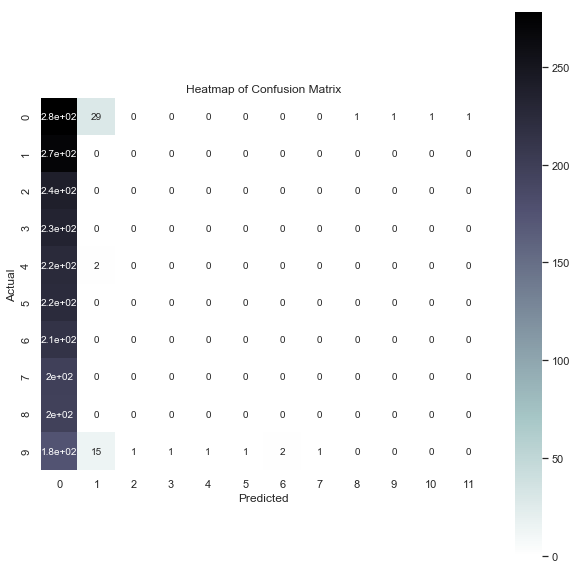

In [81]:
print(pd.crosstab(y, labels, margins=True))
sns.heatmap(pd.crosstab(y, labels), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

In [82]:
print("Adjusted Rand Score: ", adjusted_rand_score(y, labels))

Adjusted Rand Score:  -0.0005015957006976345


### Spectral Clustering

In [83]:
n_clusters=10

sc = SpectralClustering(n_clusters=n_clusters)
sc.fit(X_norm)

labels = sc.labels_

n_clusters_ = len(np.unique(labels))

print(n_clusters_)

10


col_0       0     1  2  3   4   5   6    7   8  9   All
user_num                                               
0          75   145  0  0   8  10   0   27  43  3   311
1           8   247  0  0  14   2   0    0   0  0   271
2          91   100  1  1   5  12   2   26   1  0   239
3           0   226  0  0   8   0   0    0   0  0   234
4          27   175  0  0   3   1   0    8  13  0   227
5           1   213  0  0   9   1   0    0   0  0   224
6          43   128  0  0  15  25   3    0   0  0   214
7          41   149  0  0   7   1   0    0   0  0   198
8         101    59  0  0   0   0   0   37   0  0   197
9          44    28  0  0  20  14  47   42   2  0   197
All       431  1470  1  1  89  66  52  140  59  3  2312


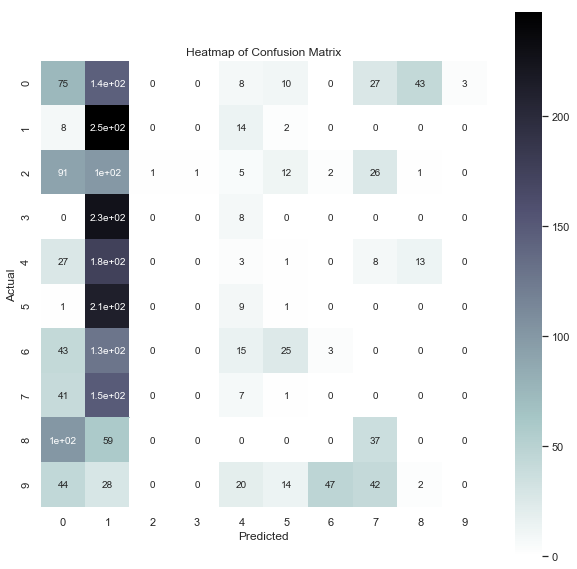

In [84]:
print(pd.crosstab(y, labels, margins=True))
sns.heatmap(pd.crosstab(y, labels), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

In [85]:
print("Adjusted Rand Score: ", adjusted_rand_score(y, labels))

Adjusted Rand Score:  0.04789569034690562


###  DBSCAN

In [86]:
dbscan = DBSCAN(eps=0.001, min_samples=5, algorithm='kd_tree')
clusters = dbscan.fit_predict(X_norm)

labels = dbscan.labels_

col_0       -1     0   1  2  3  4  5  6  7  8   All
user_num                                           
0          281    21   1  0  0  0  2  1  1  4   311
1           23   248   0  0  0  0  0  0  0  0   271
2          184    47   1  3  0  0  1  0  2  1   239
3           10   224   0  0  0  0  0  0  0  0   234
4          129    93   0  0  0  0  1  3  1  0   227
5           16   208   0  0  0  0  0  0  0  0   224
6          188    20   4  2  0  0  0  0  0  0   214
7           23   168   5  2  0  0  0  0  0  0   198
8           80   100   1  1  8  5  2  0  0  0   197
9          195     2   0  0  0  0  0  0  0  0   197
All       1129  1131  12  8  8  5  6  4  4  5  2312


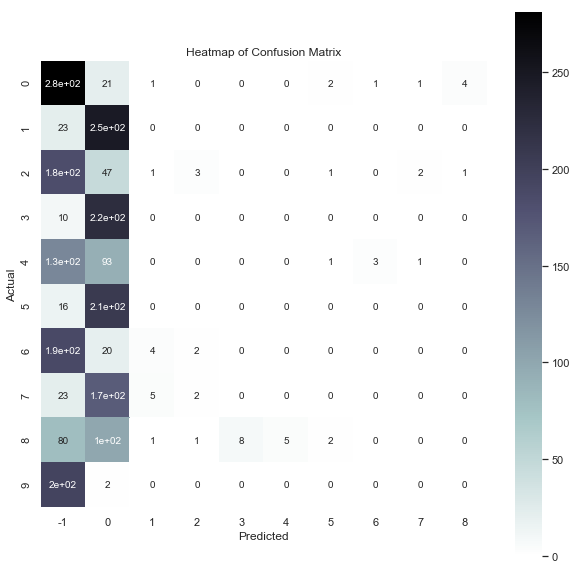

In [87]:
print(pd.crosstab(y, labels, margins=True))
sns.heatmap(pd.crosstab(y, labels), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

This doesn't seem to be going anywhere. We'll try clustering again once we've created some word vectors. But first, let's try Bag of Words modeling with SpaCy.

# 6.) Creating the Bag of Words Model with SpaCy

## Functions for BoW Creation and BoW Feature Creation

In [88]:
# Utility function to create a list of the %proportion most common words.

def bag_of_words_1(text, proportion=0.3333, threshold = 500):
    """Because the length of the input text varies,
        we are taking a proportion instead."""    
    # Filter out punctuation and stop words.
    allwords = [token.lemma_
                for token in text
                if not token.is_punct
                and not token.is_stop]
    
    # Return the most common words.
    bag_size = threshold + int(proportion * (len(Counter(allwords)) - threshold))
    print(len(Counter(allwords)))
    return [item[0] for item in Counter(allwords).most_common(bag_size)]

In [89]:
# Creates a data frame with features for each word in our common word set.
# Each value is the count of the times the word appears in each sentence.
def bow_features(document, common_words):
    
    # Scaffold the local data frame variable and initialize counts to zero.
    df = pd.DataFrame(columns=common_words)
    df['text_sentence'] = document['nlp_text']
    df['text_source'] = document['user_num']
    df.loc[:, common_words] = 0
    
    # Process each row, counting the occurrence of words in each sentence.
    for i, sentence in enumerate(df['text_sentence']):
        
        # Convert the sentence to lemmas, then filter out punctuation,
        # stop words, and uncommon words.
        words = [token.lemma_
                 for token in sentence
                 if (
                     not token.is_punct
                     and not token.is_stop
                     and token.lemma_ in common_words
                 )]
        
        # Populate the row with word counts.
        for word in words:
            df.loc[i, word] += 1
        
        # This counter is just to make sure the kernel didn't hang.
        if i % 10 == 0:
            print("Processing row {}".format(i))
            
    return df

In [90]:
user_0_reviews_spacy = pd.DataFrame(df1[df1['user_num'] == 0][['nlp_text', 'user_num']])
user_1_reviews_spacy = pd.DataFrame(df1[df1['user_num'] == 1][['nlp_text', 'user_num']])
user_2_reviews_spacy = pd.DataFrame(df1[df1['user_num'] == 2][['nlp_text', 'user_num']])
user_3_reviews_spacy = pd.DataFrame(df1[df1['user_num'] == 3][['nlp_text', 'user_num']])
user_4_reviews_spacy = pd.DataFrame(df1[df1['user_num'] == 4][['nlp_text', 'user_num']])
user_5_reviews_spacy = pd.DataFrame(df1[df1['user_num'] == 5][['nlp_text', 'user_num']])
user_6_reviews_spacy = pd.DataFrame(df1[df1['user_num'] == 6][['nlp_text', 'user_num']])
user_7_reviews_spacy = pd.DataFrame(df1[df1['user_num'] == 7][['nlp_text', 'user_num']])
user_8_reviews_spacy = pd.DataFrame(df1[df1['user_num'] == 8][['nlp_text', 'user_num']])
user_9_reviews_spacy = pd.DataFrame(df1[df1['user_num'] == 9][['nlp_text', 'user_num']])

In [91]:
user_0_reviews_spacy.index = np.arange(len(user_0_reviews_spacy))
user_1_reviews_spacy.index = np.arange(len(user_1_reviews_spacy))
user_2_reviews_spacy.index = np.arange(len(user_2_reviews_spacy))
user_3_reviews_spacy.index = np.arange(len(user_3_reviews_spacy))
user_4_reviews_spacy.index = np.arange(len(user_4_reviews_spacy))
user_5_reviews_spacy.index = np.arange(len(user_5_reviews_spacy))
user_6_reviews_spacy.index = np.arange(len(user_6_reviews_spacy))
user_7_reviews_spacy.index = np.arange(len(user_7_reviews_spacy))
user_8_reviews_spacy.index = np.arange(len(user_8_reviews_spacy))
user_9_reviews_spacy.index = np.arange(len(user_9_reviews_spacy))

In [92]:
user_6_reviews_spacy.head()

,nlp_text,user_num
0,"(So, this, big, guy-, that, looks, like, Elvis...",6
1,"(Oh, ,, China, A, Go, Go, ...., You, 're, like...",6
2,"(I, would, give, City, Stop, four, stars, sinc...",6
3,"(Stopped, here, by, accident, last, year, on, ...",6
4,"(Tenaya, Creek, had, been, on, my, radar, fore...",6


In [93]:
reviews_list_spacy = [user_0_reviews_spacy, user_1_reviews_spacy, user_2_reviews_spacy,
                  user_3_reviews_spacy, user_4_reviews_spacy, user_5_reviews_spacy,
                  user_6_reviews_spacy, user_7_reviews_spacy, user_8_reviews_spacy,
                  user_9_reviews_spacy]

### User Text Blocks (Raw)

In [94]:
user_0_block = ' '.join(df1[df1['user_num'] == 0]['text'])
user_1_block = ' '.join(df1[df1['user_num'] == 1]['text'])
user_2_block = ' '.join(df1[df1['user_num'] == 2]['text'])
user_3_block = ' '.join(df1[df1['user_num'] == 3]['text'])
user_4_block = ' '.join(df1[df1['user_num'] == 4]['text'])
user_5_block = ' '.join(df1[df1['user_num'] == 5]['text'])
user_6_block = ' '.join(df1[df1['user_num'] == 6]['text'])
user_7_block = ' '.join(df1[df1['user_num'] == 7]['text'])
user_8_block = ' '.join(df1[df1['user_num'] == 8]['text'])
user_9_block = ' '.join(df1[df1['user_num'] == 9]['text'])

In [95]:
blocks = [user_0_block, user_1_block, user_2_block, user_3_block, user_4_block, 
         user_5_block, user_6_block, user_7_block, user_8_block, user_9_block]

In [96]:
alltext = ' '.join(blocks)
alltext

'I have no complaints about this clinic. The RPharm was knowledgeable, and we had no trouble getting an appointment after work. Both times we\'ve been, they had stock of all the vaccines we needed, e.g. Thus time to go to the Amazon jungle. They also sell accessories like bed nets, carry-on sized deet, etc.. Only inconvenience is that they don\'t do direct billing for insurance. Not as great as Pho Dau Bo\'s sate beef Pho but pretty good, we also tried the shrimp and wonton egg noodle soup. They also have thick rice noodle soups, so more options than a standard Pho place. Most everything under $10 so can\'t complain on price! The spring rolls were particularly tightly packed but otherwise acceptable. Minimal strip-mall worthy decor. Good service, only two tables of people when we were there on a weeknight. In terms of key selection, this is the place to go for cutting all your weird double-side locker keys, old key types, etc. This isn\'t a mall kiosk, but rather a place both the publi

In [97]:
user_0_nlp = nlp(user_0_block)
user_1_nlp = nlp(user_1_block)
user_2_nlp = nlp(user_2_block)
user_3_nlp = nlp(user_3_block)
user_4_nlp = nlp(user_4_block)
user_5_nlp = nlp(user_5_block)
user_6_nlp = nlp(user_6_block)
user_7_nlp = nlp(user_7_block)
user_8_nlp = nlp(user_8_block)
user_9_nlp = nlp(user_9_block)

### User Text Block BoWs

In [98]:
user_0_words_1 = bag_of_words_1(user_0_nlp)
user_1_words_1 = bag_of_words_1(user_1_nlp)
user_2_words_1 = bag_of_words_1(user_2_nlp)
user_3_words_1 = bag_of_words_1(user_3_nlp)
user_4_words_1 = bag_of_words_1(user_4_nlp)
user_5_words_1 = bag_of_words_1(user_5_nlp)
user_6_words_1 = bag_of_words_1(user_6_nlp)
user_7_words_1 = bag_of_words_1(user_7_nlp)
user_8_words_1 = bag_of_words_1(user_8_nlp)
user_9_words_1 = bag_of_words_1(user_9_nlp)

4911
3437
3402
3845
2581
3076
4467
3928
1203
4159


In [99]:
words_list1 = [user_0_words_1, user_1_words_1, user_2_words_1,
                  user_3_words_1, user_4_words_1, user_5_words_1,
                  user_6_words_1, user_7_words_1, user_8_words_1,
                  user_9_words_1]

In [100]:
words_in_bag = []

for bag in words_list1:
    words_in_bag.append(len(bag))
    print(len(bag))

1970
1478
1467
1614
1193
1358
1822
1642
734
1719


### Combined BoW Set

In [101]:
# Combine bags to create a set of unique words_1.

common_words_1 = set(
                    user_0_words_1 + user_1_words_1
                    + user_2_words_1 + user_3_words_1
                    + user_4_words_1 + user_5_words_1
                    + user_6_words_1 + user_7_words_1
                    + user_8_words_1 + user_9_words_1
                    )

len(common_words_1)

5112

In [102]:
user_0_df_1 = pd.DataFrame()
user_1_df_1 = pd.DataFrame()
user_2_df_1 = pd.DataFrame()
user_3_df_1 = pd.DataFrame()
user_4_df_1 = pd.DataFrame()
user_5_df_1 = pd.DataFrame()
user_6_df_1 = pd.DataFrame()
user_7_df_1 = pd.DataFrame()
user_8_df_1 = pd.DataFrame()
user_9_df_1 = pd.DataFrame()

In [103]:
df_list_1 = [user_0_df_1, user_1_df_1, user_2_df_1, user_3_df_1, user_4_df_1,
 user_5_df_1, user_6_df_1, user_7_df_1, user_8_df_1, user_9_df_1]

In [104]:
users_reviews_dataframes_1 = zip(userlist, reviews_list_spacy, df_list_1)

In [105]:
#Make sure it works before running Process

sample_for_bow = df1[df1['business_id'] == 'FAWfhHcwPB5O4xfz70EOug'][['nlp_text', 'user_num']]



In [106]:
bow_features(sample_for_bow, common_words_1)

Processing row 0


,sword,creek,awful,air,doc,lastly,panang,toy,stuffer,england,...,use,exciting,'s,salmon,innovative,hemporium,description,philosophy,text_sentence,text_source
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,"(If, you, watch, the, food, network, long, eno...",7


In [107]:
df1['num_sents'].mean()

9.91089965397924

### Create .csv Files

In [108]:
def bow_to_csv(user, user_review, user_df):
    try:
        user_df = pd.read_csv('user_{}_df_1.csv'.format(user), index_col=0)
        print('{}_df_1.csv exists'.format(user))
    except FileNotFoundError:
        bow_df = bow_features(user_review, common_words_1)
        bow_df.to_csv('user_{}_df_1.csv'.format(user))
        print("User {}'s reviews saved as .csv".format(user))
        user_df = pd.read_csv('user_{}_df_1.csv'.format(user), index_col=0)
        print('{}_df_1.csv exists'.format(user))
        

In [109]:
if __name__ == '__main__':
    for user, user_review, user_df in users_reviews_dataframes_1:
        p = mp.Process(target=bow_to_csv, args=(user, user_review, user_df))
        p.start()

2_df_1.csv exists
3_df_1.csv exists
4_df_1.csv exists
5_df_1.csv exists
6_df_1.csv exists
7_df_1.csv exists
8_df_1.csv exists
1_df_1.csv exists
0_df_1.csv exists
9_df_1.csv exists


## Load .csv Files

In [110]:
for user in userlist:
    print("user_{}_df_1 = pd.read_csv('user_{}_df_1.csv', index_col=0)".format(user, user))

user_0_df_1 = pd.read_csv('user_0_df_1.csv', index_col=0)
user_1_df_1 = pd.read_csv('user_1_df_1.csv', index_col=0)
user_2_df_1 = pd.read_csv('user_2_df_1.csv', index_col=0)
user_3_df_1 = pd.read_csv('user_3_df_1.csv', index_col=0)
user_4_df_1 = pd.read_csv('user_4_df_1.csv', index_col=0)
user_5_df_1 = pd.read_csv('user_5_df_1.csv', index_col=0)
user_6_df_1 = pd.read_csv('user_6_df_1.csv', index_col=0)
user_7_df_1 = pd.read_csv('user_7_df_1.csv', index_col=0)
user_8_df_1 = pd.read_csv('user_8_df_1.csv', index_col=0)
user_9_df_1 = pd.read_csv('user_9_df_1.csv', index_col=0)


In [111]:
user_0_df_1 = pd.read_csv('user_0_df_1.csv', index_col=0)
user_1_df_1 = pd.read_csv('user_1_df_1.csv', index_col=0)
user_2_df_1 = pd.read_csv('user_2_df_1.csv', index_col=0)
user_3_df_1 = pd.read_csv('user_3_df_1.csv', index_col=0)
user_4_df_1 = pd.read_csv('user_4_df_1.csv', index_col=0)
user_5_df_1 = pd.read_csv('user_5_df_1.csv', index_col=0)
user_6_df_1 = pd.read_csv('user_6_df_1.csv', index_col=0)
user_7_df_1 = pd.read_csv('user_7_df_1.csv', index_col=0)
user_8_df_1 = pd.read_csv('user_8_df_1.csv', index_col=0)
user_9_df_1 = pd.read_csv('user_9_df_1.csv', index_col=0)

In [112]:
df_list_1 = [user_0_df_1, user_1_df_1, user_2_df_1, user_3_df_1, user_4_df_1,
             user_5_df_1, user_6_df_1, user_7_df_1, user_8_df_1, user_9_df_1]

In [113]:
bag_of_words_model = pd.concat(df_list_1)

In [114]:
bag_of_words_model

,thank,inventory,facelift,griffin,tuesdays,priceless,lead,takeout,fortify,polish,...,hair,20,vegan,cemetery,maximum,john,shoppers,degree,text_sentence,text_source
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,I have no complaints about this clinic. The RP...,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Not as great as Pho Dau Bo's sate beef Pho but...,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,"In terms of key selection, this is the place t...",0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,"With 75% Ukrainian heritage, I've pretty much ...",0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,You have to appreciate the gumption of a truck...,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,"This gym has been going for 30 years, and I ca...",0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Pretty much everything you could want in a hig...,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,"I've used car2go twice recently, and found the...",0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,A great choice when you need to eat at the foo...,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,If you're into heat and lots of fresh herbs & ...,0


In [115]:
source_one_hot = pd.get_dummies(bag_of_words_model.text_source)

In [116]:
source_one_hot = pd.concat([bag_of_words_model.drop(['text_sentence', 'text_source'], 1), source_one_hot], axis=1)

## BoW Features by Magnitude of Correlation with User

This is a little more mathematical than our previous "top 40" lists for most common word by user.

In [117]:
corrmagnitudes = {}

for user in userlist:
    nulltargets = list(userlist)
    nulltargets.remove(user)
    
    corrmat = source_one_hot.drop(nulltargets, 1).corr()
    
    corrmagnitude = pd.DataFrame(corrmat[user]).reset_index()
    corrmagnitude[user] = corrmagnitude[user].apply(lambda x: abs(x))
    
    corrmagnitude = corrmagnitude.sort_values(by=user, ascending=False)
    
    corrmagnitudes[user] = corrmagnitude[1:]

In [118]:
for user in userlist:
    print("User {}'s highest-correlated features'")
    print(corrmagnitudes[user][:40])

User {}'s highest-correlated features'
             index         0
1736             a  0.278699
2076          e.g.  0.259789
3733       texture  0.234690
5062          star  0.225584
2467        -PRON-  0.222868
4298          wife  0.207043
2487      somewhat  0.202637
4699         tasty  0.198322
1804            be  0.190450
30     preparation  0.185149
924        classic  0.182833
5092          dish  0.181836
4794         sauce  0.178188
3180        crispy  0.174850
4135       flavour  0.174296
4546       include  0.165321
4740          meat  0.163263
141           menu  0.161048
4148             4  0.158808
2022      sizeable  0.158569
4681     accompany  0.158366
2941       quality  0.157111
4687           3.5  0.154815
172       cocktail  0.153438
3949     available  0.151847
2646     seasoning  0.150583
1206           the  0.149929
2170         spice  0.148783
949           base  0.146697
2223        fairly  0.143353
1057            an  0.141778
182   presentation  0.141126
1865


# 7.) Bag of Words Classification

## Train-Test Split

In [119]:
spacy_bow_columns = bag_of_words_model.drop(['text_sentence', 'text_source'], 1).columns
len(spacy_bow_columns)

5112

In [120]:
X = bag_of_words_model.drop(['text_sentence', 'text_source'], 1)
y = bag_of_words_model['text_source'].values

In [266]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                    test_size=0.25, stratify=bag_of_words_model['text_source'], random_state=0)

In [267]:
X_train

,thank,inventory,facelift,griffin,tuesdays,priceless,lead,takeout,fortify,polish,...,film,cider,hair,20,vegan,cemetery,maximum,john,shoppers,degree
184,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
173,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
115,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
53,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
198,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
204,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
171,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
136,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
188,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Multinomial Naive Bayes Model

(1734, 5112) (1734,)
Training set score: 0.972318339100346

Test set score: 0.7837370242214533
col_0   0   1   2   3   4   5   6   7   8   9  All
row_0                                             
0      61   1   2   3   1   4   1   4   0   1   78
1       1  61   0   4   0   0   1   0   0   1   68
2       1   1  50   0   0   1   3   1   1   2   60
3       6   2   1  43   2   2   0   3   0   0   59
4       2   5   5   1  33   1   7   2   0   1   57
5       1   2   0   1   0  49   1   1   0   1   56
6       0   0   0   2   0   0  51   0   0   0   53
7       5   1   3   4   0   5   1  29   0   1   49
8       2   0   5   0   1   2   4   0  32   3   49
9       0   0   2   1   0   1   1   0   0  44   49
All    79  73  68  59  37  65  70  40  33  54  578
0.7780237287771261


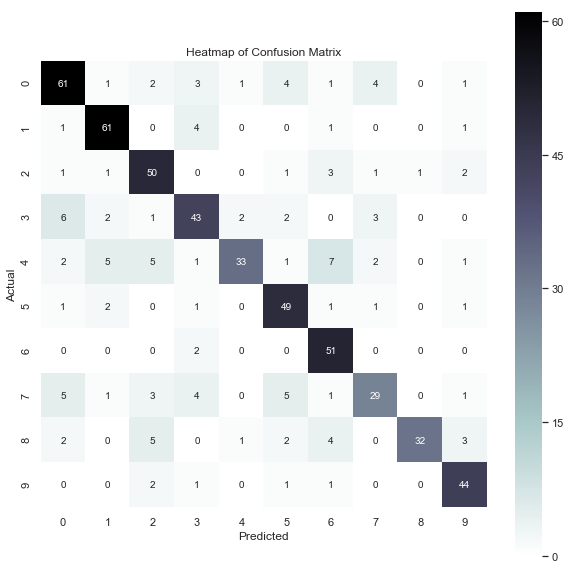

In [257]:
mnb = MultinomialNB()
train = mnb.fit(X_train, y_train)
print(X_train.shape, y_train.shape)
print('Training set score:', mnb.score(X_train, y_train))
print('\nTest set score:', mnb.score(X_test, y_test))

y_pred_mnb = mnb.predict(X_test)

print(pd.crosstab(y_test, y_pred_mnb, margins=True))
print(f1_score(y_test, y_pred_mnb, average='macro'))
sns.heatmap(pd.crosstab(y_test, y_pred_mnb), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

Multinomial Naive Bayes provides a good benchmark, as it is a simple, easily explainable model. An f1 score of 77.97% is pretty solid for a start. We do have what appears to be a fair amount of overfitting, though, as the training set score is significantly higher than that of the test set.

## Logistic Regression Model

(1734, 5112) (1734,)
Training set score: 1.0

Test set score: 0.8252595155709342
col_0   0   1   2   3   4   5   6   7   8   9  All
row_0                                             
0      64   4   2   0   4   1   0   2   1   0   78
1       0  59   1   2   1   1   1   1   1   1   68
2       3   1  47   0   2   0   3   0   3   1   60
3       1   4   0  47   1   1   2   1   0   1   58
4       1   2   3   1  43   0   2   0   5   0   57
5       1   2   0   0   3  48   1   0   0   1   56
6       0   1   0   0   0   0  51   1   0   1   54
7       2   3   2   3   3   2   0  34   0   0   49
8       1   0   1   0   2   0   0   0  45   0   49
9       0   0   4   1   0   2   2   0   1  39   49
All    73  76  60  54  59  55  62  39  56  44  578
0.8243879938595553


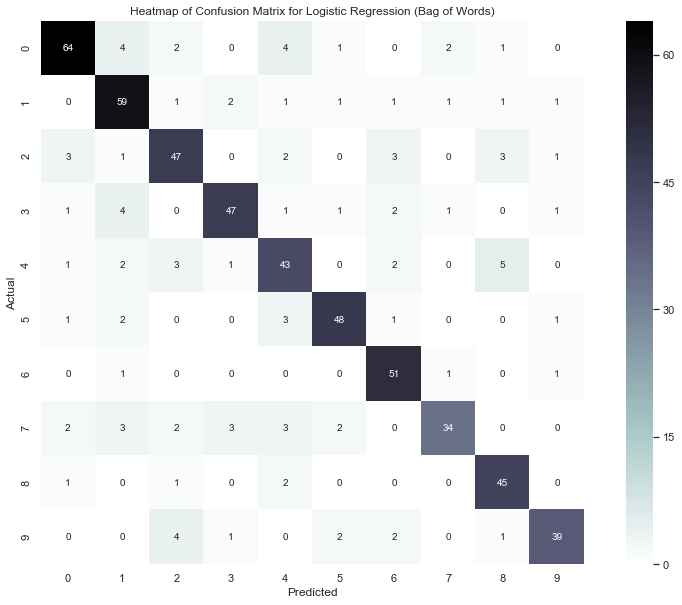

In [307]:
lr = LogisticRegression()
train = lr.fit(X_train, y_train)
print(X_train.shape, y_train.shape)
print('Training set score:', lr.score(X_train, y_train))
print('\nTest set score:', lr.score(X_test, y_test))

y_pred_lr = lr.predict(X_test)

print(pd.crosstab(y_test, y_pred_lr, margins=True))
print(f1_score(y_test, y_pred_lr, average='macro'))
sns.heatmap(pd.crosstab(y_test, y_pred_lr), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix for Logistic Regression (Bag of Words)')
plt.show()

With Logistic Regression, we see some improvement, up to an f1 score of 82.44%. However, overfitting is still an issue.

## Random Forest Model

Training set score: 1.0

Test set score: 0.6799307958477508
col_0   0   1   2   3   4   5   6   7   8   9  All
row_0                                             
0      56   2   0   1   3   0   0   0  12   4   78
1       0  62   0   3   0   0   0   0   3   0   68
2       6   3  35   0   3   0   1   2  10   0   60
3       2  10   0  35   2   7   0   1   2   0   59
4       3   7   2   1  30   2   0   1  11   0   57
5       2   6   1   4   1  39   0   1   2   0   56
6       0   2   1   2   0   4  42   0   0   2   53
7      10   2   6   5   3   2   1  19   1   0   49
8       0   0   0   0   2   0   0   0  46   1   49
9       3   2   2   3   0   3   3   0   4  29   49
All    82  96  47  54  44  57  47  24  91  36  578
0.6714140831191984


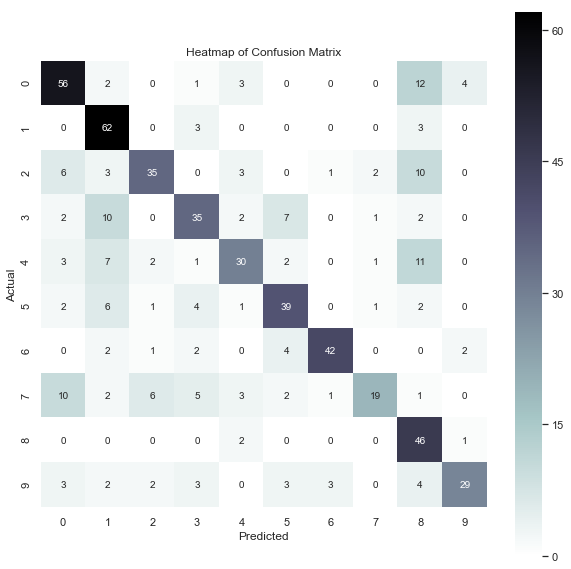

In [263]:
rfc = ensemble.RandomForestClassifier(n_estimators=100)

train = rfc.fit(X_train, y_train)

y_pred_rfc = rfc.predict(X_test)

print('Training set score:', rfc.score(X_train, y_train))
print('\nTest set score:', rfc.score(X_test, y_test))

print(pd.crosstab(y_test, y_pred_rfc, margins=True))
print(f1_score(y_test, y_pred_rfc, average='macro'))
sns.heatmap(pd.crosstab(y_test, y_pred_rfc), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

Logistic Regression outperformed the Random Forest model. Let's see about other ensemble models:

## Gradient-Boosted Decision Tree Model

Training set score: 0.9855824682814303

Test set score: 0.6608996539792388
col_0   0   1   2   3   4   5   6   7   8   9  All
row_0                                             
0      59   3   1   4   3   1   0   0   4   3   78
1       1  52   3   4   2   1   0   1   3   1   68
2       5   3  30   1   7   4   0   3   5   2   60
3       5   3   1  35   2  10   0   2   1   0   59
4       5   5  10   2  30   0   1   1   1   2   57
5       3   1   1   1   6  42   0   2   0   0   56
6       0   2   1   3   0   4  35   0   1   7   53
7       5   3   0   3   1   1   1  30   1   4   49
8       3   0   1   0   6   0   0   0  37   2   49
9       1   2   3   1   3   2   1   2   2  32   49
All    87  74  51  54  60  65  38  41  55  53  578
0.6589477715119536


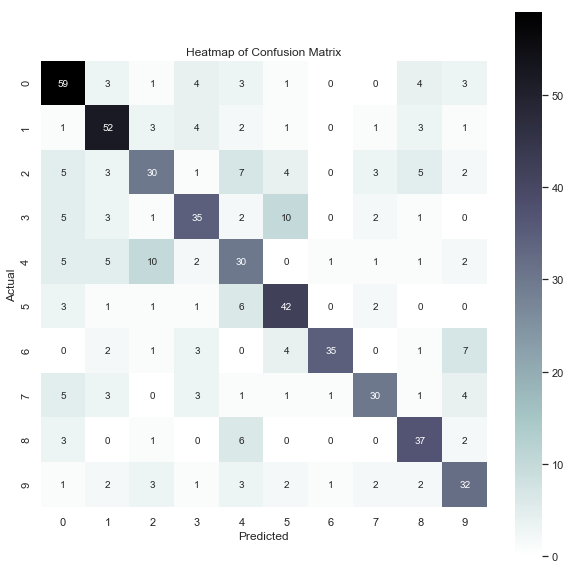

In [264]:
gbdt = ensemble.GradientBoostingClassifier(n_estimators=50, max_depth=4)

train = gbdt.fit(X_train, y_train)

y_pred_gbdt = gbdt.predict(X_test)

print('Training set score:', gbdt.score(X_train, y_train))
print('\nTest set score:', gbdt.score(X_test, y_test))

gbdt_crosstab = pd.crosstab(y_test, y_pred_gbdt)

print(pd.crosstab(y_test, y_pred_gbdt, margins=True))
print(f1_score(y_test, y_pred_gbdt, average='macro'))
sns.heatmap(gbdt_crosstab, annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

## KNN Classifier

Training set score: 0.20876585928489041

Test set score: 0.19896193771626297
col_0   1   2  3   4   5   6    8   9  All
row_0                                     
0       0   1  0   2   1   0   74   0   78
1      21   0  0   4   0   0   43   0   68
2       0   6  0   1   0   0   52   1   60
3       1   0  0   0   0   0   58   0   59
4       1   1  0   3   0   0   52   0   57
5       3   2  0   3   4   0   44   0   56
6       2  11  2   3   5  13   15   2   53
7       5   4  0   3   0   0   37   0   49
8       0   0  0   0   0   0   49   0   49
9       0  10  0   2   0   0   18  19   49
All    33  35  2  21  10  13  442  22  578
0.18690359013367658


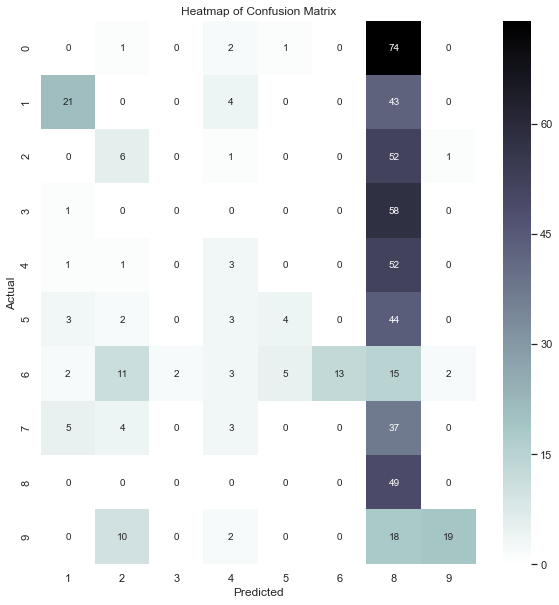

In [265]:
knn = KNeighborsClassifier(n_neighbors=15)

train = knn.fit(X_train, y_train)

y_pred_knn = knn.predict(X_test)

print('Training set score:', knn.score(X_train, y_train))
print('\nTest set score:', knn.score(X_test, y_test))

knn_crosstab = pd.crosstab(y_test, y_pred_knn)

print(pd.crosstab(y_test, y_pred_knn, margins=True))
print(f1_score(y_test, y_pred_knn, average='macro'))
sns.heatmap(knn_crosstab, annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

KNN doesn't do well with only discrete values; let's try it again later with vectors.

 # 8.) TF-IDF Vectorizer Model

In [132]:
normed_text = normalize_corpus(df1['cleaned_text2'])

In [133]:
vectorizer = TfidfVectorizer(max_df=0.5, # drop words that occur in more than half the paragraphs
     min_df=2, # only use words that appear at least twice
     lowercase=True, #convert everything to lower case
     use_idf=True, #use inverse document frequencies in our weighting
     norm=u'l2', #apply a correction factor so that longer reviews and shorter reviews get treated equally
     smooth_idf=True #Adds 1 to all document frequencies, as if an extra document existed that used every word once.  Prevents divide-by-zero errors
    )


#Applying the vectorizer
normed_text_tfidf=vectorizer.fit_transform(normed_text)
print("Number of features: %d" % normed_text_tfidf.get_shape()[1])

#splitting into training and test sets
X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf = train_test_split(normed_text_tfidf, df1['user_num'].values,
                                                            test_size=0.25, stratify=bag_of_words_model['text_source'], random_state=0)


#Reshapes the vectorizer output into something people can read
X_train_tfidf_csr = X_train_tfidf.tocsr()

#number of paragraphs
n = X_train_tfidf_csr.shape[0]
#A list of dictionaries, one per paragraph
tfidf_bypara = [{} for _ in range(0,n)]
#List of features
terms = vectorizer.get_feature_names()
#for each paragraph, lists the feature words and their tf-idf scores
for i, j in zip(*X_train_tfidf_csr.nonzero()):
    tfidf_bypara[i][terms[j]] = X_train_tfidf_csr[i, j]

#Keep in mind that the log base 2 of 1 is 0, so a tf-idf score of 0 indicates that the word was present once in that sentence.
print('Original review:', X_train_tfidf[5])
print('\n')
print('Tf_idf vector:', tfidf_bypara[5])



Number of features: 8815
Original review:   (0, 4594)	0.19415111947074606
  (0, 8610)	0.19415111947074606
  (0, 4228)	0.1559825461261642
  (0, 3986)	0.13769787413568227
  (0, 4007)	0.1882647698512099
  (0, 360)	0.18345527201832768
  (0, 7657)	0.12598731675244973
  (0, 7459)	0.12648979300398486
  (0, 1654)	0.1882647698512099
  (0, 466)	0.17275942456590931
  (0, 4291)	0.11261187505997924
  (0, 7384)	0.167465891031425
  (0, 6215)	0.1321237081076395
  (0, 8603)	0.1186485339500398
  (0, 3600)	0.1882647698512099
  (0, 3224)	0.1186485339500398
  (0, 5208)	0.15169542587024606
  (0, 253)	0.1880582595564187
  (0, 5425)	0.11352685252566419
  (0, 1353)	0.12752440426022799
  (0, 7864)	0.12700202668326388
  (0, 1730)	0.14281955556005785
  (0, 7023)	0.10720956114204518
  (0, 5128)	0.16666656465158192
  (0, 5502)	0.09734071576326295
  :	:
  (0, 686)	0.08097220773299554
  (0, 2315)	0.14477446499446678
  (0, 2179)	0.08106270252364875
  (0, 8777)	0.11004322196654903
  (0, 726)	0.15075308201278212
  (0, 4

In [134]:
list(X_train_tfidf[0])

[<1x8815 sparse matrix of type '<class 'numpy.float64'>'
 	with 81 stored elements in Compressed Sparse Row format>]

In [135]:
#Our SVD data reducer.  We are going to reduce the feature space from 1379 to 130.
svd= TruncatedSVD(300)
lsa = make_pipeline(svd, Normalizer(copy=False))
# Run SVD on the training data, then project the training data.
X_train_lsa = lsa.fit_transform(X_train_tfidf)
X_test_lsa = lsa.fit_transform(X_test_tfidf)
y_train_lsa = y_train
y_test_lsa = y_test
variance_explained=svd.explained_variance_ratio_
total_variance = variance_explained.sum()
print("Percent variance captured by all components:",total_variance*100)

"""#Looking at what sorts of paragraphs our solution considers similar, for the first five identified topics
paras_by_component=pd.DataFrame(X_train_lsa, index=X_train_lsa)
for i in range(5):
    print('Component {}:'.format(i))
    print(paras_by_component.loc[:,i].sort_values(ascending=False)[0:10])"""

Percent variance captured by all components: 69.57802553243582


"#Looking at what sorts of paragraphs our solution considers similar, for the first five identified topics\nparas_by_component=pd.DataFrame(X_train_lsa, index=X_train_lsa)\nfor i in range(5):\n    print('Component {}:'.format(i))\n    print(paras_by_component.loc[:,i].sort_values(ascending=False)[0:10])"

# 9.) TF-IDF Classification

## Multinomial Naive Bayes Model

(1734, 8815) (1734,)
training set score: 0.9423298731257209
\Test_tfidf set score: 0.6695501730103807
col_0    0    1   2   3   4   5   6  7   8   9  All
row_0                                              
0       74    0   0   0   0   0   0  0   0   0   74
1        1   61   0   0   0   0   0  0   0   0   62
2        5    6  45   0   0   1   3  0   0   1   61
3       14   12   0  37   0   2   0  0   0   0   65
4       14   10   5   1  22   1   2  0   1   0   56
5       10    9   1   0   0  38   0  0   0   1   59
6        2    1   0   0   0   0  51  0   0   1   55
7       25   11   2   0   0   3   1  8   0   0   50
8        9    2   4   0   0   0   3  0  25   0   43
9       15    4   2   0   0   0   6  0   0  26   53
All    169  116  59  38  22  45  66  8  26  29  578
0.6535386451382817


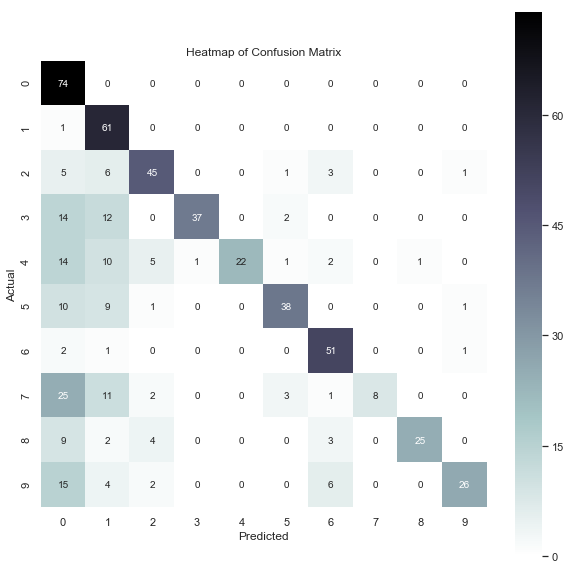

In [136]:
mnb = MultinomialNB()
train_tfidf = mnb.fit(X_train_tfidf, y_train_tfidf)
print(X_train_tfidf.shape, y_train_tfidf.shape)
print('training set score:', mnb.score(X_train_tfidf, y_train_tfidf))
print('\Test_tfidf set score:', mnb.score(X_test_tfidf, y_test_tfidf))

y_pred_mnb = mnb.predict(X_test_tfidf)

print(pd.crosstab(y_test_tfidf, y_pred_mnb, margins=True))
print(f1_score(y_test_tfidf, y_pred_mnb, average='macro'))
sns.heatmap(pd.crosstab(y_test_tfidf, y_pred_mnb), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

With the tf-idf model, Multinomial Naive Bayes performed relatively poorly, with an f1 score of only about 0.6535. This does not bode well for other models based on tf-idf vectorization, but we'll see how other classifiers perform.

## Logistic Regression Model

(1734, 8815) (1734,)
training set score: 0.9884659746251442

test set score: 0.8235294117647058
col_0    0   1   2   3   4   5   6   7   8   9  All
row_0                                              
0       73   0   0   0   0   0   0   1   0   0   74
1        1  60   0   1   0   0   0   0   0   0   62
2        2   3  49   1   0   2   0   1   2   1   61
3        6   3   0  53   1   2   0   0   0   0   65
4        7   5   3   2  33   1   0   2   3   0   56
5        4   3   0   0   0  50   0   1   1   0   59
6        0   1   1   1   1   1  48   0   0   2   55
7       12   1   2   1   0   3   0  31   0   0   50
8        2   1   1   0   1   0   0   0  38   0   43
9        6   3   2   0   0   0   1   0   0  41   53
All    113  80  58  59  36  59  49  36  44  44  578
0.8231967337313547


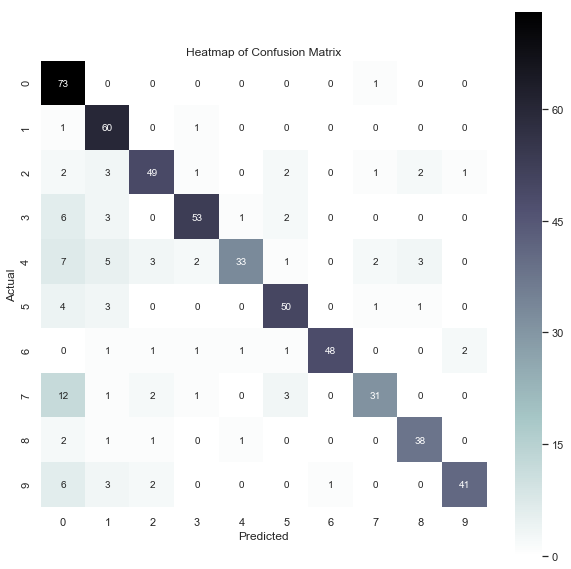

In [137]:
lr = LogisticRegression()
train_tfidf = lr.fit(X_train_tfidf, y_train_tfidf)
print(X_train_tfidf.shape, y_train_tfidf.shape)
print('training set score:', lr.score(X_train_tfidf, y_train_tfidf))
print('\ntest set score:', lr.score(X_test_tfidf, y_test_tfidf))

y_pred_lr = lr.predict(X_test_tfidf)

print(pd.crosstab(y_test_tfidf, y_pred_lr, margins=True))
print(f1_score(y_test_tfidf, y_pred_lr, average='macro'))
sns.heatmap(pd.crosstab(y_test_tfidf, y_pred_lr), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

Logistic Regression performed marginally worse here than with Bag of Words.

## Random Forest Model

training set score: 1.0

test set score: 0.6314878892733564
col_0    0   1   2   3   4   5   6   7   8   9  All
row_0                                              
0       63   4   0   0   2   2   0   0   3   0   74
1        2  52   1   5   1   0   0   1   0   0   62
2        9   1  32   0   5   2   0   1   8   3   61
3        5   9   0  39   3   6   0   2   0   1   65
4        9   7   2   2  27   2   0   0   6   1   56
5        8   8   1   5   4  24   0   6   3   0   59
6        1   1   2   3   2   1  44   0   0   1   55
7       16   5   1   4   1   2   0  20   0   1   50
8        3   0   2   0   1   0   0   0  37   0   43
9        7   3   5   0   4   3   4   0   0  27   53
All    123  90  46  58  50  42  48  30  57  34  578
0.6255821691758017


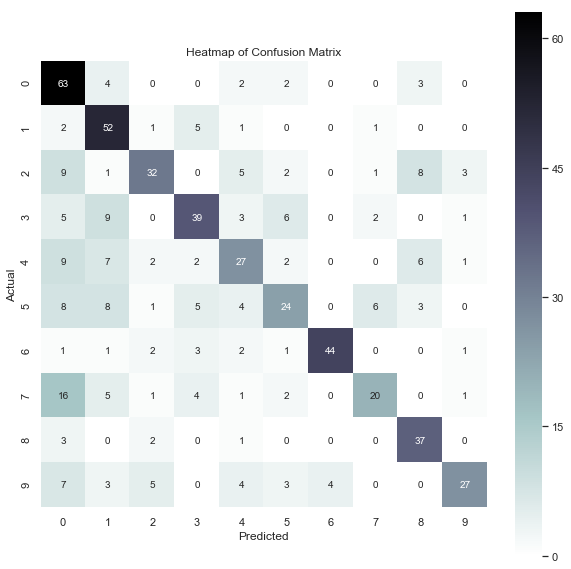

In [138]:
rfc = ensemble.RandomForestClassifier(n_estimators=100)

train_tfidf = rfc.fit(X_train_tfidf, y_train_tfidf)

y_pred_rfc = rfc.predict(X_test_tfidf)

print('training set score:', rfc.score(X_train_tfidf, y_train_tfidf))
print('\ntest set score:', rfc.score(X_test_tfidf, y_test_tfidf))

print(pd.crosstab(y_test_tfidf, y_pred_rfc, margins=True))
print(f1_score(y_test_tfidf, y_pred_rfc, average='macro'))
sns.heatmap(pd.crosstab(y_test_tfidf, y_pred_rfc), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

Random Forest performed slightly worse with tf-idf than with Bag of Words.

## Gradient-Boosted Decision Tree Model

training set score: 0.9994232987312572

test set score: 0.5882352941176471
col_0    0   1   2   3   4   5   6   7   8   9  All
row_0                                              
0       56   5   3   2   2   1   0   4   1   0   74
1        4  45   2   7   2   2   0   0   0   0   62
2       10   2  30   2   4   4   1   2   3   3   61
3       12   5   0  38   0   6   0   2   0   2   65
4        8   4   6   3  25   4   0   0   4   2   56
5       13   2   0   5   5  25   1   4   3   1   59
6        5   3   0   1   2   3  39   0   0   2   55
7       13   5   1   1   2   2   1  23   1   1   50
8        6   0   1   1   2   0   0   0  31   2   43
9       13   1   2   2   2   1   3   1   0  28   53
All    140  72  45  62  46  48  45  36  43  41  578
0.5948513642122512


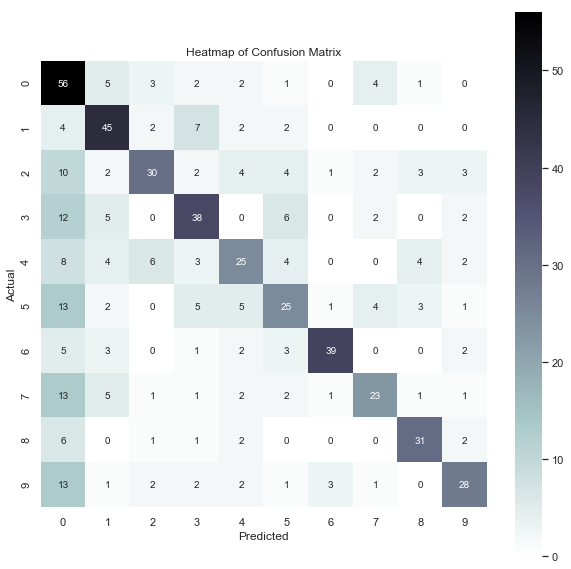

In [139]:
gbdt = ensemble.GradientBoostingClassifier(n_estimators=50, max_depth=4)

train_tfidf = gbdt.fit(X_train_tfidf, y_train_tfidf)

y_pred_gbdt = gbdt.predict(X_test_tfidf)

print('training set score:', gbdt.score(X_train_tfidf, y_train_tfidf))
print('\ntest set score:', gbdt.score(X_test_tfidf, y_test_tfidf))

gbdt_crosstab = pd.crosstab(y_test_tfidf, y_pred_gbdt)

print(pd.crosstab(y_test_tfidf, y_pred_gbdt, margins=True))
print(f1_score(y_test_tfidf, y_pred_gbdt, average='macro'))
sns.heatmap(gbdt_crosstab, annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

Gradient boost is once again a gradient bust.

## KNN Classifier

training set score: 0.7352941176470589

test set score: 0.6833910034602076
col_0   0   1   2   3   4   5   6   7   8   9  All
row_0                                             
0      49   2   5   0   2   2   4   1   8   1   74
1       1  54   0   2   0   4   0   1   0   0   62
2       0   3  40   1   0   1   8   0   6   2   61
3       3   5   3  33   1   9   5   1   3   2   65
4       1   7   1   1  27   4   6   0   9   0   56
5       3   4   4   0   0  38   4   1   4   1   59
6       0   2   1   0   0   2  49   0   0   1   55
7       7   3   3   1   2   8   4  20   1   1   50
8       0   1   1   0   0   0   0   0  41   0   43
9       1   0   3   0   0   0   3   0   2  44   53
All    65  81  61  38  32  68  83  24  74  52  578
0.6758492097928404


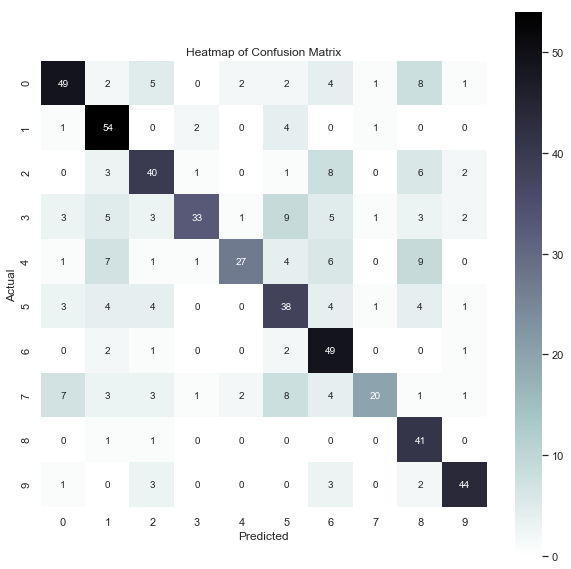

In [140]:
knn = KNeighborsClassifier(n_neighbors=37)

train_tfidf = knn.fit(X_train_tfidf, y_train_tfidf)

y_pred_knn = knn.predict(X_test_tfidf)

print('training set score:', knn.score(X_train_tfidf, y_train_tfidf))
print('\ntest set score:', knn.score(X_test_tfidf, y_test_tfidf))

knn_crosstab = pd.crosstab(y_test_tfidf, y_pred_knn)

print(pd.crosstab(y_test_tfidf, y_pred_knn, margins=True))
print(f1_score(y_test_tfidf, y_pred_knn, average='macro'))
sns.heatmap(knn_crosstab, annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

In stark contrast to KNN's earlier performance with binary inputs, KNN's score here outperformed both Random Forest and gradient boosted decision tree classifiers, but Logistic Regression is still the best predictor.

# 10.) TF-IDF Classification with LSA

## Multinomial Naive Bayes Model

Naive Bayes assumes binary inputs, and so does not work with vectorized inputs that have negative values.

## Logistic Regression Model

(1734, 300) (1734,)
training set score: 0.6787773933102653

test set score: 0.16782006920415224
col_0    0   1   2   3   4   5   6   7   8   9  All
row_0                                              
0       20   6   3  10   3   7   6   9   6   8   78
1       12  31   4   1   8   2   3   4   2   1   68
2       20   7   2   7   6   9   3   2   4   0   60
3        7   0   9  11   8   8   1   5   3   6   58
4       14   5   7   6   8   7   3   4   2   1   57
5        9   9   1  12   1   5   5   8   2   4   56
6       18   8   2   4   4   4   7   3   2   2   54
7        6  13   5   5   4   2   3   3   2   6   49
8       13   2   5  10   2   3   2   2   0  10   49
9        9   3   6   4   3   7   1   2   4  10   49
All    128  84  44  70  47  54  34  42  27  48  578
0.14883718193757262


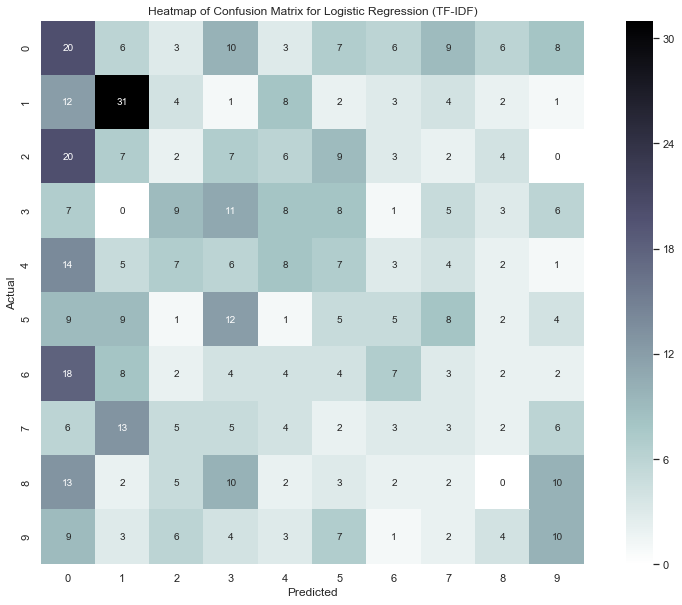

In [308]:
lr = LogisticRegression()
train_lsa = lr.fit(X_train_lsa, y_train_lsa)
print(X_train_lsa.shape, y_train_lsa.shape)
print('training set score:', lr.score(X_train_lsa, y_train_lsa))
print('\ntest set score:', lr.score(X_test_lsa, y_test_lsa))

y_pred_lr = lr.predict(X_test_lsa)

print(pd.crosstab(y_test_lsa, y_pred_lr, margins=True))
print(f1_score(y_test_lsa, y_pred_lr, average='macro'))
sns.heatmap(pd.crosstab(y_test_lsa, y_pred_lr), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix for Logistic Regression (TF-IDF)')
plt.show()

## Random Forest Model

training set score: 1.0

test set score: 0.16262975778546712
col_0    0    1   2   3   4   5   6   7   8   9  All
row_0                                               
0       28   11   5   7   3   4   8   5   6   1   78
1       17   35   5   1   1   3   4   2   0   0   68
2       18   14   1  10   7   4   2   1   2   1   60
3       16    3   6  13   5   6   6   1   0   2   58
4       16   14   3   8   4   5   4   1   1   1   57
5       14   13   4   8   3   4   3   4   1   2   56
6       17   16   4   3   3   2   1   5   2   1   54
7       10   12   3   7   3   3   3   1   3   4   49
8       18    8   6   5   1   4   1   1   1   4   49
9        9   10   4   7   4   3   3   1   2   6   49
All    163  136  41  69  34  38  35  22  18  22  578
0.12225530156403921


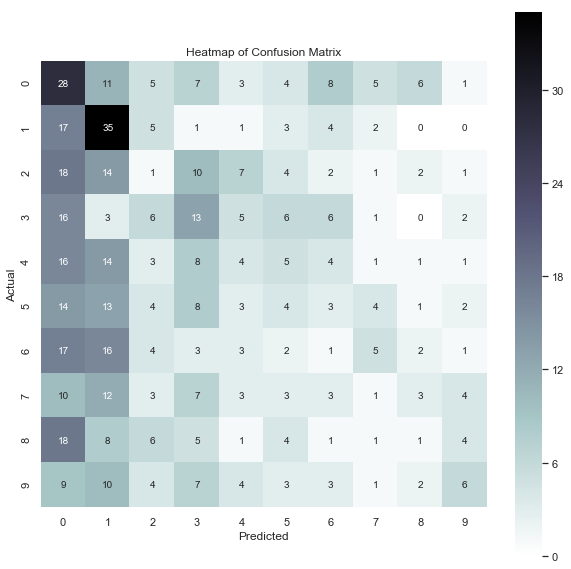

In [142]:
rfc = ensemble.RandomForestClassifier(n_estimators=100)

train_lsa = rfc.fit(X_train_lsa, y_train_lsa)

y_pred_rfc = rfc.predict(X_test_lsa)

print('training set score:', rfc.score(X_train_lsa, y_train_lsa))
print('\ntest set score:', rfc.score(X_test_lsa, y_test_lsa))

print(pd.crosstab(y_test_lsa, y_pred_rfc, margins=True))
print(f1_score(y_test_lsa, y_pred_rfc, average='macro'))
sns.heatmap(pd.crosstab(y_test_lsa, y_pred_rfc), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

## Gradient-Boosted Decision Tree Model

training set score: 0.9925028835063437

test set score: 0.14878892733564014
col_0   0   1   2   3   4   5   6   7   8   9  All
row_0                                             
0       4   8   7  10   8  13   7  10   6   5   78
1       6  26   7   1   7   5   6   6   2   2   68
2      13   8   7   8   6   7   4   4   2   1   60
3       5   1  10  10  10   8   3   7   3   1   58
4      10   7   1   5   8  10   5   5   3   3   57
5       5   8   3   5   4   6   7   8   5   5   56
6       8  11   1   8   6   5   6   2   5   2   54
7       2   8   2   4  15   5   2   4   3   4   49
8      10   3   5   8   1   5   3   4   4   6   49
9       2   3  10   3   2   4   1   6   7  11   49
All    65  83  53  62  67  68  44  56  40  40  578
0.14523999479282187


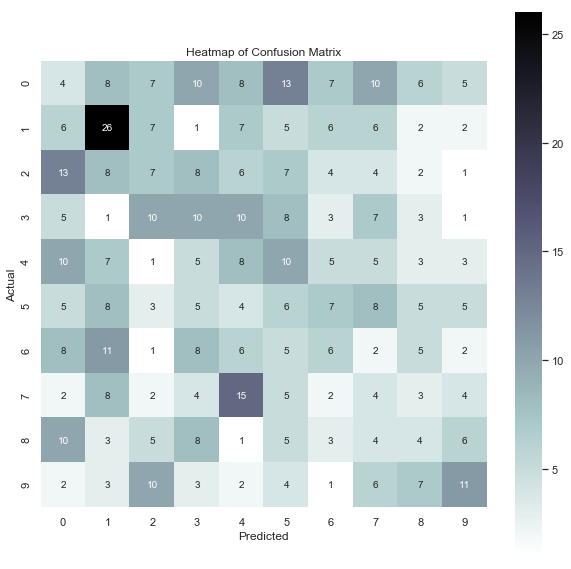

In [143]:
gbdt = ensemble.GradientBoostingClassifier(n_estimators=50, max_depth=4)

train_lsa = gbdt.fit(X_train_lsa, y_train_lsa)

y_pred_gbdt = gbdt.predict(X_test_lsa)

print('training set score:', gbdt.score(X_train_lsa, y_train_lsa))
print('\ntest set score:', gbdt.score(X_test_lsa, y_test_lsa))

gbdt_crosstab = pd.crosstab(y_test_lsa, y_pred_gbdt)

print(pd.crosstab(y_test_lsa, y_pred_gbdt, margins=True))
print(f1_score(y_test_lsa, y_pred_gbdt, average='macro'))
sns.heatmap(gbdt_crosstab, annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

## KNN Classifier

training set score: 0.4134948096885813

test set score: 0.185121107266436
col_0    0    1   2   3   4   5   6   7   8   9  All
row_0                                               
0       21   12  11   9   7   1   5   2   5   5   78
1       14   33   7   1   6   1   2   2   2   0   68
2       14   17   5   5   8   6   4   1   0   0   60
3        8    4  14  12  12   3   2   0   2   1   58
4       12    9   8   4  12   3   4   4   1   0   57
5        8   12  11   7   5   2   7   0   1   3   56
6       16   10   4   4   6   2   9   0   3   0   54
7        8   15   6   3   3   3   5   1   2   3   49
8       11   17   5   3   1   0   4   2   3   3   49
9        6   13   5   5   4   2   3   1   1   9   49
All    118  142  76  53  64  23  45  13  20  24  578
0.1614905185921967


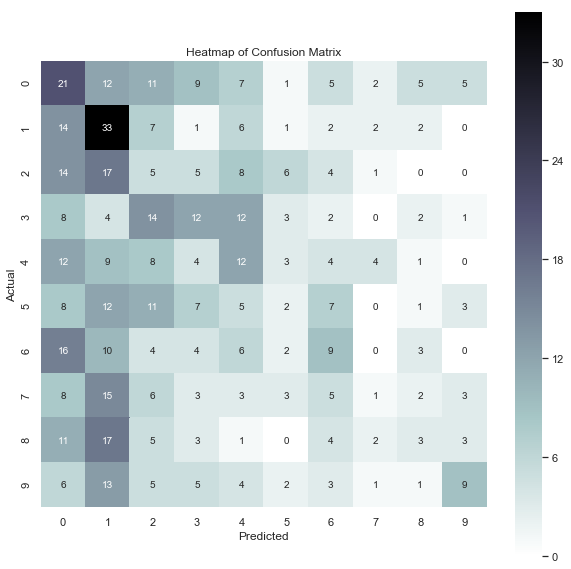

In [144]:
knn = KNeighborsClassifier(n_neighbors=37)

train_lsa = knn.fit(X_train_lsa, y_train_lsa)

y_pred_knn = knn.predict(X_test_lsa)

print('training set score:', knn.score(X_train_lsa, y_train_lsa))
print('\ntest set score:', knn.score(X_test_lsa, y_test_lsa))

knn_crosstab = pd.crosstab(y_test_lsa, y_pred_knn)

print(pd.crosstab(y_test_lsa, y_pred_knn, margins=True))
print(f1_score(y_test_lsa, y_pred_knn, average='macro'))
sns.heatmap(knn_crosstab, annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

All of these are abysmally bad.

# 11.) Visualization of TF-IDF Vectorization

In [145]:
df1.columns

Index(['business_id', 'cool', 'date', 'funny', 'review_id', 'stars', 'text',
       'useful', 'user_id', 'user_num', 'datetime', 'age_days', 'month',
       'review_length', 'words_in_review', 'cleaned_text1', 'nlp_text',
       'num_sents', 'mean_sent_length', 'max_sent_length', 'cleaned_text2',
       'adj_adv_count', 'unique_word_count', 'adj/words',
       'unique_words/words'],
      dtype='object')

In [146]:
tv = TfidfVectorizer(min_df=0., max_df=1., use_idf=True)

tv_matrix = tv.fit_transform(normed_text)
tv_matrix = tv_matrix.toarray()

tfidf_vocab = tv.get_feature_names()
pd.DataFrame(tv_matrix, columns=tfidf_vocab)

,aa,aaa,aaaaaamazing,aaaaaand,aaaaamazing,aaaal,aaal,aah,aaron,ab,...,zipup,znaimer,zombie,zone,zones,zoning,zoo,zs,zucchini,zumba
0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
3,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
5,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
6,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
7,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
8,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
9,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


## t-SNE Visualization of TF-IDF Vector Array

In [147]:
tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=1000)
tsne_results_tfidf = tsne.fit_transform(tv_matrix)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2312 samples in 1.416s...
[t-SNE] Computed neighbors for 2312 samples in 133.931s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2312
[t-SNE] Computed conditional probabilities for sample 2000 / 2312
[t-SNE] Computed conditional probabilities for sample 2312 / 2312
[t-SNE] Mean sigma: 0.211328
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.972328
[t-SNE] Error after 1000 iterations: 2.328975


In [148]:
tsne_results_tfidf

array([[-20.512045, -25.371689],
       [-27.372332, -29.2549  ],
       [ 24.202385, -45.532524],
       ...,
       [ 39.00785 , -27.771114],
       [-25.162834,  43.86035 ],
       [  9.27978 , -34.89304 ]], dtype=float32)

In [149]:
tsne_results_tfidf = pd.DataFrame(tsne_results_tfidf, columns = ['x_tsne', 'y_tsne'])

In [150]:
df1['x_tsne'] = tsne_results_tfidf['x_tsne']
df1['y_tsne'] = tsne_results_tfidf['y_tsne']

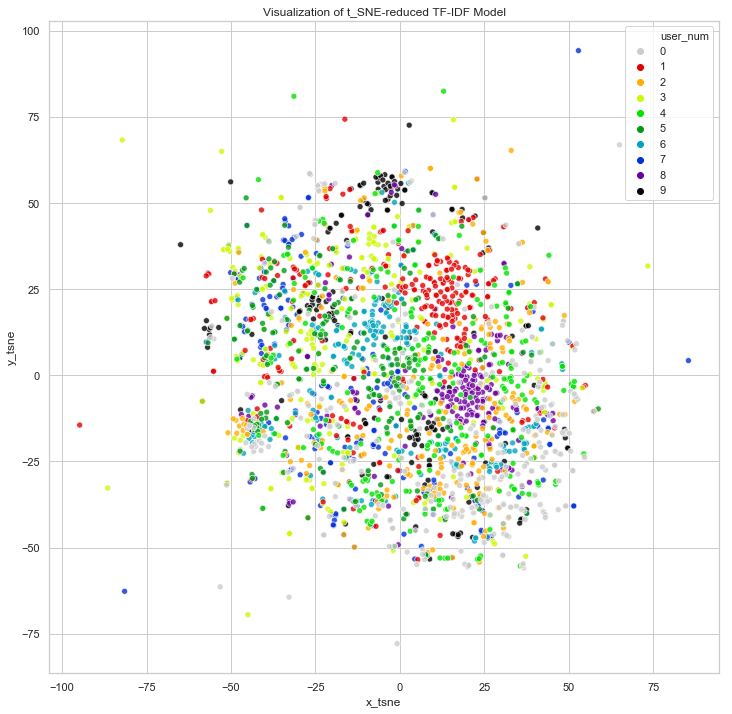

In [309]:
plt.rcParams['figure.figsize'] = (12, 12)

sns.scatterplot(x='x_tsne', y='y_tsne', data=df1, palette='nipy_spectral_r',
                hue='user_num', legend='full', alpha=0.8)
plt.title('Visualization of t_SNE-reduced TF-IDF Model')
plt.show()

t-SNE seems to be much better for visualizing groupings of reviews by user. There is still clearly some overlap

## Cosine Similarity Heatmap

In [152]:
similarity_matrix = cosine_similarity(tv_matrix)
similarity_df = pd.DataFrame(similarity_matrix)

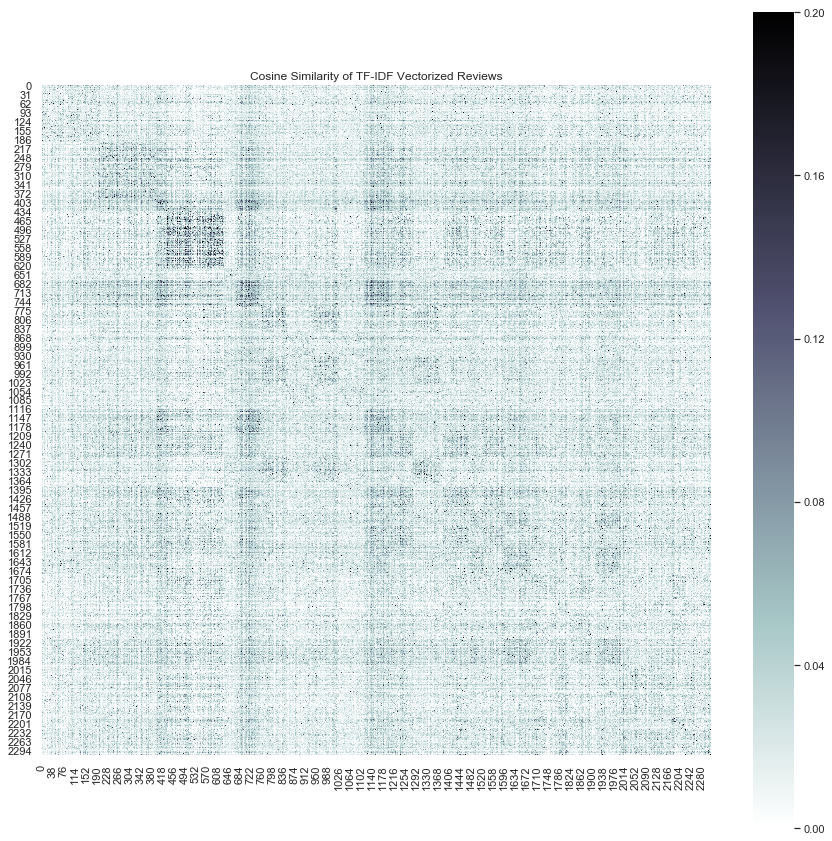

In [153]:
plt.rcParams['figure.figsize'] = (15, 15)

sns.heatmap(similarity_df, square=True, vmin=0, vmax=0.2, cmap='bone_r')
plt.title('Cosine Similarity of TF-IDF Vectorized Reviews')
plt.show()

plt.rcParams['figure.figsize'] = (15, 10)

Although the scores are low, there are visible bands of similarity among user reviews from the same users.

# 12.) Text-Based Clustering

## By Review

### SciPy Hierarchical Dendrogram Clustering

In [154]:
Z = linkage(similarity_matrix, 'ward')
Z_df = pd.DataFrame(Z, columns=['Cluster 1', 'Cluster 2', 'Distance', 'Cluster Size'], dtype='object')

Z_df.head()

,Cluster 1,Cluster 2,Distance,Cluster Size
0,578,589,0.457316,2
1,29,78,0.965462,2
2,644,921,1.0972,2
3,1336,1348,1.09995,2
4,1623,1670,1.15588,2


In [155]:
Z_df['Cluster Size'].value_counts()

2.0       940
3.0       336
4.0       249
5.0       119
6.0       114
8.0        63
7.0        52
9.0        45
10.0       32
12.0       28
11.0       25
15.0       23
14.0       18
13.0       16
19.0       16
17.0       13
18.0       12
16.0       11
20.0       10
23.0        7
24.0        7
27.0        7
22.0        7
31.0        6
21.0        6
35.0        6
25.0        5
52.0        5
41.0        4
34.0        4
         ... 
621.0       1
111.0       1
49.0        1
63.0        1
68.0        1
70.0        1
250.0       1
75.0        1
76.0        1
55.0        1
54.0        1
53.0        1
81.0        1
51.0        1
594.0       1
520.0       1
577.0       1
84.0        1
45.0        1
44.0        1
86.0        1
87.0        1
89.0        1
93.0        1
94.0        1
98.0        1
104.0       1
2312.0      1
107.0       1
251.0       1
Name: Cluster Size, Length: 116, dtype: int64

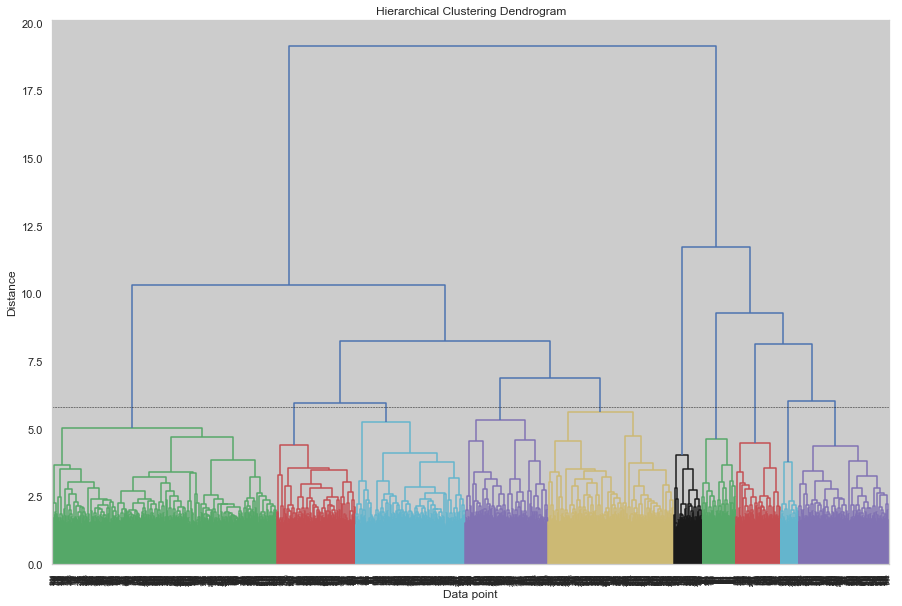

In [156]:
plt.rcParams['figure.figsize'] = (15, 10)

plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Data point')
plt.ylabel('Distance')

dendrogram(Z, color_threshold=5.8)
plt.axhline(y=5.8, c='k', ls='--', lw=0.5)

plt.show()

Hierarchical dendrogram clustering is not all that easily interpretable.

In [157]:
max_dist = 5.8

print(max_dist)
cluster_labels = fcluster(Z, max_dist, criterion='distance')
cluster_labels = pd.DataFrame(cluster_labels, columns=['ClusterLabel'])

cluster_labels['ClusterLabel'].value_counts()

5.8


1     621
5     348
3     303
10    250
4     229
2     217
8     124
7      94
6      76
9      50
Name: ClusterLabel, dtype: int64

In [158]:
cluster_df = pd.concat([df1, cluster_labels], axis=1)

In [159]:
cluster_df['ClusterLabel'] = cluster_df['ClusterLabel'] - 1

In [160]:
cluster_df.head()

,business_id,cool,date,funny,review_id,stars,text,useful,user_id,user_num,...,mean_sent_length,max_sent_length,cleaned_text2,adj_adv_count,unique_word_count,adj/words,unique_words/words,x_tsne,y_tsne,ClusterLabel
0,FAWfhHcwPB5O4xfz70EOug,0,2010-04-23,0,TO-ZK5BHDBCcH7--whiwPg,4,"If you watch the food network long enough, you...",6,U3Su5FLssAUKNYonpzIgRw,7,...,18.000000,25,watch food network long enough youre bound enc...,27,98,0.197080,0.715328,-20.512045,-25.371689,1
1,UofBwHXQ8XR-tI4MwkrJ0A,2,2010-05-19,0,fwtbZXrg2MH1Zty2dHUReA,4,Jan's Meat & Deli is a pleasant Polish market ...,4,U3Su5FLssAUKNYonpzIgRw,7,...,21.500000,31,jans meat deli pleasant polish market plenty f...,17,59,0.226667,0.786667,-27.372332,-29.254900,0
2,DG5j9ZSBlgKMVgPjLuZCdw,0,2010-04-22,0,RM6XfIrsh-JWWATqaOpBag,4,If you find yourself in downtown Calgary with ...,2,U3Su5FLssAUKNYonpzIgRw,7,...,22.333333,39,find downtown calgary friends colleagues youre...,30,120,0.176471,0.705882,24.202385,-45.532524,9
3,KVdpzUSDbFfFif5QUx7Kyg,5,2010-05-21,2,f8manAU8A8t5Xy6SuW5PqQ,4,"Rice-a-Roni may call themselves the ""San Franc...",7,U3Su5FLssAUKNYonpzIgRw,7,...,30.000000,47,ricearoni may call san francisco treat youve e...,27,97,0.180000,0.646667,-19.036085,-40.615448,4
4,DvdL82xg-Vpz8GsPruwhag,0,2010-04-17,0,RpCtY8slrdFVWwQ6iXSQQw,4,This cute little bakery in Glenmore Landing ha...,1,U3Su5FLssAUKNYonpzIgRw,7,...,24.500000,39,cute little bakery glenmore landing way store ...,26,97,0.198473,0.740458,-19.609653,-43.581707,9


col_0    -1     0   1  2  3  4  5  6  7  8   All
row_0                                           
0       134   170   5  2  0  0  0  0  0  0   311
1       176    81   3  1  7  2  1  0  0  0   271
2       106   124   2  2  1  3  1  0  0  0   239
3        14   220   0  0  0  0  0  0  0  0   234
4       139    86   0  1  0  0  0  0  1  0   227
5        79   141   1  1  0  0  1  0  1  0   224
6        85   127   0  1  0  0  0  0  0  1   214
7       132    62   0  0  0  0  0  3  1  0   198
8       110    83   1  0  0  0  1  0  0  2   197
9       154    37   0  0  0  0  2  1  1  2   197
All    1129  1131  12  8  8  5  6  4  4  5  2312


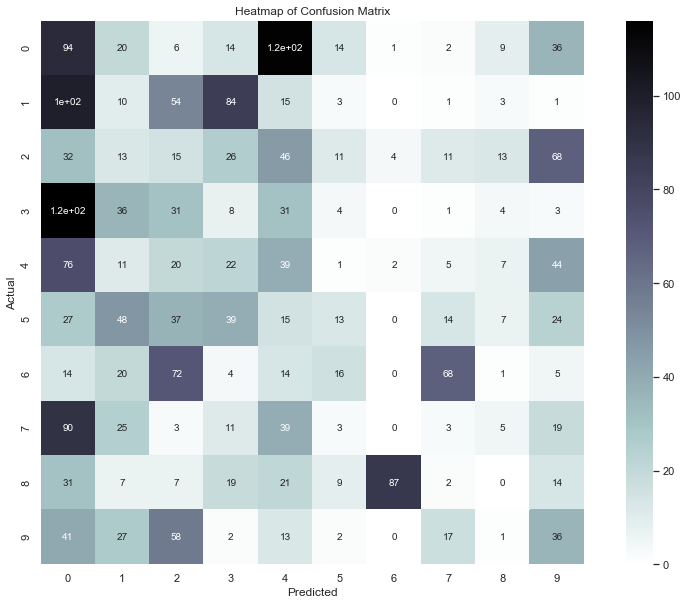

In [161]:
print(pd.crosstab(y, labels, margins=True))
sns.heatmap(pd.crosstab(cluster_df['user_num'], cluster_df['ClusterLabel']), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

## By Author

In [162]:
auth_blocks = [normalize_document(block) for block in blocks]

In [163]:
tv = TfidfVectorizer(min_df=0.2, max_df=1.0, use_idf=True)
tv_matrix = tv.fit_transform(df1['text'])
tv_matrix = tv_matrix.toarray()

vocab = tv.get_feature_names()
nltk_tfidf = pd.DataFrame(np.round(tv_matrix, 4), columns=vocab)
nltk_tfidf

,about,all,also,an,and,are,as,at,back,be,...,we,well,were,what,when,which,with,would,you,your
0,0.0000,0.1018,0.0000,0.1163,0.1674,0.0000,0.0982,0.1778,0.0000,0.0997,...,0.0000,0.1332,0.0000,0.1271,0.0000,0.2438,0.0793,0.0000,0.3107,0.1195
1,0.0000,0.0000,0.2188,0.0000,0.3850,0.0000,0.3387,0.1534,0.0000,0.0000,...,0.0000,0.2297,0.0000,0.0000,0.0000,0.0000,0.1368,0.0000,0.1340,0.4124
2,0.1054,0.0000,0.0000,0.0000,0.3794,0.0000,0.0834,0.0000,0.0000,0.0000,...,0.0000,0.1132,0.0000,0.0000,0.0000,0.2072,0.0674,0.0000,0.1980,0.1016
3,0.0000,0.2363,0.0981,0.0899,0.2589,0.0000,0.0000,0.0687,0.0000,0.1542,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0613,0.0000,0.3003,0.0924
4,0.0000,0.0000,0.0000,0.0000,0.2778,0.0896,0.2932,0.0000,0.0000,0.0000,...,0.0000,0.1326,0.1167,0.0000,0.0000,0.1214,0.0790,0.0000,0.1546,0.0000
5,0.0000,0.0000,0.1341,0.2458,0.2360,0.0952,0.2076,0.0000,0.2840,0.0000,...,0.0000,0.1408,0.0000,0.0000,0.0000,0.1289,0.0000,0.0000,0.1642,0.3791
6,0.1326,0.1089,0.0000,0.1244,0.1791,0.0000,0.2100,0.0000,0.0000,0.0000,...,0.0000,0.1424,0.0000,0.0000,0.1218,0.0000,0.0848,0.0000,0.3323,0.0000
7,0.0000,0.0000,0.1262,0.0000,0.3887,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.2368,0.0000,0.1546,0.0000
8,0.0000,0.0000,0.2068,0.1895,0.1819,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.3798,0.1949
9,0.0000,0.1407,0.0000,0.0803,0.2699,0.1867,0.1357,0.1229,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0787,0.0000,0.2741,0.0000,0.2147,0.1652


In [164]:
tv = TfidfVectorizer(min_df=0., max_df=1., use_idf=True)

auth_tv_matrix = tv.fit_transform(auth_blocks)
auth_tv_matrix = auth_tv_matrix.toarray()

vocab = tv.get_feature_names()
auth_nltk_tfidf = pd.DataFrame(auth_tv_matrix, columns=vocab)
auth_nltk_tfidf

,00,000,00am,00pm,01,06,10,100,1000,100lbs,...,zippy,znaimer,zombie,zone,zones,zoning,zoo,zucchini,zumba,épicerie
0,0.003417,0.000000,0.000000,0.00000,0.000000,0.000000,0.027061,0.007063,0.000000,0.003182,...,0.003182,0.000000,0.000000,0.001708,0.000000,0.000000,0.000000,0.001551,0.000000,0.003182
1,0.002012,0.004956,0.000000,0.00000,0.000000,0.000000,0.020784,0.008318,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.002012,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.006355,0.000000,0.000000,0.00000,0.000000,0.000000,0.029178,0.005255,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003847,0.007892,0.000000
3,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.011748,0.006045,0.000000,0.000000,...,0.000000,0.004539,0.004539,0.007311,0.004539,0.003859,0.010782,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.002062,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.004741,0.003312,0.002718,0.000000,0.000000
5,0.000000,0.007781,0.000000,0.00000,0.000000,0.000000,0.021753,0.005224,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.004211,0.000000,0.000000,0.011646,0.000000,0.000000,0.000000
6,0.001226,0.001510,0.000000,0.00000,0.000000,0.000000,0.018575,0.006082,0.002284,0.000000,...,0.000000,0.000000,0.000000,0.001226,0.000000,0.000000,0.004068,0.005566,0.000000,0.000000
7,0.007835,0.009650,0.004865,0.00973,0.000000,0.000000,0.025181,0.006479,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002371,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.010026,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.006609,0.000000,0.000000
9,0.007202,0.000000,0.000000,0.00000,0.003354,0.003354,0.033482,0.007444,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.001801,0.000000,0.000000,0.003983,0.001635,0.000000,0.000000


#### Cosine Similarity

In [165]:
auth_similarity_matrix = cosine_similarity(auth_tv_matrix)
auth_similarity_df = pd.DataFrame(auth_similarity_matrix)
auth_similarity_df

,0,1,2,3,4,5,6,7,8,9
0,1.000000,0.612841,0.726688,0.623208,0.696890,0.670869,0.686211,0.674426,0.631133,0.611693
1,0.612841,1.000000,0.601556,0.696921,0.636388,0.696910,0.656979,0.590089,0.490018,0.561117
2,0.726688,0.601556,1.000000,0.596308,0.714054,0.677335,0.711304,0.667465,0.627209,0.661883
3,0.623208,0.696921,0.596308,1.000000,0.625450,0.712591,0.678652,0.632912,0.496406,0.588610
4,0.696890,0.636388,0.714054,0.625450,1.000000,0.727904,0.705065,0.617618,0.691012,0.637859
5,0.670869,0.696910,0.677335,0.712591,0.727904,1.000000,0.733202,0.678031,0.590513,0.660520
6,0.686211,0.656979,0.711304,0.678652,0.705065,0.733202,1.000000,0.658962,0.607247,0.697573
7,0.674426,0.590089,0.667465,0.632912,0.617618,0.678031,0.658962,1.000000,0.511627,0.582339
8,0.631133,0.490018,0.627209,0.496406,0.691012,0.590513,0.607247,0.511627,1.000000,0.515366
9,0.611693,0.561117,0.661883,0.588610,0.637859,0.660520,0.697573,0.582339,0.515366,1.000000


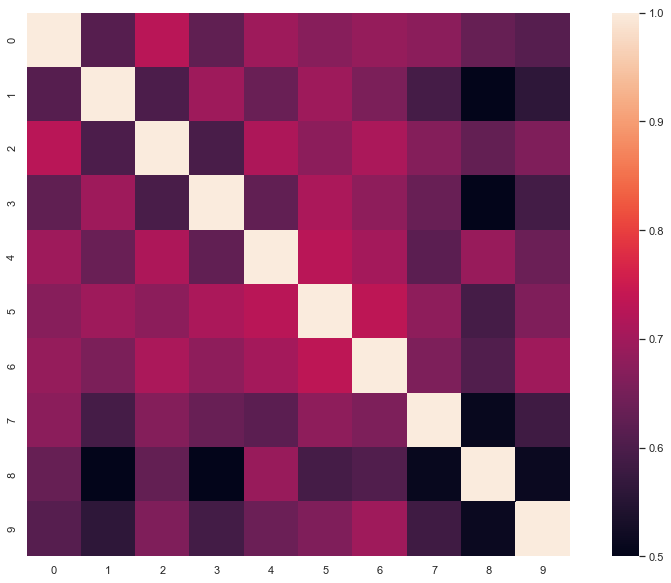

In [166]:
sns.heatmap(auth_similarity_df, square=True, vmin=0.5, vmax=1)

plt.rcParams['figure.figsize'] = 12, 12
plt.show()

In [167]:
Z = linkage(auth_similarity_matrix, 'ward')
pd.DataFrame(Z, columns=['Cluster 1', 'Cluster 2', 'Distance', 'Cluster Size'], dtype='object')

,Cluster 1,Cluster 2,Distance,Cluster Size
0,5,6,0.386051,2
1,0,2,0.392172,2
2,1,3,0.432798,2
3,4,10,0.440879,3
4,11,13,0.518683,5
5,7,14,0.571269,6
6,9,15,0.599275,7
7,12,16,0.735853,9
8,8,17,0.788446,10


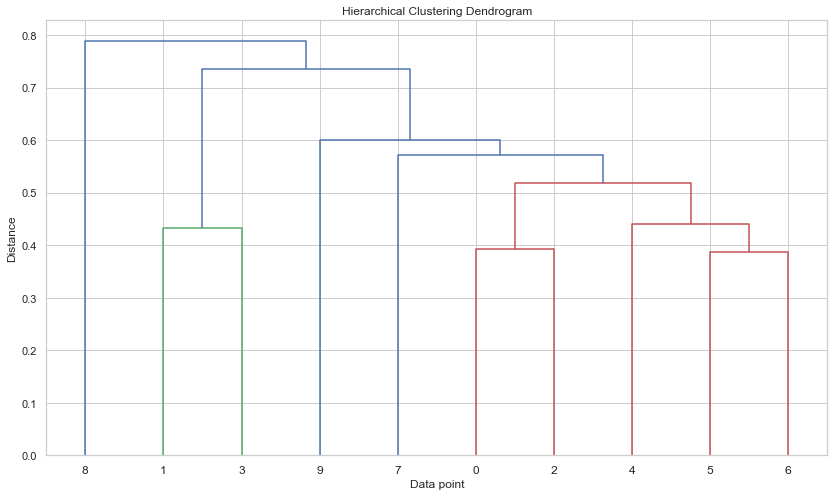

In [168]:
plt.figure(figsize=(14, 8))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Data point')
plt.ylabel('Distance')
dendrogram(Z)
plt.axhline(y=1.0, c='k', ls='--', lw=0.5)

In [169]:
block_df = pd.DataFrame(blocks, columns=['text block'])

In [170]:
block_df['user'] = userlist

In [171]:
block_df

,text block,user
0,I have no complaints about this clinic. The RP...,0
1,Play De Record is a big old record store on Yo...,1
2,I love all the healthy choices popping \n up a...,2
3,You can get New Balance shoes in a lot of stor...,3
4,"Cool place, way larger than it looks from the ...",4
5,"Calgary, this is real pizza. Big John's looks ...",5
6,So this big guy- that looks like Elvis- sits i...,6
7,"If you watch the food network long enough, you...",7
8,Very enjoyable and personal trail ride! We lea...,8
9,I am not a fan of Wal-Mart & will not shop at ...,9


In [172]:
max_dist = .55

cluster_labels = fcluster(Z, max_dist, criterion='distance')
cluster_labels = pd.DataFrame(cluster_labels, columns=['Cluster Label'])
pd.concat([block_df, cluster_labels], axis=1)

,text block,user,Cluster Label
0,I have no complaints about this clinic. The RP...,0,2
1,Play De Record is a big old record store on Yo...,1,1
2,I love all the healthy choices popping \n up a...,2,2
3,You can get New Balance shoes in a lot of stor...,3,1
4,"Cool place, way larger than it looks from the ...",4,2
5,"Calgary, this is real pizza. Big John's looks ...",5,2
6,So this big guy- that looks like Elvis- sits i...,6,2
7,"If you watch the food network long enough, you...",7,3
8,Very enjoyable and personal trail ride! We lea...,8,5
9,I am not a fan of Wal-Mart & will not shop at ...,9,4


# 13.) GloVe (Twitter)

We are using the pretrained GloVe Twitter model from Stanford.

(https://nlp.stanford.edu/projects/glove/)

In [173]:
embeddings_index = {}

f = open('glove.twitter.27B/glove.twitter.27B.200d.txt', encoding='utf-8')
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs


f.close()

print('Found %s word vectors.' % len(embeddings_index))

Found 1193514 word vectors.


In [174]:
len(embeddings_index['far'])

200

In [175]:
# Create normalized vector of entire review
# Based on Abhishek Thakur's sent2vec function from "Approaching (Almost) Any NLP Problem"

def review2vec_glove(s):
    words = str(s).lower()
    words = nltk.word_tokenize(words)
    words = [w for w in words if not w in stop_words]
    words = [w for w in words if w.isalpha()]
    
    M = []
    
    for w in words:
        try:
            M.append(embeddings_index[w])
        except:
            continue
    
    M = np.array(M)
    v = M.sum(axis=0)
    if type(v) != np.ndarray:
        return np.zeros(200)
    return v / np.sqrt((v ** 2).sum())

In [176]:
X_r = df1['cleaned_text1'].values

In [177]:
X_train_r, X_test_r, y_train_glove, y_test_glove = train_test_split(X_r, y,
                                    test_size=0.25, stratify=bag_of_words_model['text_source'], random_state=0)

In [178]:
X_train_glove = [review2vec_glove(review) for review in X_train_r]
X_test_glove = [review2vec_glove(review) for review in X_test_r]

In [179]:
X_glove = [review2vec_glove(review) for review in X_r]

In [180]:
X_train_glove = np.array(X_train_glove)
X_test_glove = np.array(X_test_glove)

In [181]:
pd.DataFrame(X_train_glove)

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,-0.062294,-0.024965,-0.010194,0.026017,-0.011520,0.040418,0.141763,-0.034664,-0.000011,-0.050887,...,-0.014838,-0.004686,0.066115,0.008470,0.016023,-0.011890,0.003411,0.029534,0.019965,-0.030164
1,-0.043060,-0.037070,-0.019202,0.012857,0.000061,0.028473,0.132194,-0.019306,-0.015375,-0.055905,...,0.003697,0.006633,0.003266,0.006179,0.049008,-0.012811,0.024386,0.040455,0.011276,-0.035727
2,-0.023632,-0.021103,0.007365,0.011776,-0.000642,0.049749,0.077518,-0.034405,-0.041720,-0.033316,...,0.056127,-0.026437,0.053102,-0.006357,0.013702,-0.003688,0.043879,0.032623,-0.040686,0.005858
3,0.000661,0.006344,0.035580,-0.014588,0.035061,0.008535,0.113638,-0.009181,-0.011122,-0.009051,...,0.012611,-0.031891,0.012351,-0.032585,0.028336,-0.033847,0.021601,0.018662,-0.026057,-0.015341
4,-0.083453,-0.020100,0.025764,0.015357,-0.011722,0.016179,0.154974,-0.029773,-0.004505,-0.054385,...,-0.005981,0.001724,0.005666,-0.010531,0.038565,0.010421,0.018728,0.047129,0.015135,0.012316
5,-0.033914,0.008355,0.004267,0.005146,-0.013499,0.022217,0.158812,-0.005842,-0.005539,-0.029101,...,0.007572,0.003708,0.021392,-0.018870,0.044368,0.000668,-0.007350,0.057811,0.037749,0.004097
6,-0.039807,-0.021570,0.022767,0.025509,-0.001830,0.049744,0.149920,-0.018101,-0.019046,-0.046769,...,0.002172,0.006658,-0.002083,-0.008404,0.048724,-0.002431,0.027563,0.020575,0.008680,-0.015661
7,-0.027193,0.039387,0.024409,-0.003618,-0.002773,0.023048,0.130173,-0.024904,-0.001582,-0.010958,...,0.016879,-0.000461,0.019773,-0.021783,0.000761,0.012177,0.028938,0.030121,-0.009688,0.006854
8,-0.010030,-0.001702,0.005065,0.016028,0.001928,0.029062,0.161349,-0.022902,-0.017876,-0.017205,...,-0.001657,0.015573,0.014495,-0.012825,0.018901,-0.007974,0.018753,0.023659,-0.015639,-0.025654
9,-0.037957,-0.053937,0.006370,0.018955,0.010632,0.039798,0.122717,-0.042572,-0.007840,-0.095857,...,0.000997,0.024439,0.026414,0.029831,0.039253,-0.012047,0.015149,0.026566,0.029750,-0.005228


## SKLearn Clustering Models

### K-Means Clustering Model

col_0    0    1    2    3   4    5    6    7    8    9   All
row_0                                                       
0       63   20   26   59  21   34    2   13   40   33   311
1       11   25   10   60   6   37   62   19   39    2   271
2       22    7   25   19   5   42   25   55   30    9   239
3       48    2   38   19   0   38    3   52   17   17   234
4       29    7   17   26   5   37   13   40   37   16   227
5       20    9   20   18   4   30   13   63   34   13   224
6       29   17    5   29  11   48    7   28   32    8   214
7       18   22   12    7  17   37   13   23   31   18   198
8       16   27   12   22  11   28    5   18   20   38   197
9       12   39   12    8   7   11   12    4   28   64   197
All    268  175  177  267  87  342  155  315  308  218  2312


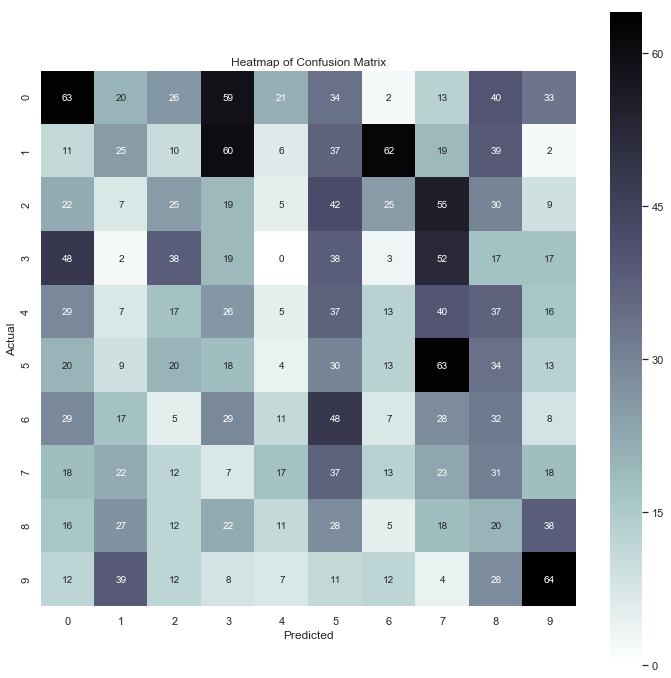

In [182]:
# Calculate predicted values.
y_pred = KMeans(n_clusters=10, random_state=42).fit_predict(X_glove)

print(pd.crosstab(y, y_pred, margins=True))
sns.heatmap(pd.crosstab(y, y_pred), annot=True, square=True, cmap='bone_r')
plt.title('Heatmap of Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [183]:
print("Adjusted Rand Score: ", adjusted_rand_score(y, y_pred))

Adjusted Rand Score:  0.030843052205959526


This model looks to be pretty poor. Most of the entries were grouped into the cluster corresponding to User 1, with a few being grouped into User 6 and User 7 as well.

### Mean-Shift Clustering

In [184]:
bandwidth = estimate_bandwidth(X_norm, quantile=0.90, n_samples=500)

ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(X_norm)

labels = ms.labels_

cluster_centers = ms.cluster_centers_

n_clusters_ = len(np.unique(labels))

print(n_clusters_)

12


col_0     0   1  2  3  4  5  6  7  8  9  10  11   All
row_0                                                
0       301   5  1  1  1  1  1  0  0  0   0   0   311
1       259  10  0  0  0  0  1  1  0  0   0   0   271
2       239   0  0  0  0  0  0  0  0  0   0   0   239
3       234   0  0  0  0  0  0  0  0  0   0   0   234
4       227   0  0  0  0  0  0  0  0  0   0   0   227
5       224   0  0  0  0  0  0  0  0  0   0   0   224
6       213   1  0  0  0  0  0  0  0  0   0   0   214
7       193   4  0  0  0  0  0  0  1  0   0   0   198
8       186  10  0  0  0  0  0  0  0  1   0   0   197
9       179  16  0  0  0  0  0  0  0  0   1   1   197
All    2255  46  1  1  1  1  2  1  1  1   1   1  2312


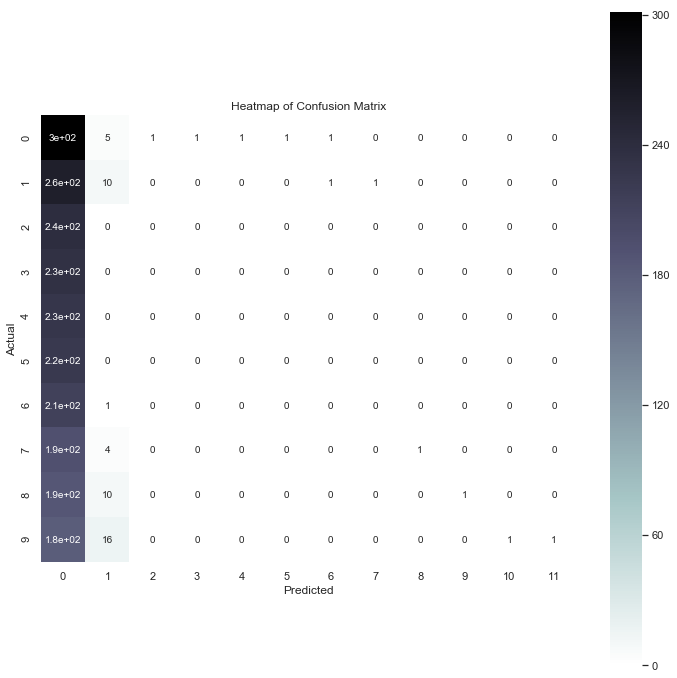

In [185]:
print(pd.crosstab(y, labels, margins=True))
sns.heatmap(pd.crosstab(y, labels), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

In [186]:
print("Adjusted Rand Score: ", adjusted_rand_score(y, labels))

Adjusted Rand Score:  0.0004162485353786556


### Spectral Clustering

In [187]:
n_clusters=10

sc = SpectralClustering(n_clusters=n_clusters)
sc.fit(X_norm)

labels = sc.labels_

n_clusters_ = len(np.unique(labels))

print(n_clusters_)

10


col_0   0    1  2  3   4    5   6   7     8  9   All
row_0                                               
0      24   30  0  0   0   67   8  17   165  0   311
1      25   39  0  0   2  100  14  13    78  0   271
2       1   12  0  0   0   43  11  12   160  0   239
3       0    0  0  0   0    3   1   7   223  0   234
4       3    7  0  0   0   38  14   9   156  0   227
5       1   12  0  0   1   37   3  12   158  0   224
6       0   10  1  1   3   30   5   9   155  0   214
7       0    9  0  0  13   32   1   5   138  0   198
8       0    7  0  0  20   26   3   3   137  1   197
9       0   13  0  0  25   42   6   4   105  2   197
All    54  139  1  1  64  418  66  91  1475  3  2312


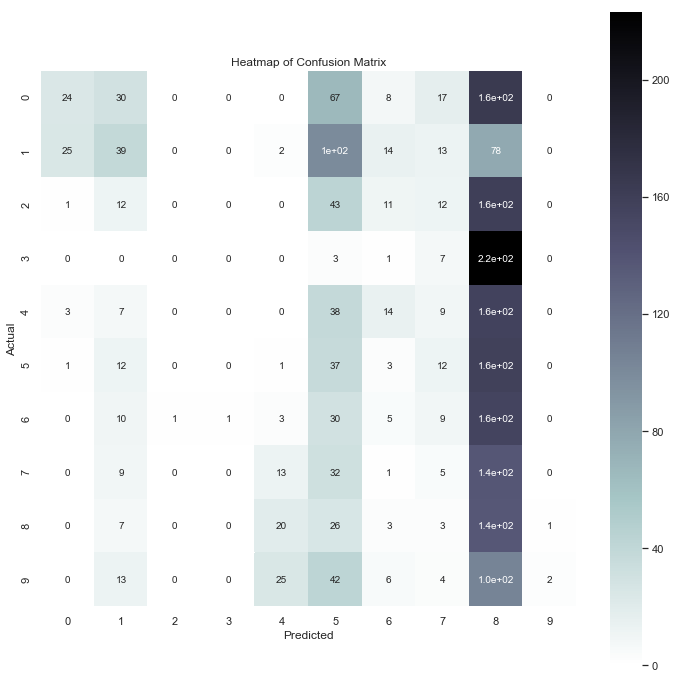

In [188]:
print(pd.crosstab(y, labels, margins=True))
sns.heatmap(pd.crosstab(y, labels), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

In [189]:
print("Adjusted Rand Score: ", adjusted_rand_score(y, labels))

Adjusted Rand Score:  0.013256505480632298


###  DBSCAN

In [190]:
dbscan = DBSCAN(eps=0.05, min_samples=2)
clusters = dbscan.fit_predict(X_norm)

labels = dbscan.labels_

col_0  -1     0  1  2   All
row_0                      
0       1   307  1  2   311
1       0   269  1  1   271
2       0   239  0  0   239
3       0   234  0  0   234
4       0   227  0  0   227
5       0   224  0  0   224
6       0   214  0  0   214
7       0   198  0  0   198
8       1   196  0  0   197
9       2   195  0  0   197
All     4  2303  2  3  2312


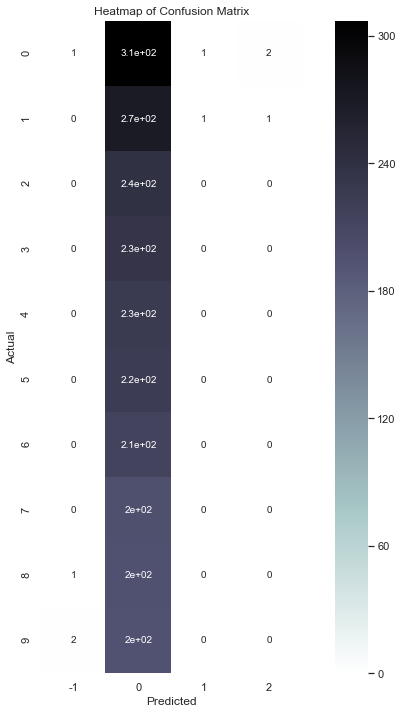

In [191]:
print(pd.crosstab(y, labels, margins=True))
sns.heatmap(pd.crosstab(y, labels), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

In [192]:
print("Adjusted Rand Score: ", adjusted_rand_score(y, labels))

Adjusted Rand Score:  -0.00020549381831053666


# 14.) Visualization of GloVe Vectors

## t-SNE

In [193]:
tsne = TSNE(n_components=2, verbose=1, perplexity=35, n_iter=1000)
tsne_results_glove = tsne.fit_transform(X_glove)

[t-SNE] Computing 106 nearest neighbors...
[t-SNE] Indexed 2312 samples in 0.007s...
[t-SNE] Computed neighbors for 2312 samples in 1.824s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2312
[t-SNE] Computed conditional probabilities for sample 2000 / 2312
[t-SNE] Computed conditional probabilities for sample 2312 / 2312
[t-SNE] Mean sigma: 0.069619
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.840431
[t-SNE] Error after 1000 iterations: 2.001992


In [194]:
tsne_results_glove = pd.DataFrame(tsne_results_glove, columns = ['x_tsne', 'y_tsne'])

In [195]:
df1['x_tsne_glove'] = tsne_results_glove['x_tsne']
df1['y_tsne_glove'] = tsne_results_glove['y_tsne']

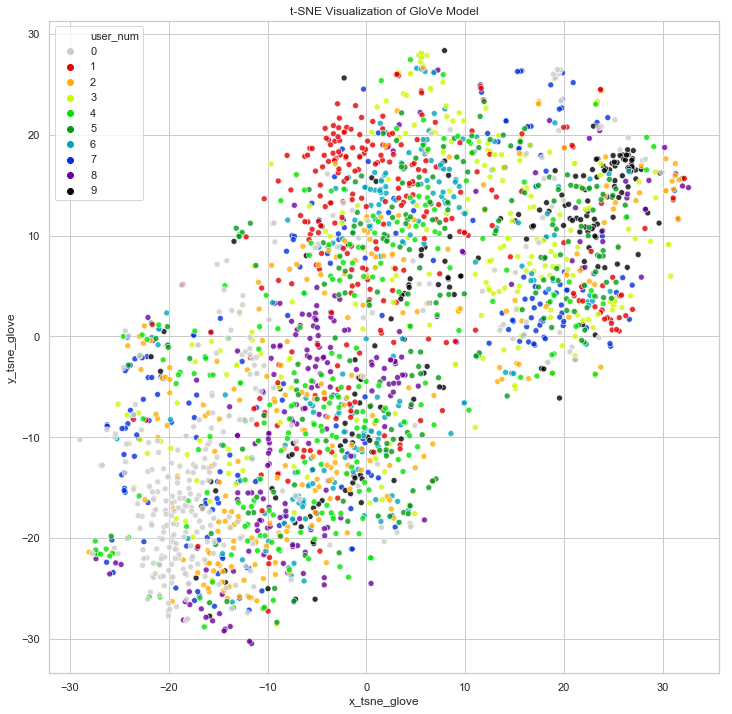

In [310]:
plt.rcParams['figure.figsize'] = (12, 12)

sns.scatterplot(x='x_tsne_glove', y='y_tsne_glove', data=df1, palette='nipy_spectral_r',
                hue='user_num', legend='full', alpha=0.8)
plt.title('t-SNE Visualization of GloVe Model')
plt.show()

We get a different shape for the dimensionally reduced scatterplot, but again we see concentrations of points corresponding to particular users. 1 and 6 are more mixed up with this model, but user 0 is more distinct this time.

## Cosine Similarity Heatmap

In [197]:
similarity_matrix = cosine_similarity(X_glove)
similarity_df = pd.DataFrame(similarity_matrix)

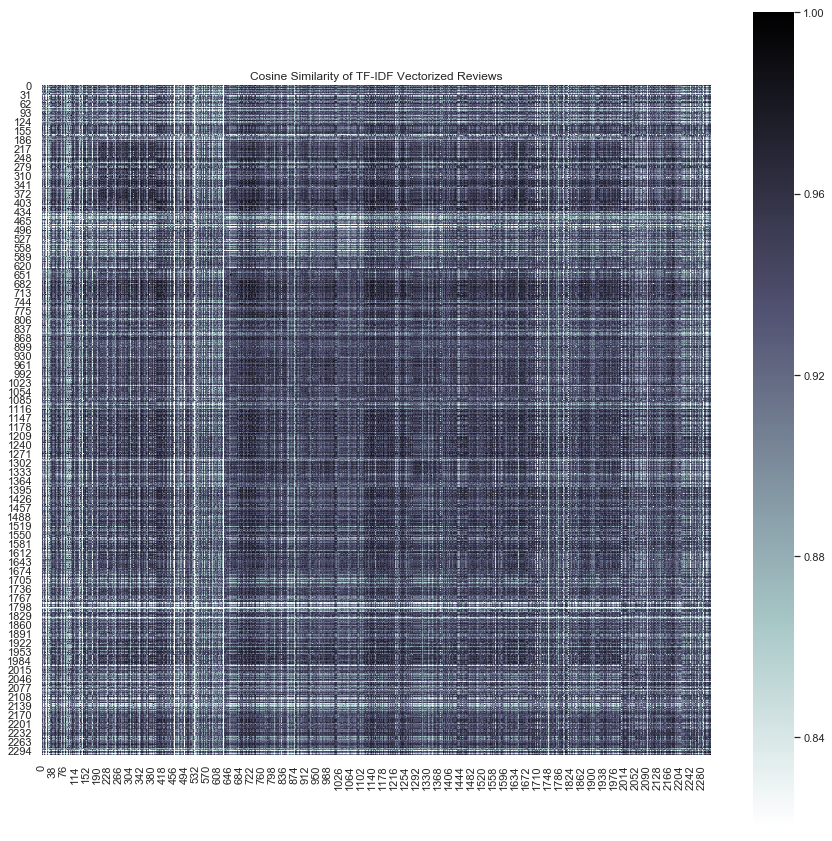

In [198]:
plt.rcParams['figure.figsize'] = (15, 15)

sns.heatmap(similarity_df, square=True, vmin=0.82, vmax=1, cmap='bone_r')
plt.title('Cosine Similarity of TF-IDF Vectorized Reviews')
plt.show()

plt.rcParams['figure.figsize'] = (15, 10)

# 15.) GloVe Classification

In [199]:
plt.rcParams['figure.figsize'] = (10, 10)

## Logistic Regression Model

(1734, 200) (1734,)
training set score: 0.2831603229527105

test set score: 0.2491349480968858
col_0    0    1   2   3  4  5  6  7  8   9  All
row_0                                          
0       53    7   1   6  0  0  0  0  0  11   78
1       22   39   1   3  0  0  1  0  0   2   68
2       16   21   7  15  0  1  0  0  0   0   60
3       24    5   6  20  0  0  0  0  0   3   58
4       21   15   3  10  1  1  1  0  1   4   57
5        9   17   1  20  1  2  2  0  0   4   56
6       19   17   3   8  0  0  2  0  0   5   54
7       16   18   3   2  0  0  0  1  0   9   49
8       17    7   0   8  0  0  3  0  0  14   49
9       19    9   1   0  0  0  0  1  0  19   49
All    216  155  26  92  2  4  9  2  1  71  578
0.16597167549661757


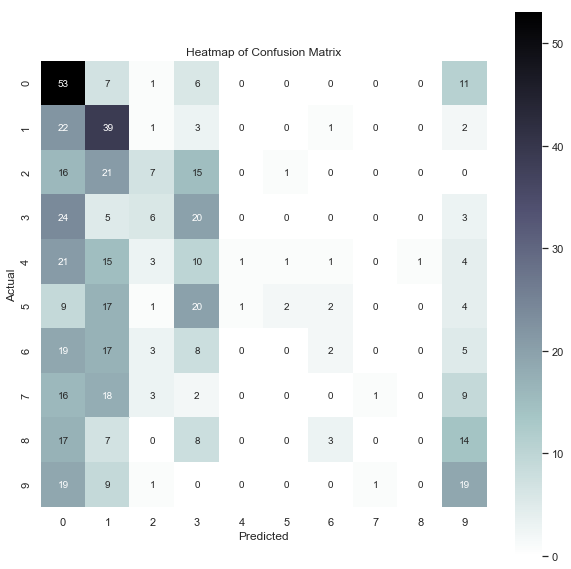

In [200]:
lr = LogisticRegression()
train_glove = lr.fit(X_train_glove, y_train_glove)
print(X_train_glove.shape, y_train_glove.shape)
print('training set score:', lr.score(X_train_glove, y_train_glove))
print('\ntest set score:', lr.score(X_test_glove, y_test_glove))

y_pred_lr = lr.predict(X_test_glove)

print(pd.crosstab(y_test_glove, y_pred_lr, margins=True))
print(f1_score(y_test_glove, y_pred_lr, average='macro'))
sns.heatmap(pd.crosstab(y_test_glove, y_pred_lr), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

## Random Forest Model

training set score: 1.0

test set score: 0.2889273356401384
col_0    0    1   2   3   4   5   6   7   8   9  All
row_0                                               
0       48    7   1   7   4   1   2   2   1   5   78
1       14   36   5   3   5   1   2   0   0   2   68
2        8   11  11  15   6   2   5   1   0   1   60
3       17    4   8  15   3   7   0   0   2   2   58
4       10    7  11   7  11   2   3   1   1   4   57
5        4   10  10  12   4   6   6   1   0   3   56
6       14   13   4   7   3   4   7   1   0   1   54
7       12   10   7   3   2   1   1   4   0   9   49
8        7    5   6   5   3   4   0   0   8  11   49
9       12    6   1   1   2   0   1   1   4  21   49
All    146  109  64  75  43  28  27  11  16  59  578
0.2542407071607574


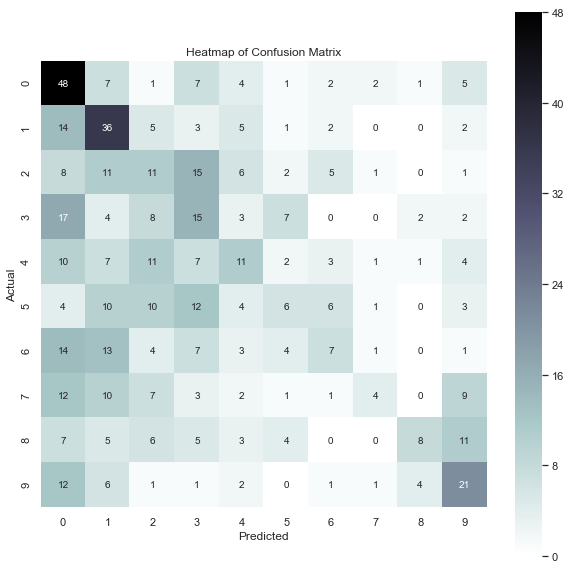

In [201]:
rfc = ensemble.RandomForestClassifier(n_estimators=100)

train_glove = rfc.fit(X_train_glove, y_train_glove)

y_pred_rfc = rfc.predict(X_test_glove)

print('training set score:', rfc.score(X_train_glove, y_train_glove))
print('\ntest set score:', rfc.score(X_test_glove, y_test_glove))

print(pd.crosstab(y_test_glove, y_pred_rfc, margins=True))
print(f1_score(y_test_glove, y_pred_rfc, average='macro'))
sns.heatmap(pd.crosstab(y_test_glove, y_pred_rfc), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

## Gradient-Boosted Decision Tree Model

training set score: 0.9965397923875432

test set score: 0.2750865051903114
col_0    0   1   2   3   4   5   6   7   8   9  All
row_0                                              
0       35   6   5   4   4   3   6   3   6   6   78
1       11  29   8   1   7   2   4   4   1   1   68
2        5   5  12  12  11   4   7   2   1   1   60
3        8   2   7  19   5   5   3   2   4   3   58
4        8   4   7   8  14   7   4   2   3   0   57
5        7   5   9   9   8  12   3   3   0   0   56
6       10   7   3   8   9   3   8   5   0   1   54
7        9   4   3   3   8   1   4   5   7   5   49
8        8   0   5   5   4   3   3   5   8   8   49
9        8   4   3   1   1   0   2   3  10  17   49
All    109  66  62  70  71  40  44  34  40  42  578
0.2606662571531614


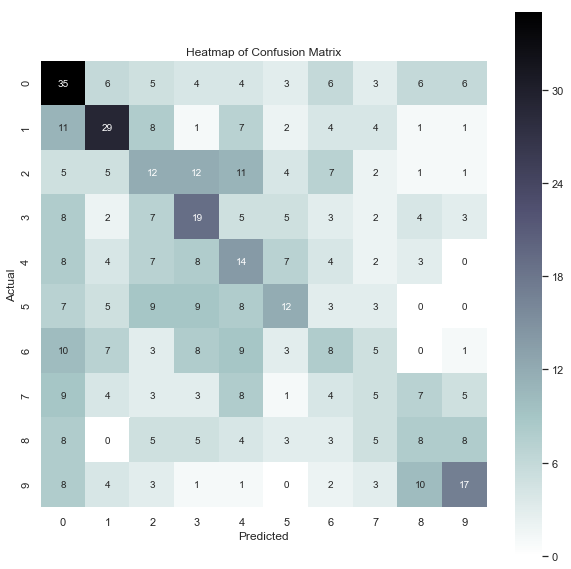

In [202]:
gbdt = ensemble.GradientBoostingClassifier(n_estimators=50, max_depth=4)

train_glove = gbdt.fit(X_train_glove, y_train_glove)

y_pred_gbdt = gbdt.predict(X_test_glove)

print('training set score:', gbdt.score(X_train_glove, y_train_glove))
print('\ntest set score:', gbdt.score(X_test_glove, y_test_glove))

gbdt_crosstab = pd.crosstab(y_test_glove, y_pred_gbdt)

print(pd.crosstab(y_test_glove, y_pred_gbdt, margins=True))
print(f1_score(y_test_glove, y_pred_gbdt, average='macro'))
sns.heatmap(gbdt_crosstab, annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

## KNN Classifier

training set score: 0.2975778546712803

test set score: 0.23183391003460208
col_0    0   1   2   3    4   5   6  7   8   9  All
row_0                                              
0       30  11   5   1   22   2   1  0   2   4   78
1       12  24  13   1   12   0   3  1   1   1   68
2        7  12  18   3   17   3   0  0   0   0   60
3       10   4  12   7   13   7   2  0   2   1   58
4        5   9  10   2   26   0   0  0   2   3   57
5        4   5  14   7   19   5   1  0   1   0   56
6        7  13   5   2   16   3   2  1   4   1   54
7        9   9   7   0   12   1   1  0   3   7   49
8        8   2  10   0   11   0   3  0   3  12   49
9       13   1   5   1    9   0   0  0   1  19   49
All    105  90  99  24  157  21  13  2  19  48  578
0.19413632705204278


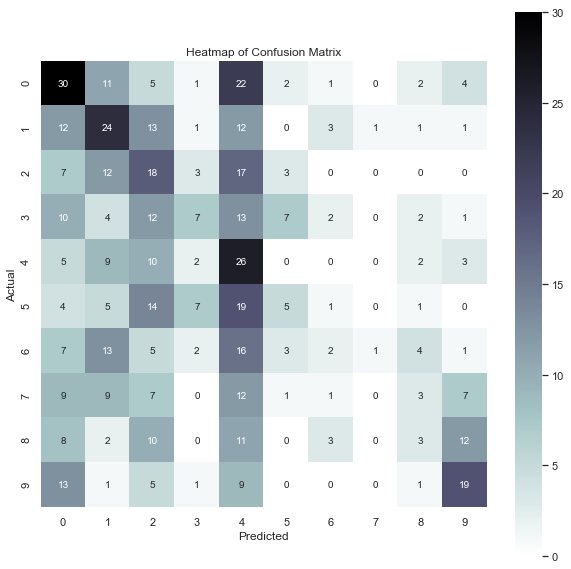

In [203]:
knn = KNeighborsClassifier(n_neighbors=37)

train_glove = knn.fit(X_train_glove, y_train_glove)

y_pred_knn = knn.predict(X_test_glove)

print('training set score:', knn.score(X_train_glove, y_train_glove))
print('\ntest set score:', knn.score(X_test_glove, y_test_glove))

knn_crosstab = pd.crosstab(y_test_glove, y_pred_knn)

print(pd.crosstab(y_test_glove, y_pred_knn, margins=True))
print(f1_score(y_test_glove, y_pred_knn, average='macro'))
sns.heatmap(knn_crosstab, annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

# 16.) Word2Vec

We are using the Google News pretrained Word2Vec model.

In [204]:
df1['text_tokenized'] = df1['cleaned_text2'].apply(lambda x: nltk.word_tokenize(x))

In [205]:
sentences = []

for sentence_group in df1['text_tokenized']:
    sentences.extend(sentence_group)

In [206]:
len(sentences)

176911

In [207]:
reviews = [review for review in df1['text_tokenized']]

In [208]:
model = gensim.models.KeyedVectors.load_word2vec_format ('GoogleNews-vectors-negative300.bin', binary=True)

In [209]:
vocab = model.wv.vocab.keys()

In [210]:
len(vocab)

3000000

In [211]:
print(model.similarity('pizza', 'burger'))
print(model.similarity('pizza', 'burrito'))
print(model.similarity('pizza', 'soup'))
print(model.similarity('pizza', 'sandwich'))
print(model.similarity('pizza', 'song'))
print(model.similarity('pizza', 'slow'))
print(model.similarity('pizza', 'service'))
print(model.similarity('slow', 'fast'))

0.6569692
0.63716435
0.49850947
0.6840402
0.15049168
0.06781992
0.18072188
0.5313692


In [212]:
def review2vec_w2v(text):
    
    w2v_vecs = []
    
    for word in text:
        try:
            w2v_vecs.append(model[word])
        except:
            continue

    w2v_vecs = np.array(w2v_vecs)
    v = w2v_vecs.sum(axis=0)
    if type(v) != np.ndarray:
        return(np.zeros(300))
    return(v / np.sqrt((v ** 2).sum()))

In [213]:
X_w = df1['text_tokenized'].values

In [214]:
X_train_w, X_test_w, y_train_w2v, y_test_w2v = train_test_split(X_w, y,
                                    test_size=0.25, stratify=bag_of_words_model['text_source'], random_state=0)

In [215]:
X_train_w2v = [review2vec_w2v(review) for review in X_train_w]
X_test_w2v = [review2vec_w2v(review) for review in X_test_w]

In [216]:
X_w2v = [review2vec_w2v(review) for review in X_w]

In [217]:
X_train_w2v = np.array(X_train_w2v)
X_test_w2v = np.array(X_test_w2v)

In [218]:
pd.DataFrame(X_train_w2v)

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,-0.033499,0.031011,-0.041454,0.170211,-0.023012,0.008874,0.067326,-0.089437,0.013659,0.137005,...,-0.003787,-0.001185,-0.102339,0.063408,0.019454,-0.040024,0.005012,-0.027274,0.048394,0.030283
1,-0.008139,0.020800,-0.000069,0.148626,-0.051806,0.024403,0.082709,-0.104991,0.026962,0.148208,...,-0.041862,0.002988,-0.093688,0.046340,-0.000101,-0.017130,0.026764,-0.065711,0.002537,-0.003232
2,0.068668,0.060306,-0.017010,0.084649,-0.044876,-0.017240,0.020881,-0.043058,0.093385,0.113816,...,-0.086627,0.006656,-0.110537,0.042139,0.008017,-0.045298,0.019131,-0.074406,0.081385,-0.049300
3,0.034369,0.051657,-0.030607,0.131654,-0.015851,-0.040706,0.002859,-0.108144,0.101402,0.071199,...,-0.039032,0.084401,-0.130763,0.011626,-0.045837,-0.035364,-0.016953,-0.044108,0.037106,0.015263
4,-0.016658,0.020518,0.044948,0.139230,-0.059872,0.055796,0.068050,-0.078745,0.009085,0.111068,...,-0.048352,-0.007571,-0.100419,0.093862,0.012875,-0.031311,0.018098,-0.016084,0.034098,0.001402
5,-0.005991,0.055672,-0.034250,0.152740,-0.071142,0.008484,0.048328,-0.086280,0.030478,0.086010,...,-0.046339,0.049636,-0.084353,0.080028,0.025384,-0.030292,0.007383,-0.053249,0.037068,-0.026642
6,0.000068,0.058562,-0.029073,0.159314,-0.050965,0.003686,0.017506,-0.077253,0.046413,0.130962,...,-0.079488,-0.002746,-0.065164,0.067105,0.008958,-0.051187,0.047708,-0.025729,0.045369,0.010861
7,0.026115,0.067264,0.006002,0.116404,-0.028885,-0.037068,0.040386,-0.055600,0.049511,0.096349,...,-0.054909,0.082350,-0.129501,0.049698,-0.034941,-0.015863,-0.001885,-0.065709,0.054744,-0.045190
8,0.021034,0.062255,-0.027211,0.155360,-0.035432,-0.038225,0.047503,-0.061470,0.019024,0.072324,...,-0.070902,0.067732,-0.087414,0.041815,0.011464,-0.052573,0.088246,-0.087280,0.043189,-0.003449
9,-0.003688,0.003773,0.016214,0.146302,0.014882,0.001601,0.055398,-0.150971,0.013761,0.117552,...,-0.052712,0.004283,-0.082642,0.008382,0.019732,-0.073451,0.045331,-0.052274,0.031200,0.000672


# 17.) Visualization of Word2Vec Vectors

## t-SNE

In [219]:
tsne = TSNE(n_components=2, verbose=1, perplexity=35, n_iter=1000)
tsne_results_w2v = tsne.fit_transform(X_w2v)

[t-SNE] Computing 106 nearest neighbors...
[t-SNE] Indexed 2312 samples in 0.016s...
[t-SNE] Computed neighbors for 2312 samples in 2.494s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2312
[t-SNE] Computed conditional probabilities for sample 2000 / 2312
[t-SNE] Computed conditional probabilities for sample 2312 / 2312
[t-SNE] Mean sigma: 0.132668
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.370560
[t-SNE] Error after 1000 iterations: 2.022397


In [220]:
tsne_results_w2v = pd.DataFrame(tsne_results_w2v, columns = ['x_tsne', 'y_tsne'])

In [221]:
df1['x_tsne_w2v'] = tsne_results_w2v['x_tsne']
df1['y_tsne_w2v'] = tsne_results_w2v['y_tsne']

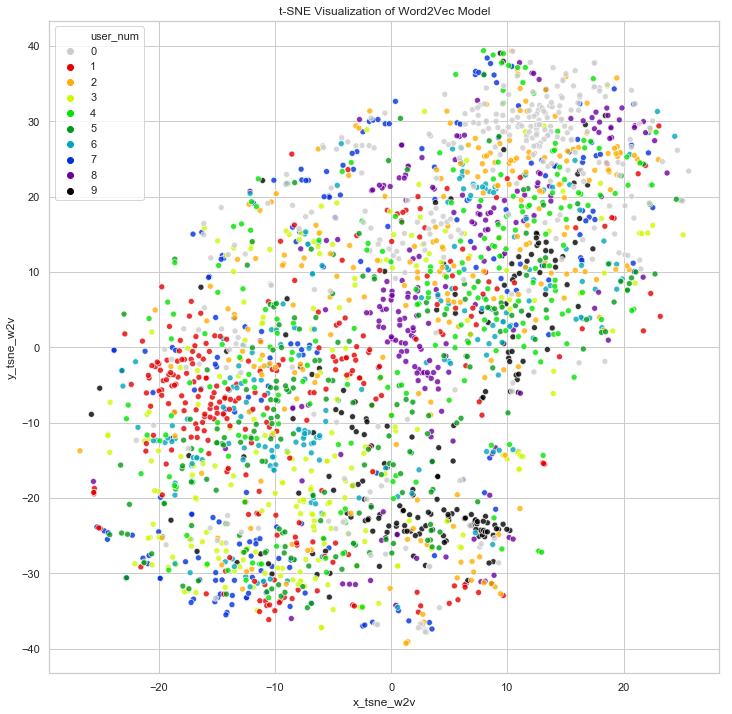

In [311]:
plt.rcParams['figure.figsize'] = (12, 12)
plt.title('t-SNE Visualization of Word2Vec Model')
sns.scatterplot(x='x_tsne_w2v', y='y_tsne_w2v', data=df1, palette='nipy_spectral_r',
                hue='user_num', legend='full', alpha=0.8)
plt.show()

## Cosine Similarity Heatmap

In [223]:
similarity_matrix = cosine_similarity(X_w2v)
similarity_df = pd.DataFrame(similarity_matrix)

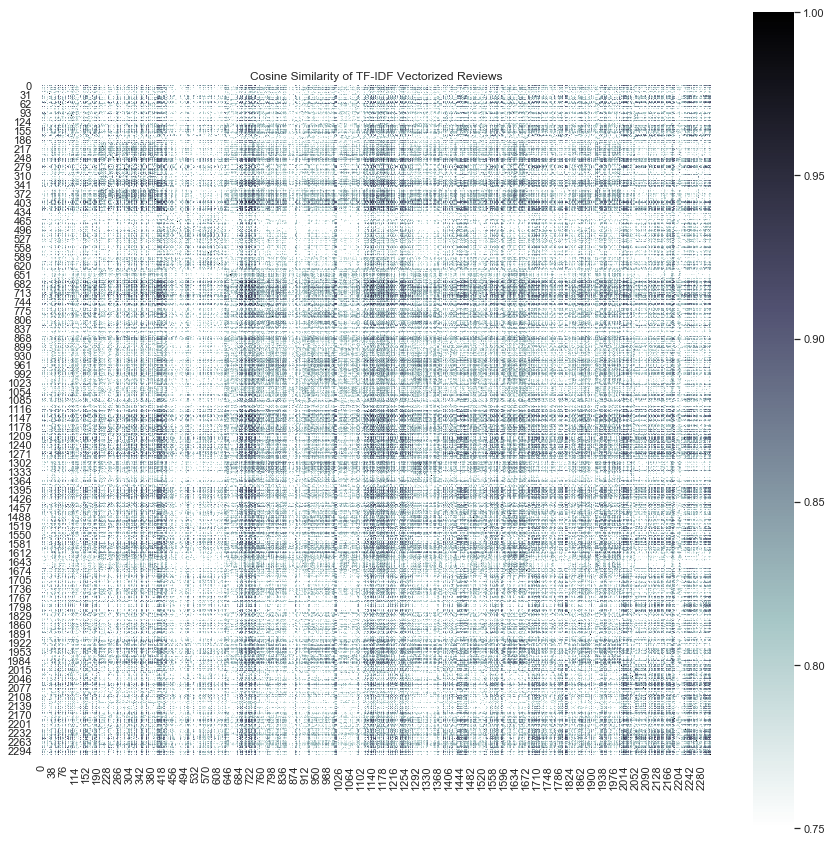

In [224]:
plt.rcParams['figure.figsize'] = (15, 15)

sns.heatmap(similarity_df, square=True, vmin=0.75, vmax=1, cmap='bone_r')
plt.title('Cosine Similarity of TF-IDF Vectorized Reviews')
plt.show()

plt.rcParams['figure.figsize'] = (15, 10)

# 18.) Word2Vec Classification

In [225]:
plt.rcParams['figure.figsize'] = (10, 10)

## Multinomial Naive Bayes Model

Naive Bayes assumes binary inputs, and so does not work with vectorized inputs that have negative values.

## Logistic Regression Model

(1734, 300) (1734,)
training set score: 0.3719723183391003

test set score: 0.2837370242214533
col_0    0    1   2    3   4   5   6  7  8   9  All
row_0                                              
0       52    6   2    7   0   0   2  0  0   9   78
1       22   40   1    3   1   0   0  0  0   1   68
2        9   15   4   22   7   2   1  0  0   0   60
3       10    2   3   26   4   7   2  1  1   2   58
4       18   11   6    9   5   1   2  1  0   4   57
5       10    9   2   18   2   4   4  1  0   6   56
6       13   16   1   12   2   1   5  1  0   3   54
7       13   13   1    4   0   1   2  4  0  11   49
8        9    7   3    4   0   1   7  0  0  18   49
9       12    8   2    2   0   0   0  1  0  24   49
All    168  127  25  107  21  17  25  9  1  78  578
0.21225500382793272


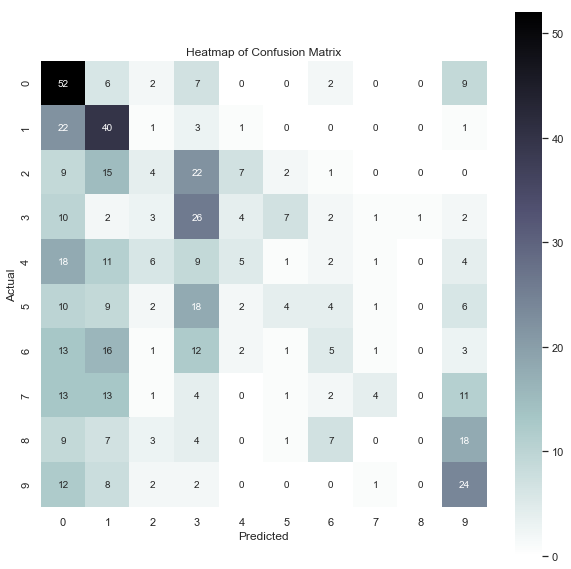

In [226]:
lr = LogisticRegression()
train_w2v = lr.fit(X_train_w2v, y_train_w2v)
print(X_train_w2v.shape, y_train_w2v.shape)
print('training set score:', lr.score(X_train_w2v, y_train_w2v))
print('\ntest set score:', lr.score(X_test_w2v, y_test_w2v))

y_pred_lr = lr.predict(X_test_w2v)

print(pd.crosstab(y_test_w2v, y_pred_lr, margins=True))
print(f1_score(y_test_w2v, y_pred_lr, average='macro'))
sns.heatmap(pd.crosstab(y_test_w2v, y_pred_lr), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

## Random Forest Model

training set score: 1.0

test set score: 0.28546712802768165
col_0    0   1   2    3   4   5   6  7   8   9  All
row_0                                              
0       56   5   0    7   1   0   0  0   1   8   78
1       13  37   2    5   4   1   2  2   0   2   68
2        8  10  11   18   5   5   3  0   0   0   60
3       16   4   7   20   3   5   1  0   0   2   58
4       19   7   5   11   8   0   3  0   1   3   57
5       13   2   5   17   6   6   1  1   2   3   56
6       16   8   1   12   3   2   5  3   1   3   54
7       13   6   7    3   6   2   1  0   1  10   49
8        7   5   3    8   1   3   5  0   2  15   49
9       15   1   3    2   3   0   0  2   3  20   49
All    176  85  44  103  40  24  21  8  11  66  578
0.2247365219680893


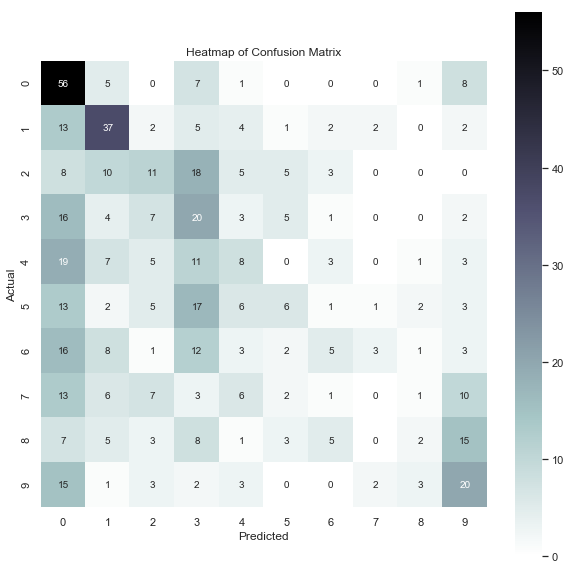

In [227]:
rfc = ensemble.RandomForestClassifier(n_estimators=100)

train_w2v = rfc.fit(X_train_w2v, y_train_w2v)

y_pred_rfc = rfc.predict(X_test_w2v)

print('training set score:', rfc.score(X_train_w2v, y_train_w2v))
print('\ntest set score:', rfc.score(X_test_w2v, y_test_w2v))

print(pd.crosstab(y_test_w2v, y_pred_rfc, margins=True))
print(f1_score(y_test_w2v, y_pred_rfc, average='macro'))
sns.heatmap(pd.crosstab(y_test_w2v, y_pred_rfc), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

## Gradient-Boosted Decision Tree Model

training set score: 0.9971164936562861

test set score: 0.2750865051903114
col_0   0   1   2   3   4   5   6   7   8   9  All
row_0                                             
0      33   7   3   8   4   7   6   3   5   2   78
1      10  31   7   2   4   3   6   1   1   3   68
2       3   4  11  13  13   8   5   2   1   0   60
3       8   3   5  14   8   9   2   2   4   3   58
4      11   3  14   6  12   2   4   3   1   1   57
5       6   7   6   9   5  11   5   2   2   3   56
6       6   4  11   3   6   3   9   5   2   5   54
7       9   3   4   3   3   2   4   8   4   9   49
8       6   2   2   5   2   8   2   3  12   7   49
9       7   1   1   2   4   1   4   6   5  18   49
All    99  65  64  65  61  54  47  35  37  51  578
0.26552620109362157


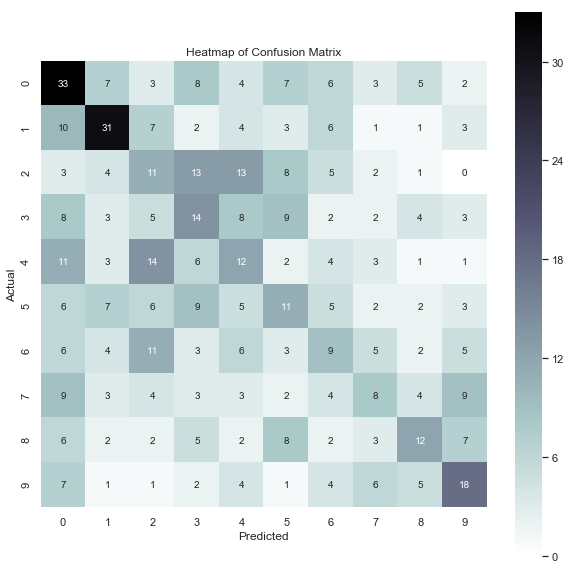

In [228]:
gbdt = ensemble.GradientBoostingClassifier(n_estimators=50, max_depth=4)

train_w2v = gbdt.fit(X_train_w2v, y_train_w2v)

y_pred_gbdt = gbdt.predict(X_test_w2v)

print('training set score:', gbdt.score(X_train_w2v, y_train_w2v))
print('\ntest set score:', gbdt.score(X_test_w2v, y_test_w2v))

gbdt_crosstab = pd.crosstab(y_test_w2v, y_pred_gbdt)

print(pd.crosstab(y_test_w2v, y_pred_gbdt, margins=True))
print(f1_score(y_test_w2v, y_pred_gbdt, average='macro'))
sns.heatmap(gbdt_crosstab, annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

## KNN Classifier

training set score: 0.2958477508650519

test set score: 0.2093425605536332
col_0    0    1    2   3    4   5  6   8   9  All
row_0                                            
0       31   20    4   1   17   0  0   0   5   78
1       12   31   14   1    9   0  0   0   1   68
2        5   11   17   4   19   2  1   1   0   60
3        9    5   12   3   17   6  1   4   1   58
4        4   14   15   3   17   1  1   2   0   57
5        6    6   15   4   22   1  1   1   0   56
6       10   14    4   2   17   0  1   4   2   54
7        7    7    9   2   14   1  0   0   9   49
8       12    3    7   0    6   0  3   6  12   49
9       14    4    5   0    9   1  0   2  14   49
All    110  115  102  20  147  12  8  20  44  578
0.16587094765673


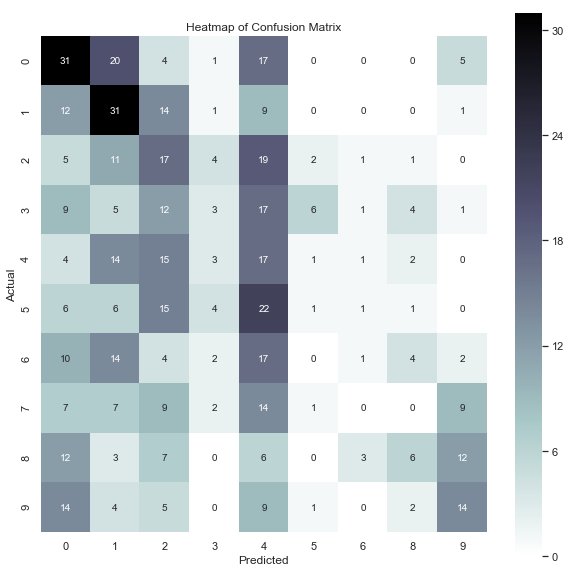

In [229]:
knn = KNeighborsClassifier(n_neighbors=37)

train_w2v = knn.fit(X_train_w2v, y_train_w2v)

y_pred_knn = knn.predict(X_test_w2v)

print('training set score:', knn.score(X_train_w2v, y_train_w2v))
print('\ntest set score:', knn.score(X_test_w2v, y_test_w2v))

knn_crosstab = pd.crosstab(y_test_w2v, y_pred_knn)

print(pd.crosstab(y_test_w2v, y_pred_knn, margins=True))
print(f1_score(y_test_w2v, y_pred_knn, average='macro'))
sns.heatmap(knn_crosstab, annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

# 19.) Logistic Regression Optimization

In [288]:
X = bag_of_words_model.drop(['text_sentence', 'text_source'], 1)
y = bag_of_words_model['text_source'].values

In [289]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                    test_size=0.25, stratify=bag_of_words_model['text_source'], random_state=0)

In [292]:
lr = LogisticRegression(max_iter=200)

param_grid = {'C':[0.1, 1, 10, 100], 'penalty':['l1', 'l2'],
              'class_weight':['balanced', None], 'solver':['liblinear', 'saga']
             }

lr_gridsearch = GridSearchCV(lr, param_grid, return_train_score=True, cv=5, n_jobs=-1)
lr_gridsearch.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=200, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'C': [0.1, 1, 10, 100], 'penalty': ['l1', 'l2'], 'class_weight': ['balanced', None], 'solver': ['liblinear', 'saga']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=0)

In [293]:
pd.DataFrame(lr_gridsearch.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_class_weight,param_penalty,param_solver,params,split0_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.368316,0.044009,0.016541,0.002610,0.1,balanced,l1,liblinear,"{'C': 0.1, 'class_weight': 'balanced', 'penalt...",0.622857,...,0.591696,0.027147,32,0.677746,0.678700,0.691697,0.697122,0.688218,0.686697,0.007484
1,231.209262,0.534581,0.014056,0.007598,0.1,balanced,l1,saga,"{'C': 0.1, 'class_weight': 'balanced', 'penalt...",0.668571,...,0.660323,0.009603,29,0.828757,0.840433,0.836101,0.846763,0.846983,0.839807,0.006872
2,0.878367,0.089681,0.011642,0.003482,0.1,balanced,l2,liblinear,"{'C': 0.1, 'class_weight': 'balanced', 'penalt...",0.825714,...,0.795271,0.023918,17,0.994220,0.992058,0.992780,0.996403,0.993534,0.993799,0.001490
3,189.596331,0.567083,0.008364,0.001898,0.1,balanced,l2,saga,"{'C': 0.1, 'class_weight': 'balanced', 'penalt...",0.825714,...,0.797578,0.026189,15,0.996387,0.997112,0.997112,0.997122,0.996408,0.996828,0.000352
4,0.245931,0.002064,0.007779,0.002353,0.1,None,l1,liblinear,"{'C': 0.1, 'class_weight': None, 'penalty': 'l...",0.620000,...,0.597463,0.019577,30,0.677746,0.676534,0.696029,0.684173,0.686063,0.684109,0.006982
5,226.653803,1.133976,0.006811,0.000689,0.1,None,l1,saga,"{'C': 0.1, 'class_weight': None, 'penalty': 'l...",0.614286,...,0.595156,0.018080,31,0.676301,0.680866,0.692419,0.680576,0.684626,0.682958,0.005416
6,0.593558,0.022726,0.008712,0.002116,0.1,None,l2,liblinear,"{'C': 0.1, 'class_weight': None, 'penalty': 'l...",0.825714,...,0.795271,0.027469,17,0.993497,0.992058,0.992058,0.996403,0.993534,0.993510,0.001587
7,188.739552,1.085356,0.006898,0.000539,0.1,None,l2,saga,"{'C': 0.1, 'class_weight': None, 'penalty': 'l...",0.811429,...,0.790081,0.024737,20,0.985549,0.988448,0.987004,0.989928,0.987069,0.987599,0.001482
8,0.356441,0.037361,0.008376,0.002333,1,balanced,l1,liblinear,"{'C': 1, 'class_weight': 'balanced', 'penalty'...",0.771429,...,0.745675,0.023633,25,0.998555,0.997112,0.996390,0.997122,0.997126,0.997261,0.000706
9,257.687041,1.880107,0.007128,0.000378,1,balanced,l1,saga,"{'C': 1, 'class_weight': 'balanced', 'penalty'...",0.814286,...,0.779123,0.034000,21,0.997832,0.999278,0.997834,0.997842,0.999282,0.998414,0.000707


In [294]:
lr_gridsearch.best_estimator_

LogisticRegression(C=1, class_weight='balanced', dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=200,
          multi_class='ovr', n_jobs=1, penalty='l2', random_state=None,
          solver='liblinear', tol=0.0001, verbose=0, warm_start=False)

(1734, 5112) (1734,)
Training set score: 1.0

Test set score: 0.828719723183391
col_0   0   1   2   3   4   5   6   7   8   9  All
row_0                                             
0      64   4   2   0   4   1   0   2   1   0   78
1       0  59   1   2   1   1   1   1   1   1   68
2       2   1  46   0   2   0   4   0   4   1   60
3       0   4   0  48   1   1   2   1   0   1   58
4       1   2   3   1  43   0   2   0   5   0   57
5       1   1   0   0   3  49   1   0   0   1   56
6       0   1   0   0   0   0  51   1   0   1   54
7       2   3   2   3   3   2   0  34   0   0   49
8       1   0   1   0   2   0   0   0  45   0   49
9       0   0   3   1   0   2   2   0   1  40   49
All    71  75  58  55  59  56  63  39  57  45  578
(578, 5112) (578,)
0.8274475655360227


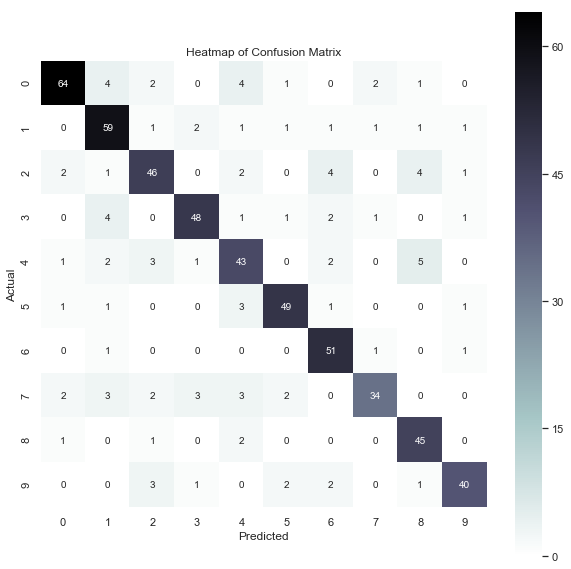

In [296]:
lr = LogisticRegression(C=1, class_weight='balanced', penalty='l2',
          solver='liblinear', max_iter=200)

train = lr.fit(X_train, y_train)
print(X_train.shape, y_train.shape)
print('Training set score:', lr.score(X_train, y_train))
print('\nTest set score:', lr.score(X_test, y_test))

y_pred_lr = lr.predict(X_test)

print(pd.crosstab(y_test, y_pred_lr, margins=True))
print(X_test.shape, y_test.shape)
print(f1_score(y_test, y_pred_lr, average='macro'))
sns.heatmap(pd.crosstab(y_test, y_pred_lr), annot=True, square=True, cmap='bone_r')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Heatmap of Confusion Matrix')
plt.show()

In [302]:
lr_cvscore = cross_val_score(lr, X, y, cv=10)

In [303]:
lr_cvscore

array([0.84322034, 0.85042735, 0.85470085, 0.83760684, 0.82683983,
       0.86580087, 0.87445887, 0.8245614 , 0.85462555, 0.81415929])

In [304]:
lr_cvscore.mean()

0.8446401195022624

In [305]:
lr_cvscore.std()

0.018088459110267418

# 20.) Conclusions

Bag of words seemed to outperform other word models for this dataset, and Logistic Regression outperformed other classifiers. This contradicted expectations, but sometimes the less-sophisticated model wins out.

# Sources

Main Dataset:
https://www.kaggle.com/yelp-dataset/yelp-dataset

GloVe Tutorial:
https://www.kaggle.com/abhishek/approaching-almost-any-nlp-problem-on-kaggle/notebook

t-SNE Tutorials:
https://distill.pub/2016/misread-tsne/
https://lvdmaaten.github.io/tsne/